In [9]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import random
import timeit
import sklearn
from sklearn import preprocessing


## Load Data

In [3]:
seed = 5
data_path = "ObesityDataSet_raw_and_data_sinthetic.csv"

In [4]:
import sklearn.model_selection

# Read data
data = pd.read_csv(data_path, header=0)


to_encode = ['Gender', 'family_history_with_overweight', 'CAEC', 'SMOKE', 'FAVC', 'SCC', 'CALC', 'MTRANS', 'NObeyesdad']
label_encoder = preprocessing.LabelEncoder()

df = data[to_encode]
df = df.apply(label_encoder.fit_transform)

data = data.drop(to_encode, axis=1)
data = pd.concat([data, df], axis=1)


data.describe()

# Last column represnets label, and others are features
features = np.array(data.iloc[:, 0:-1])
classes = np.array(data.iloc[:, -1])


In [5]:
from sklearn.preprocessing import StandardScaler

features = StandardScaler().fit_transform(features)


In [6]:
print(features.shape)


(2111, 16)


# Init

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')


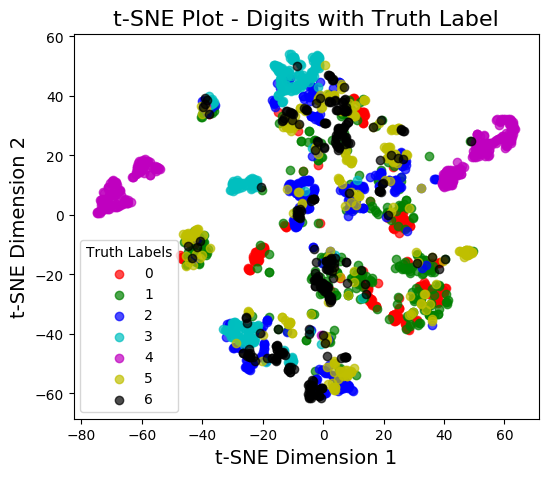

In [6]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=seed)
X_2d = tsne.fit_transform(features)
target_ids = range(7)
y = classes

plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'grey', 'orange', 'purple'
for i, c in zip(target_ids, colors):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c=c, label=str(i), alpha =0.7)
plt.legend(title="Truth Labels")
plt.title('t-SNE Plot - Digits with Truth Label', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.savefig('output/s0_cluster_init.png')
plt.show()


# Step 1: Run Clustering on dataset

## 1. K-Means

In [16]:
from sklearn.cluster import KMeans


range_n_clusters = np.arange(1,50,1)
inertia = []
for n_clusters in range_n_clusters:
    k_means_clustering = KMeans(n_clusters=n_clusters, random_state=2)
    k_means_clustering.fit(features)
    
    inertia.append(k_means_clustering.inertia_)
inertia = np.array(inertia)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


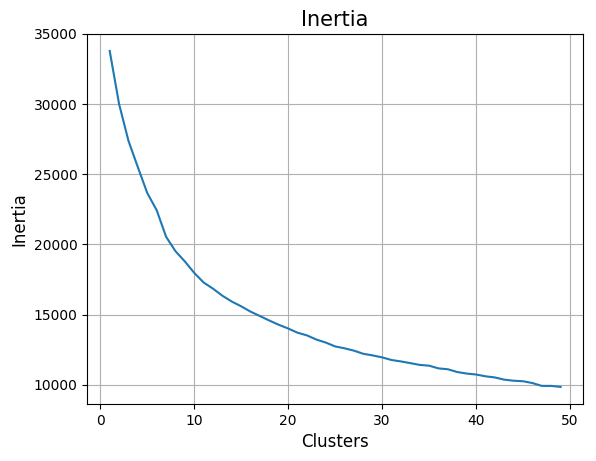

In [8]:
fig, ax = plt.subplots()

ax.plot(range_n_clusters,inertia)
ax.set_xlabel('Clusters',fontsize=12)
ax.set_ylabel('Inertia',fontsize=12)
ax.set_title('Inertia',fontsize=15)
ax.grid()
plt.savefig('output/s1_kmeans_inertia_vs_clusters.png')
fig.show()

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


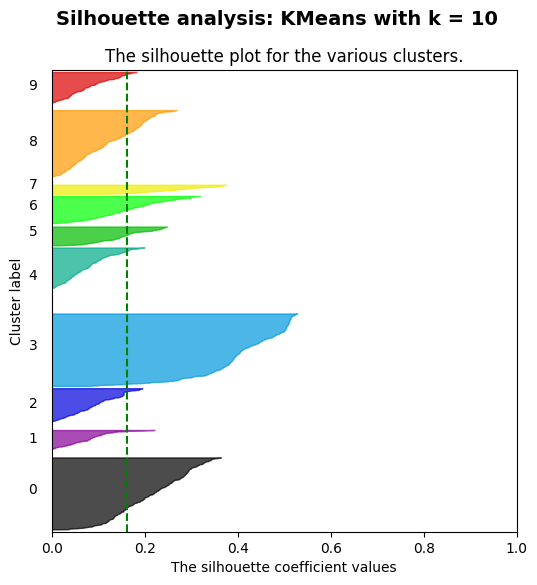

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


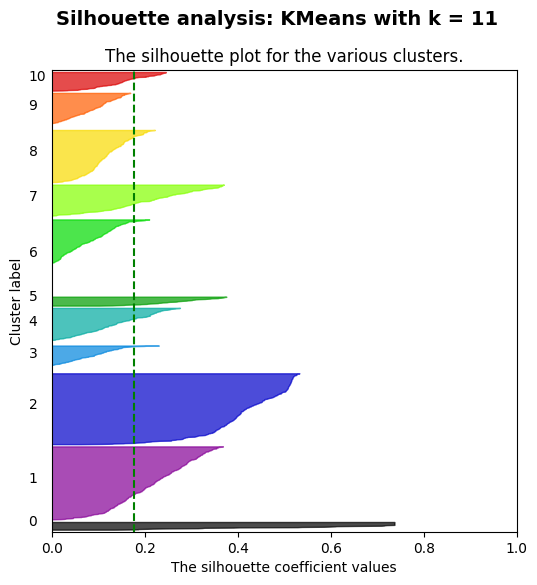

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


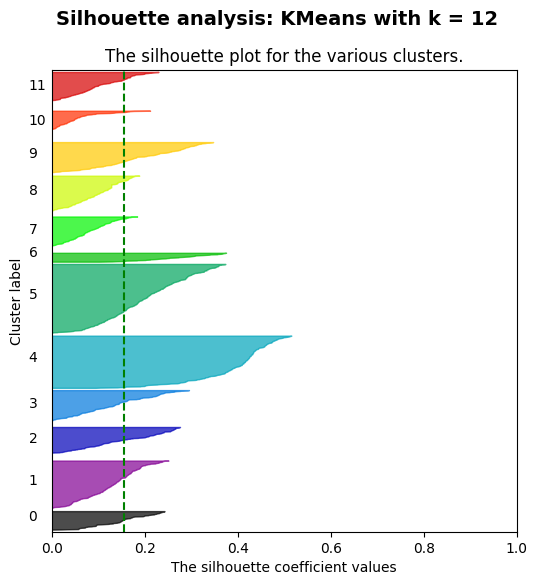

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


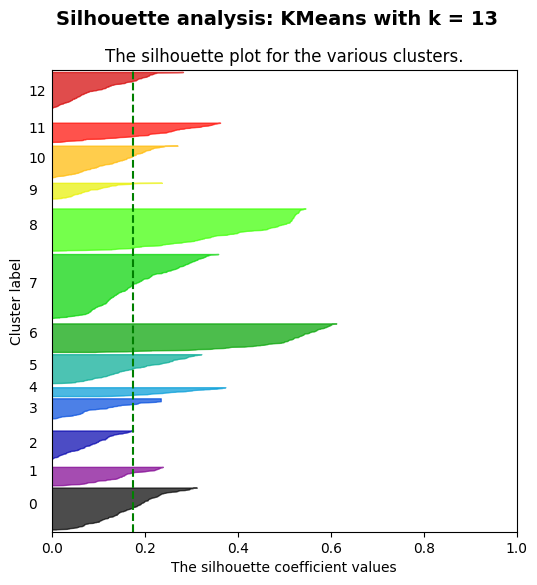

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


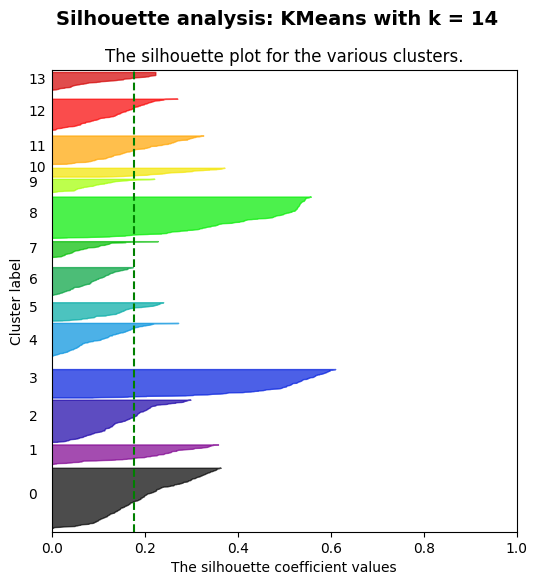

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


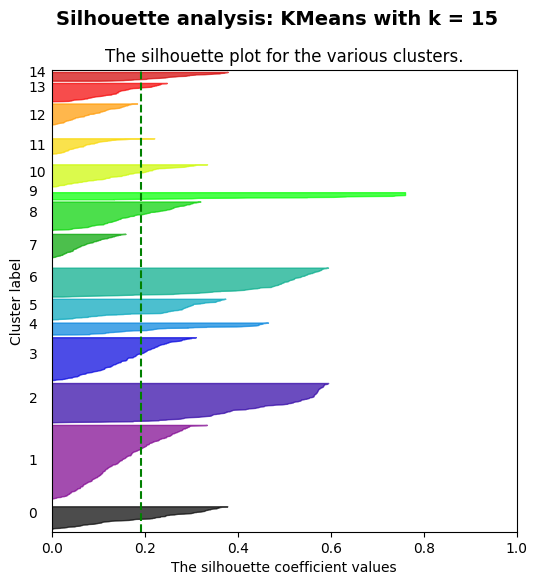

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


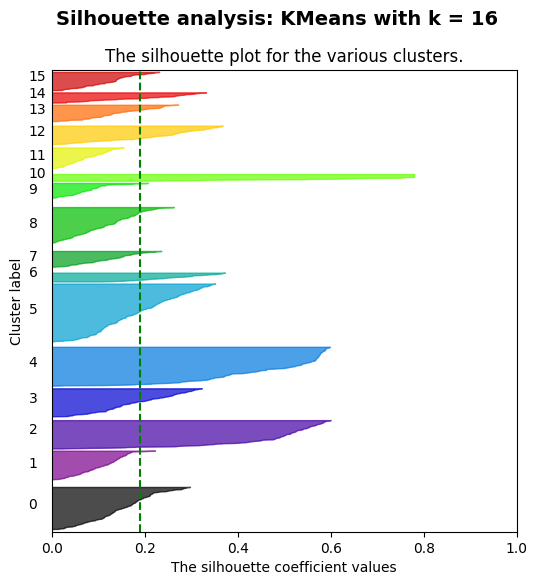

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


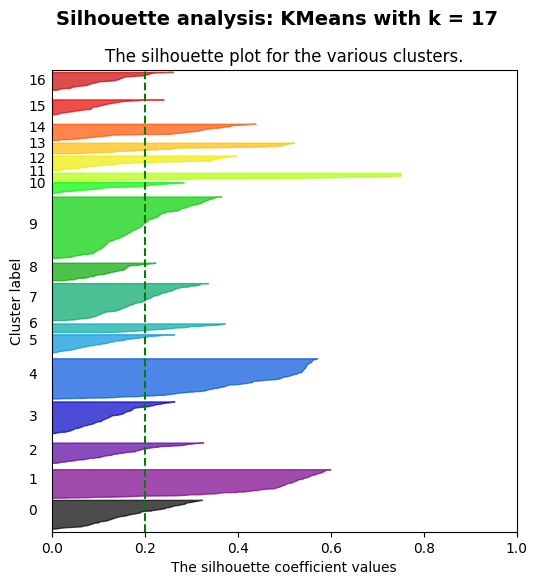

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


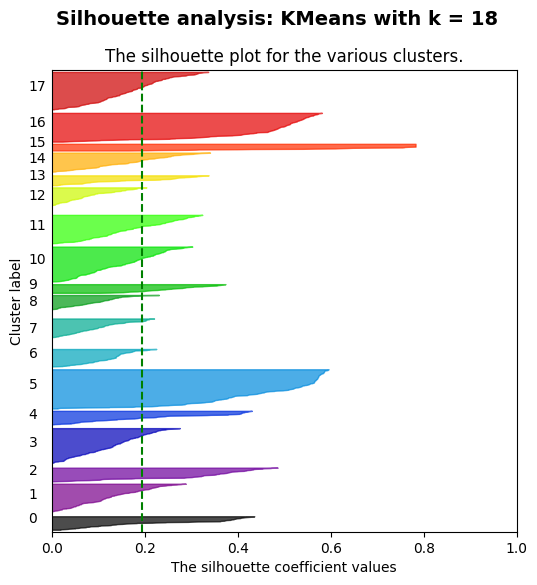

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


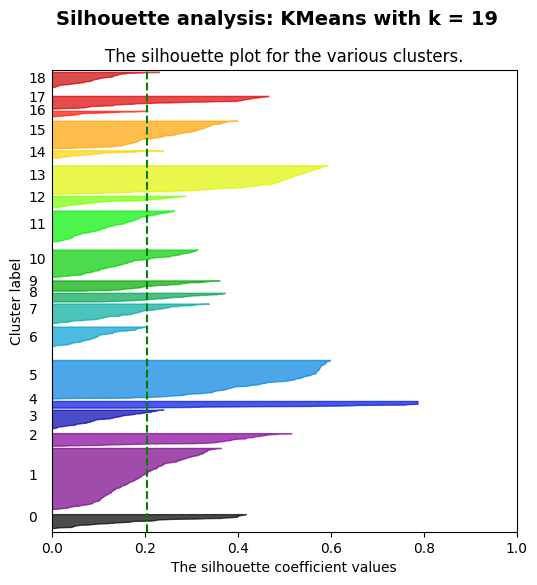

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


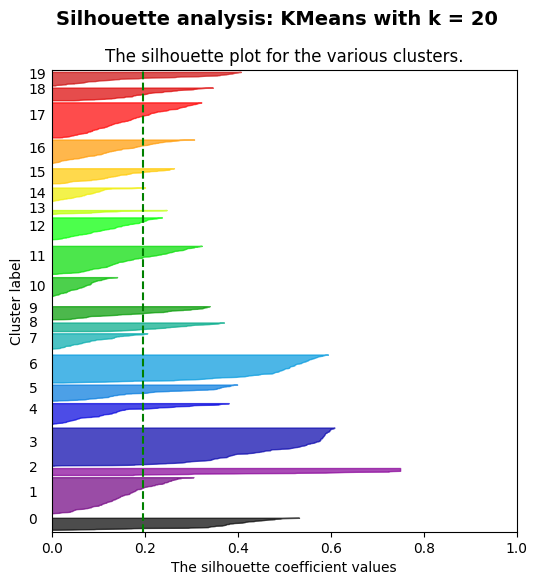

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


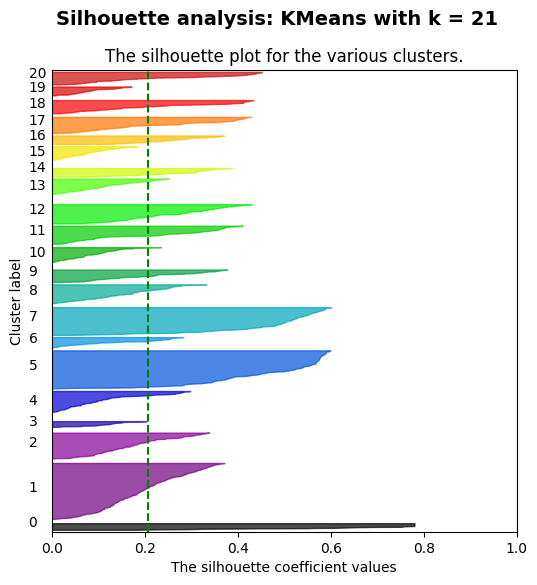

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


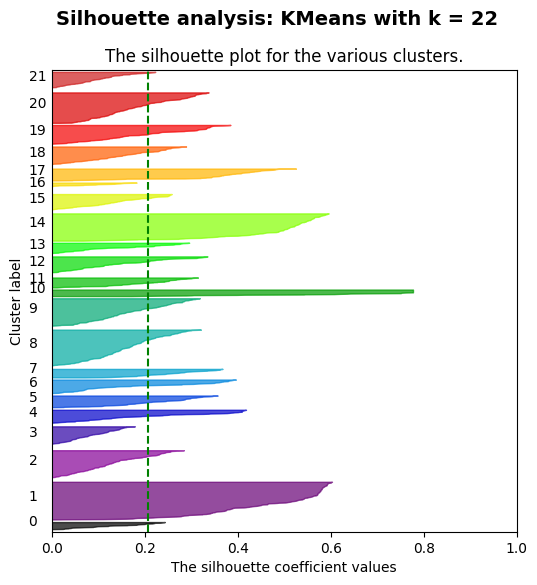

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


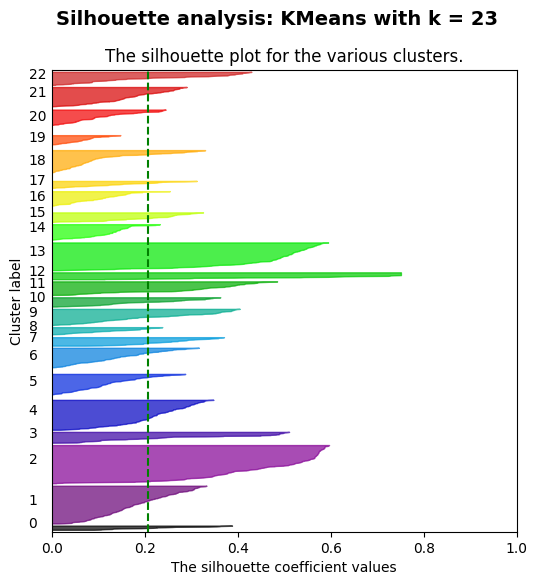

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


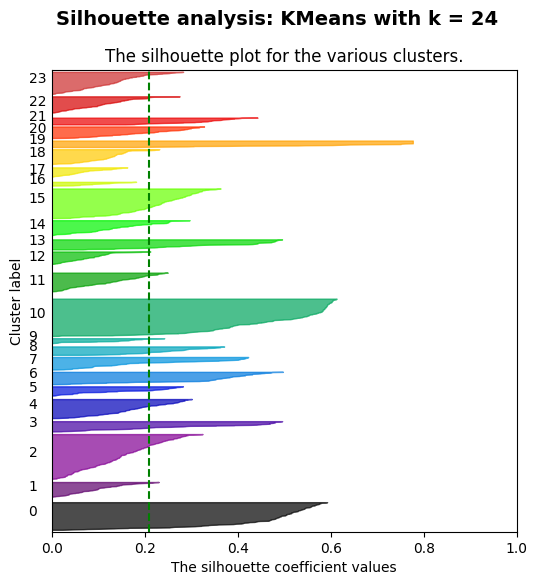

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


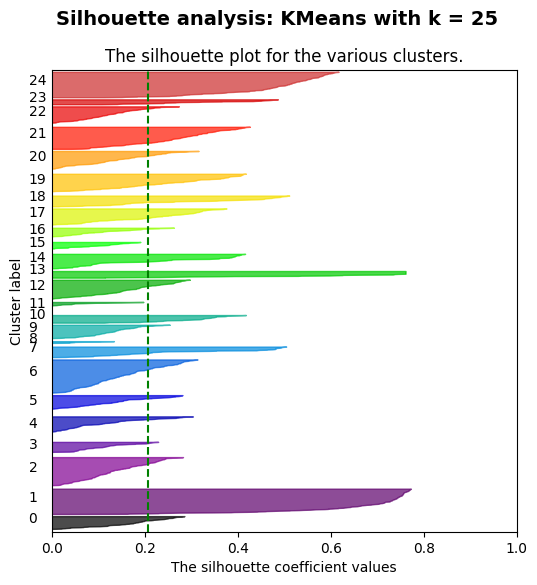

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


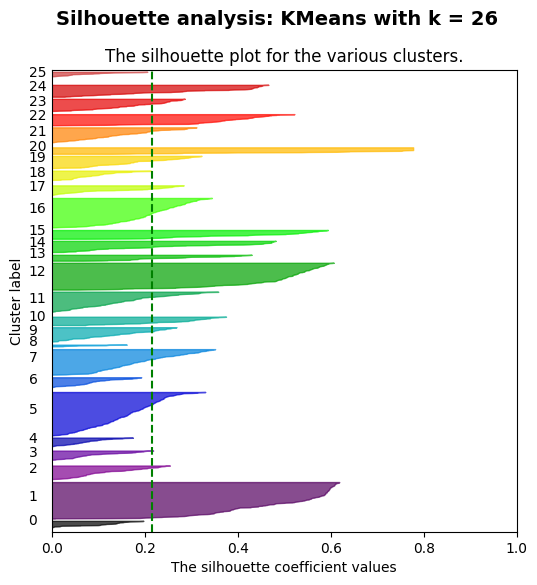

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


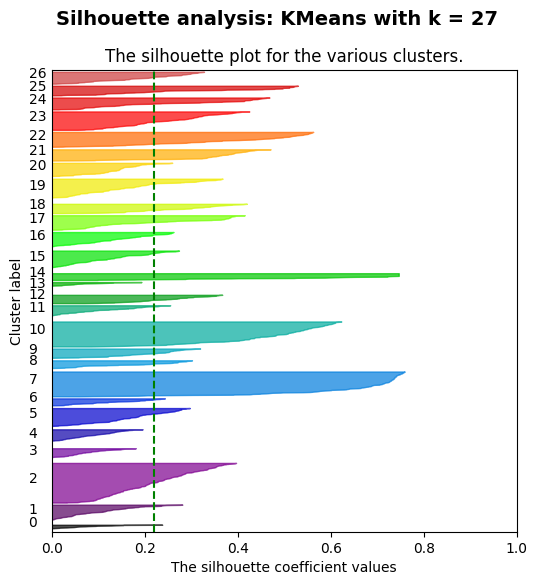

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


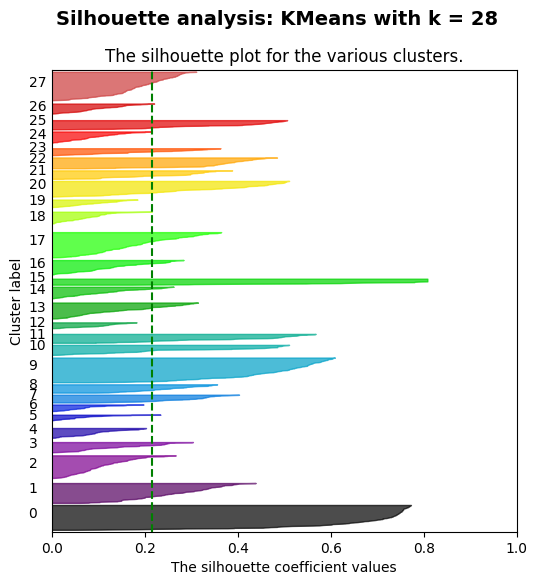

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


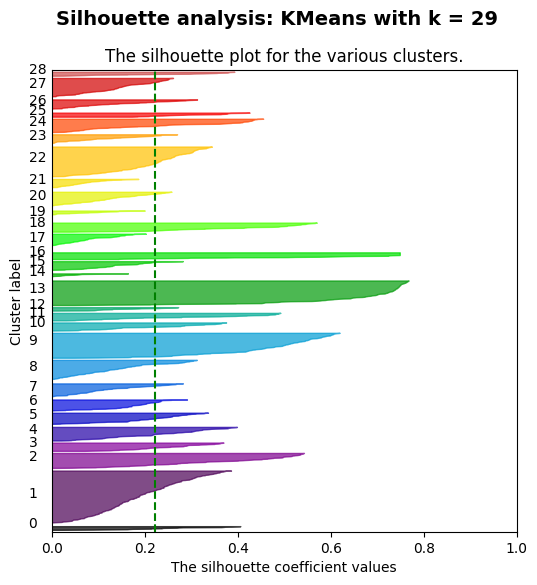

In [9]:
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, silhouette_samples, v_measure_score

range_n_clusters = np.arange(10, 30, 1)

silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []

for n_clusters in range_n_clusters:

    fig, ax1 = plt.subplots()
    fig.set_figheight(6)
    fig.set_figwidth(6)
    
    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed)
    cluster_labels = clusterer.fit_predict(features)

    silhouette_avg = silhouette_score(features, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label", labelpad=20)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

    fig.suptitle(
        "Silhouette analysis: KMeans with k = %d"
        % n_clusters,
        fontsize=14,fontweight="bold")
    save_name = 'output/s1_kmeans_silhouette_k=' + str(n_clusters)+'.png'
    plt.savefig(save_name)

    plt.show()

[10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29]


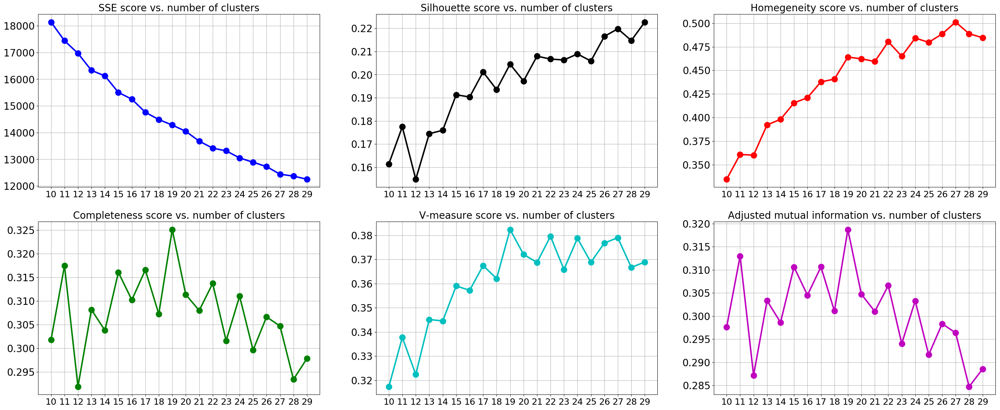

In [10]:

plt.figure(figsize=(35,14))

plot_range = range_n_clusters
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=20)
plt.xticks(plot_range, fontsize=18)
plt.yticks(fontsize=20)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=20)
plt.xticks(plot_range, fontsize=18)
plt.yticks(fontsize=20)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=20)
plt.xticks(plot_range,fontsize=18)
plt.yticks(fontsize=20)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=20)
plt.xticks(plot_range, fontsize=18)
plt.yticks(fontsize=20)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=20)
plt.xticks(plot_range, fontsize=18)
plt.yticks(fontsize=20)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=20)
plt.xticks(plot_range, fontsize=18)
plt.yticks(fontsize=20)

plt.savefig('output/s1_kmeans_scores_vs_clusters.png')
plt.show()

Inertia:  14049.050219761733
Silhouette score:  0.19723219045941412
Adjusted Mutual Information (AMI) score:  0.30474685865755086


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


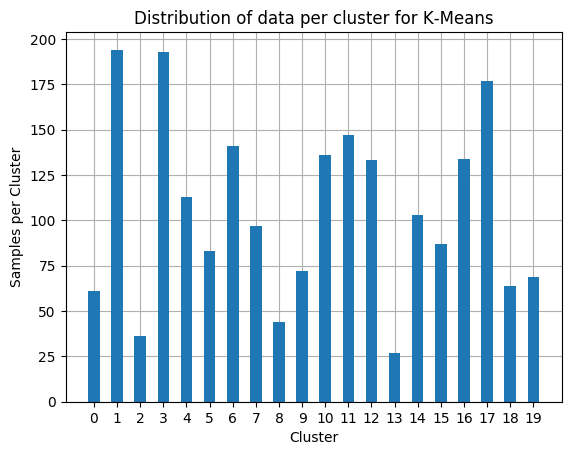

In [11]:
k = 20
k_means_clustering = KMeans(n_clusters=k, random_state=seed)
k_means_clustering.fit(features)
print('Inertia: ', k_means_clustering.inertia_)
silhouette_score_value = silhouette_score(features, k_means_clustering.labels_)
print('Silhouette score: ', silhouette_score_value)
adjusted_mutual_info_score_value = adjusted_mutual_info_score(classes, k_means_clustering.labels_)
print('Adjusted Mutual Information (AMI) score: ', adjusted_mutual_info_score_value)

plt.figure()
plt.hist(k_means_clustering.labels_, bins=np.arange(0, k + 1) - 0.5, rwidth=0.5, zorder=2)
plt.xticks(np.arange(0, k))
plt.xlabel('Cluster')
plt.ylabel('Samples per Cluster')
plt.title('Distribution of data per cluster for K-Means')
plt.grid()
plt.savefig('output/s1_kmeans_samples_vs_clusters.png')


In [12]:
# Estimating average running time of k-means
import time
time_km_clusters = 50
time_km_list = []
for k in range(time_km_clusters):
    time_km = []
    print(k)
    for i in range(10):
        t1=time.time()
        km = KMeans(n_clusters=20,n_init=10,max_iter=500).fit(X=features)
        t2=time.time()
        delta = t2-t1
        time_km.append(delta)
    time_km = np.array(time_km)
    avg_time_km = time_km.mean()
    time_km_list.append(avg_time_km)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


# 2. Gaussian Mixture Model

In [39]:
from sklearn.mixture import GaussianMixture


In [14]:
degree_features = features.shape[1]

lowest_bic = np.infty
num_components_values = range(1, degree_features + 1)

covariances = ['spherical', 'tied', 'diag', 'full']

bic = np.zeros((len(covariances),len(num_components_values)))

for i, covariance in enumerate(covariances):
    for j, num_components in enumerate(num_components_values):
        gmm = GaussianMixture(n_components=num_components, covariance_type=covariance)
        gmm.fit(features)
        bic[i][j] = gmm.bic(features)
        if bic[i][j] < lowest_bic:
            lowest_bic = bic[i][j]
            print("Lowest BIC currently for", covariance, num_components)
            best_gmm = gmm

Lowest BIC currently for spherical 1
Lowest BIC currently for spherical 2
Lowest BIC currently for spherical 3
Lowest BIC currently for spherical 4
Lowest BIC currently for spherical 5
Lowest BIC currently for spherical 6
Lowest BIC currently for spherical 7
Lowest BIC currently for spherical 8
Lowest BIC currently for spherical 9
Lowest BIC currently for spherical 11
Lowest BIC currently for spherical 12
Lowest BIC currently for spherical 13
Lowest BIC currently for spherical 14
Lowest BIC currently for tied 3
Lowest BIC currently for tied 4
Lowest BIC currently for tied 7
Lowest BIC currently for tied 8
Lowest BIC currently for tied 9
Lowest BIC currently for tied 13
Lowest BIC currently for tied 15
Lowest BIC currently for diag 2
Lowest BIC currently for diag 4
Lowest BIC currently for diag 6
Lowest BIC currently for diag 7
Lowest BIC currently for diag 8
Lowest BIC currently for diag 10
Lowest BIC currently for diag 11
Lowest BIC currently for diag 13
Lowest BIC currently for diag 

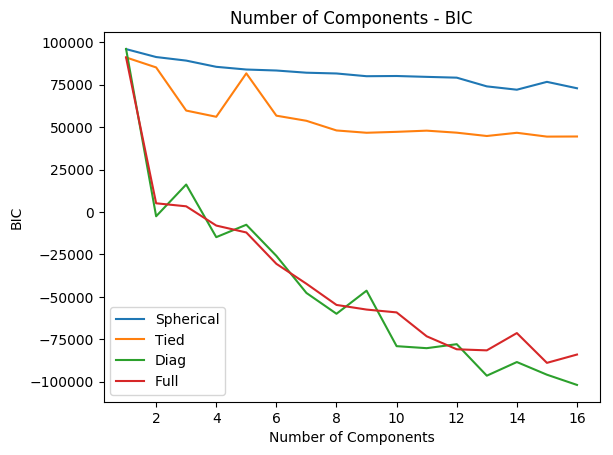

In [15]:
fig, ax1 = plt.subplots()

ax1.plot(num_components_values, bic[0], label = 'Spherical')
ax1.plot(num_components_values, bic[1], label = 'Tied')
ax1.plot(num_components_values, bic[2], label = 'Diag')
ax1.plot(num_components_values, bic[3], label = 'Full')
ax1.legend()
# ax1.xticks(range(1, degree_mkt,1))
ax1.set_title("Number of Components - BIC")
ax1.set_xlabel("Number of Components")
ax1.set_ylabel("BIC")

plt.savefig('output/s1_gm_bic.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


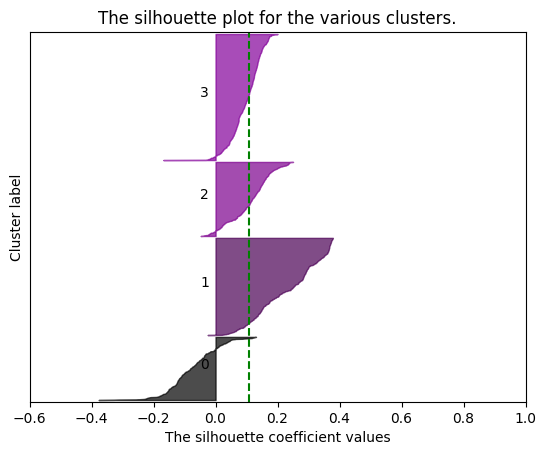

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


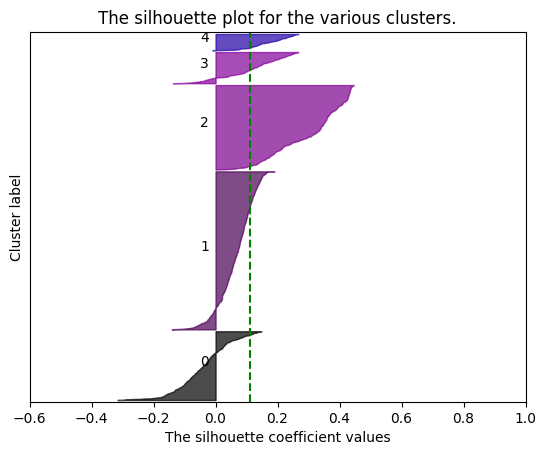

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


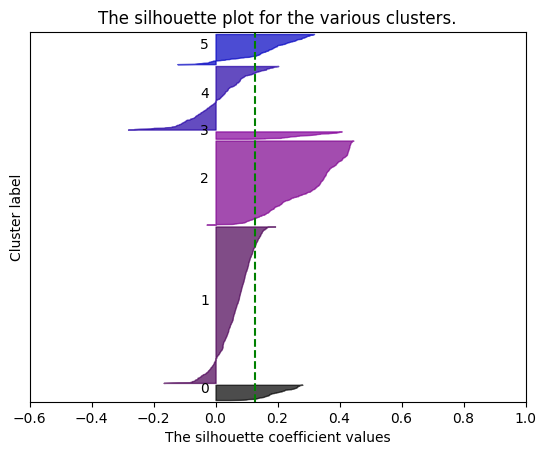

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


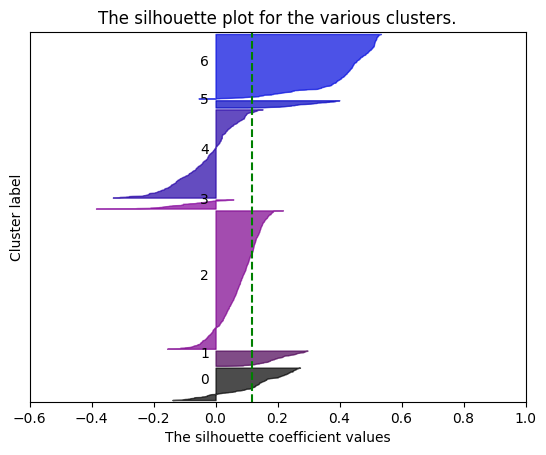

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


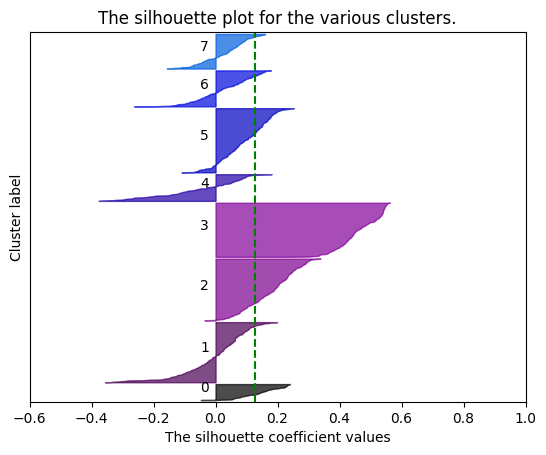

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


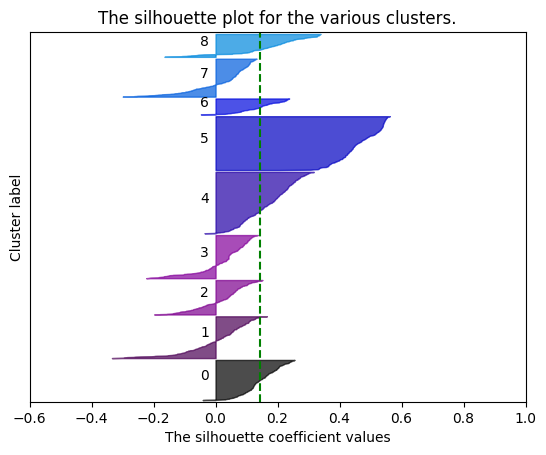

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


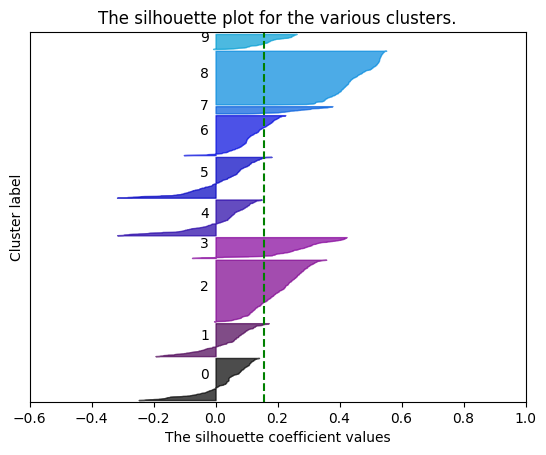

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


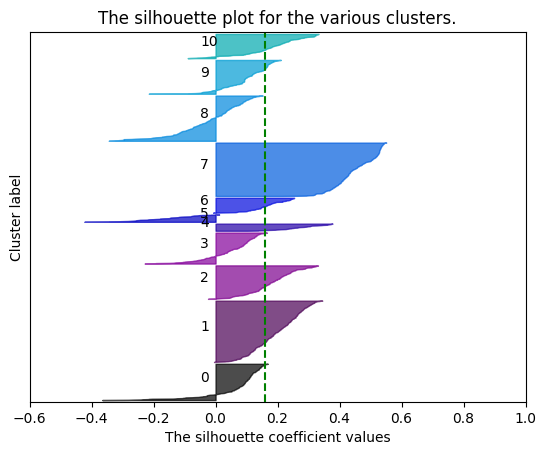

In [16]:
# Code taken from scikit-learn examples (https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
#https://www.geeksforgeeks.org/ml-v-measure-for-evaluating-clustering-performance/

range_n_components = np.arange(4, 12, 1)
silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []


for n_components in range_n_components:
    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features) + (n_components + 1) * 10])

    clusterer = GaussianMixture(n_components=n_components, covariance_type='full')
    cluster_labels = clusterer.fit_predict(features)

    silhouette_avg = silhouette_score(features, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features, cluster_labels)

    y_lower = 10
    for i in range(n_components):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.6,-0.4,-0.2,0, 0.2, 0.4, 0.6, 0.8, 1])
    
    save_name = 'output/s1_gm_silhouette_c=' + str(n_components)+'.png'
    plt.savefig(save_name)
    plt.show()

[ 4  5  6  7  8  9 10 11]


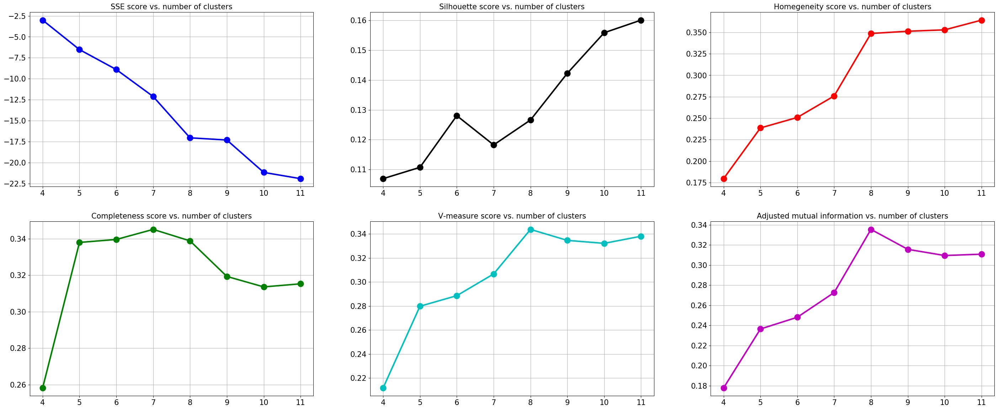

In [17]:
plt.figure(figsize=(35,14))

plot_range = range_n_components
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/s1_gm_scores_vs_clusters.png')
plt.show()

In [18]:
# Estimating average running time of Gaussian Mixture Model

time_gm_clusters = 50
time_gm_list = []
for g in range(time_gm_clusters):
    time_gm = []
    print(g)
    for i in range(10):
        t1=time.time()
        gm = GaussianMixture(n_components=6,n_init=10,tol=1e-5,
                         covariance_type='full',max_iter=500).fit(features)        
        t2=time.time()
        delta = t2-t1
        time_gm.append(delta)
    time_gm = np.array(time_gm)
    avg_time_gm = time_gm.mean()
    time_gm_list.append(avg_time_gm)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


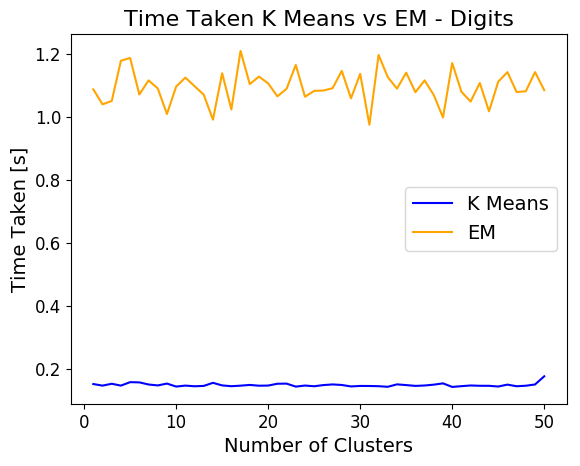

In [19]:
range_time_cluster = np.arange(1, 51)

time_km_list = np.array(time_km_list)
time_gm_list = np.array(time_gm_list)

# time_km_mean = np.mean(time_km_list)
# time_gm_mean = np.mean(time_gm_list)
# time_km_std = np.std(time_km_list)
# time_gm_std = np.std(time_gm_list)

# Compare timings
plt.plot(range_time_cluster, time_km_list, color ='b',label='K Means')
# plt.fill_between(range_time_cluster, time_km_mean+time_km_std, time_km_mean-time_km_std, alpha=0.5, color ='b')

plt.plot(range_time_cluster, time_gm_list, color ='orange',label='EM')
# plt.fill_between(range_time_cluster, time_gm_mean+time_gm_std, time_gm_mean-time_gm_std, alpha=0.5, color ='orange')

plt.title('Time Taken K Means vs EM - Digits', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)

plt.savefig('output/s1_km_gm_time.png')
plt.show()

# Cluster for step 1

In [20]:
kmeans_digits_labels = KMeans(n_clusters=20, random_state=seed, max_iter = 1000).fit_predict(features)
gmm_digits_labels = GaussianMixture(n_components=6, random_state=seed, max_iter = 1000).fit_predict(features)


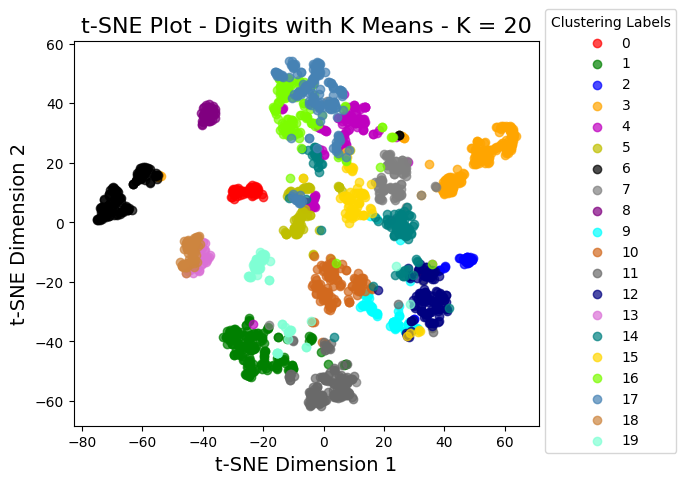

In [21]:
# Clustering and visualization
y = kmeans_digits_labels
target_ids = range(0, 25)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan','chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine'

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with K Means - K = 20', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.savefig('output/s1_cluster_km.png')
plt.show()

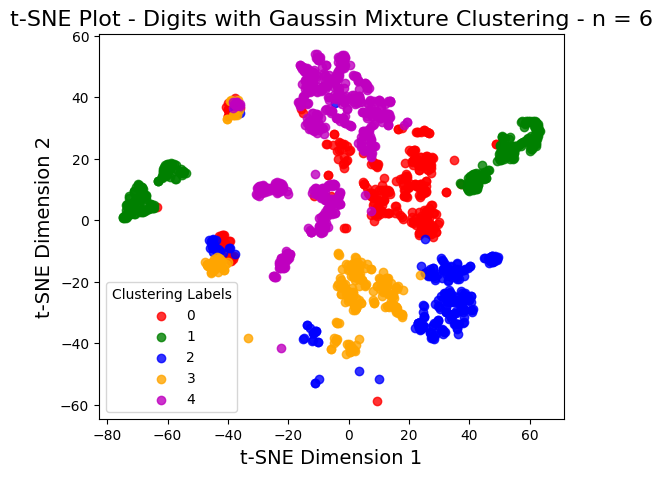

In [22]:
y = gmm_digits_labels
target_ids = range(0, 20)

plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'orange', 'm'
for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.8)
plt.legend(title="Clustering Labels")
plt.title('t-SNE Plot - Digits with Gaussin Mixture Clustering - n = 6', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.savefig('output/s1_cluster_gm.png')
plt.show()

# Step 2: Apply Dimensionality reduction

## 1. PCA

In [23]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(features)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

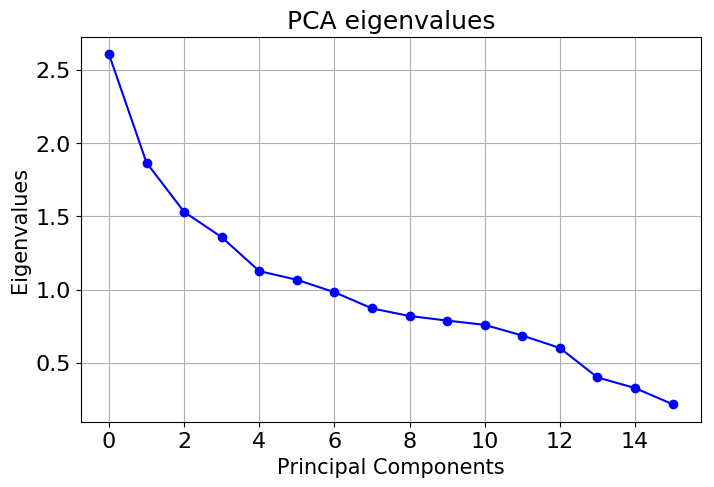

In [24]:
plt.figure(figsize=(8,5))
plt.title("PCA eigenvalues", fontsize=18)
plt.plot(pca.explained_variance_,'b-o')
plt.grid(True)
plt.xticks(fontsize=16)
plt.xlabel("Principal Components",fontsize=15)
plt.yticks(fontsize=16)
plt.ylabel("Eigenvalues",fontsize=15)
plt.savefig('output/step2/s2_pca_eignvalues.png')
plt.show()

In [25]:
# pca = PCA()
# x_new = pca.fit_transform(features)

# def myplot(score, coeff, classes, labels=None):
#     xs = score[:,0]
#     ys = score[:,1]
#     n = coeff.shape[0]
#     scalex = 1.0/(xs.max() - xs.min())
#     scaley = 1.0/(ys.max() - ys.min())
#     plt.scatter(xs * scalex,ys * scaley, c = classes)
#     for i in range(n):
#         plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'black',alpha = 0.7)
#         if labels is None:
#             plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'r', ha = 'center', va = 'center', fontsize=10)
#         else:
#             plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'r', ha = 'center', va = 'center', fontsize=10)
# plt.xlim(-1,1)
# plt.ylim(-1,1)
# plt.xlabel("PC{}".format(1))
# plt.ylabel("PC{}".format(2))
# plt.grid()

# myplot(x_new[:,0:2], np.transpose(pca.components_[0:2, :]), classes)

# plt.savefig('output/step2/s2_pca_eignvalues.png')

# plt.show()

[0.16278132 0.27932396 0.37491235 0.45971568 0.53005198 0.59670553
 0.658058   0.71249852 0.76370399 0.81296224 0.86039567 0.90327306
 0.94084042 0.96588051 0.98639247 1.        ]


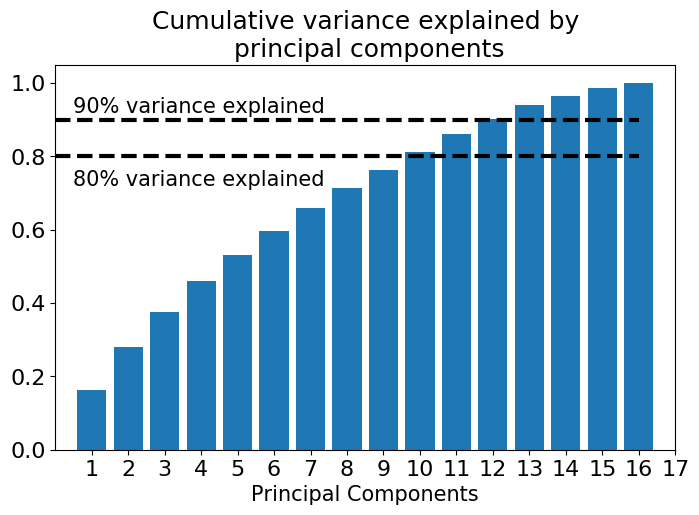

In [26]:
# How much variance is explained by principal components?

pca_explained_var = pca.explained_variance_ratio_
cum_explaiend_var = pca_explained_var.cumsum()

print(cum_explaiend_var)

plt.figure(figsize=(8,5))
plt.title("Cumulative variance explained by\n principal components", fontsize=18)
plt.bar(range(1,17),cum_explaiend_var)
plt.xticks([i for i in range(1,18)],fontsize=16)
plt.xlabel("Principal Components",fontsize=15)
plt.yticks(fontsize=16)
plt.xlim(0,17)
plt.hlines(y=0.8,xmin=0,xmax=16,linestyles='dashed',lw=3)
plt.text(x=0.5,y=0.72,s="80% variance explained",fontsize=15)
plt.hlines(y=0.9,xmin=0,xmax=16,linestyles='dashed',lw=3)
plt.text(x=0.5,y=0.92,s="90% variance explained",fontsize=15)

plt.savefig('output/step2/s2_pca_cumulative_var.png')
plt.show()


## 2. ICA

In [27]:
from sklearn.decomposition import FastICA
import scipy

ica = FastICA()
ic  = ica.fit_transform(features)
columns=["IC"+str(i) for i in range(ic.shape[1])]
ic_df = pd.DataFrame(ic, columns=columns)
foo = ica.fit(features)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/decomposition/fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


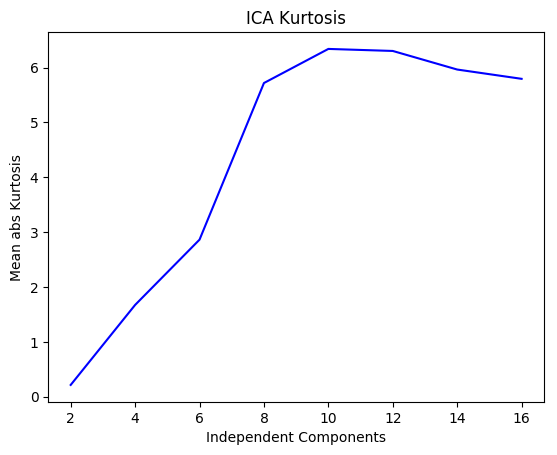

In [28]:

dimensions = list(np.arange(2, features.shape[1]+1, 2))
#dims.append(X.shape[1])
ica = FastICA(random_state=seed)
kurt = []
for dim in dimensions:
    ica.set_params(n_components=dim)
    tmp = ica.fit_transform(features)
    tmp = pd.DataFrame(tmp)
    tmp = tmp.kurt(axis=0)
    kurt.append(tmp.abs().mean())
    
plt.figure()
plt.title("ICA Kurtosis")
plt.xlabel("Independent Components")
plt.ylabel("Mean abs Kurtosis")
plt.plot(dimensions, kurt, 'b-')
plt.grid(False)

plt.savefig('output/step2/s2_ica_kurtosis.png')
plt.show()

## 3. Random Projection

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 17).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 17).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 17).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/s

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 19).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 19).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 19).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/s

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 20).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 20).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 20).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/s

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 22).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 22).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 22).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/s

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 24).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 24).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/random_projection.py:376: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (16 < 24).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/s

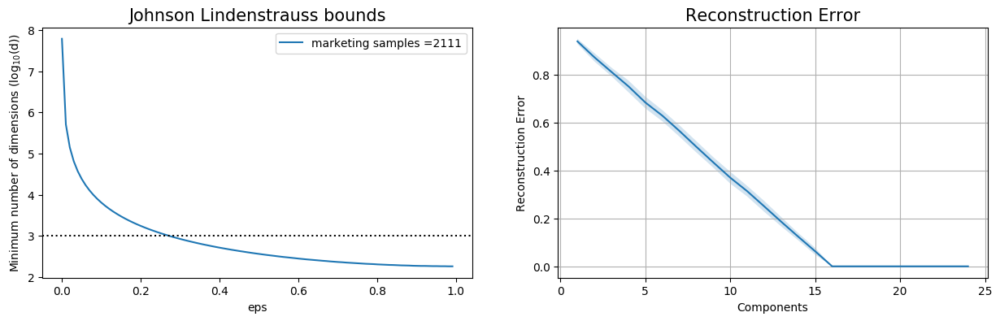

In [29]:
from sklearn.random_projection import SparseRandomProjection, johnson_lindenstrauss_min_dim
from sklearn.random_projection import GaussianRandomProjection

from scipy.linalg import pinv
from sklearn.metrics import mean_squared_error

rp_components_range = np.arange(1, 25)


fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figheight(4)
fig.set_figwidth(15)

eps = np.arange(0.001, 0.999, 0.01)
m = features.shape[0]

min_dim = johnson_lindenstrauss_min_dim(n_samples=m, eps=eps)
label='marketing samples ='+ str(m)

ax1.plot(eps, np.log10(min_dim), label=label) 
ax1.set_xlabel('eps')
ax1.set_ylabel('Minimum number of dimensions (log$_{10}$(d))')
ax1.axhline(y=3, color='k', linestyle=':')
ax1.set_title("Johnson Lindenstrauss bounds",fontsize=15)
ax1.legend()

reconstruction_error2 = []
reconstruction_variance2 = []

for i in rp_components_range:
    mean_mse = []
    for j in range(0, 100):
        rp = GaussianRandomProjection(n_components=i)
        X_RP = rp.fit(features)
        w = X_RP.components_
        p = pinv(w)
        reconstructed = ((p@w)@(features.T)).T
        mean_mse.append(mean_squared_error(features, reconstructed))
    reconstruction_variance2.append(np.std(mean_mse))
    reconstruction_error2.append(np.mean(mean_mse))

reconstruction_error2 = np.array(reconstruction_error2)

ax2.plot(rp_components_range,reconstruction_error2)
ax2.fill_between(rp_components_range, reconstruction_error2 - reconstruction_variance2, reconstruction_error2 + reconstruction_variance2, alpha=0.2)
ax2.set_xlabel('Components')
ax2.set_ylabel('Reconstruction Error')
ax2.set_title("Reconstruction Error",fontsize=15)

ax2.grid()

plt.savefig('output/step2/s2_rp_error.png')




## 4. t-SNE

In [7]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state=seed)

X_tr = tsne.fit_transform(features)
X_tr.shape

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')


(2111, 2)

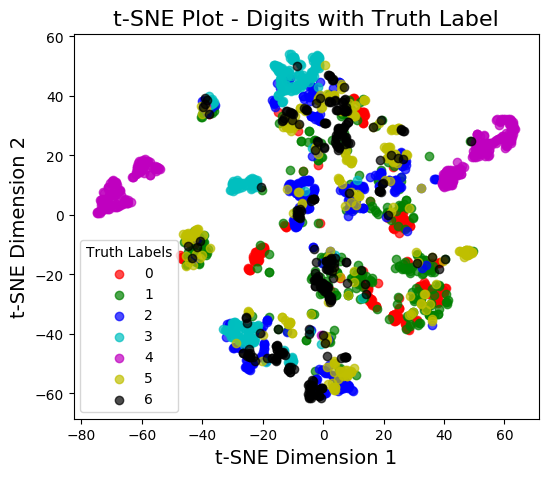

In [14]:
# # dimensions = list(np.arange(2, features.shape[1]+1, 2))


# kurt = []
# for dim in dimensions:
#     tsne = TSNE(n_components=2, random_state=seed)
#     tmp = tsne.fit_transform(features)
    
#     tmp = pd.DataFrame(tmp)
#     tmp = tmp.kurt(axis=0)
#     kurt.append(tmp.abs().mean())

# plt.figure()
# plt.title("LDA Kurtosis")
# plt.xlabel("Independent Components")
# plt.ylabel("Mean abs Kurtosis")
# plt.plot(dimensions, kurt, 'b-')
# plt.grid(False)
# plt.savefig('output/step2/s2_lda_kurtosis.png')
# plt.show()

colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'grey', 'orange', 'purple'


# plt.figure(figsize=(6, 5))
# for i in range(X_tr.shape[0]):
#     plt.text(X_tr[i, 0], X_tr[i, 1], str(classes[i]),
#              color=colors,
#              fontdict={'weight': 'bold', 'size': 9})
    


y = classes
target_ids = range(7)
plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'grey', 'orange', 'purple'
for i, c in zip(target_ids, colors):
    plt.scatter(X_tr[y == i, 0], X_tr[y == i, 1], c=c, label=str(i), alpha =0.7)
plt.legend(title="Truth Labels")
plt.title('t-SNE Plot - Digits with Truth Label', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.savefig('output/s2_tsne_cluster.png')
plt.show()

# Step 3: Dimensionality Reduction, then Clustering

## 1.1 PCA & K-Means

In [76]:
features_PCA = PCA().fit_transform(features)

range_n_clusters = np.arange(1,50,1)
inertia = []
for n_clusters in range_n_clusters:
    k_means_clustering = KMeans(n_clusters=n_clusters, random_state=seed)
    k_means_clustering.fit(features_PCA)
    
    inertia.append(k_means_clustering.inertia_)
inertia = np.array(inertia)

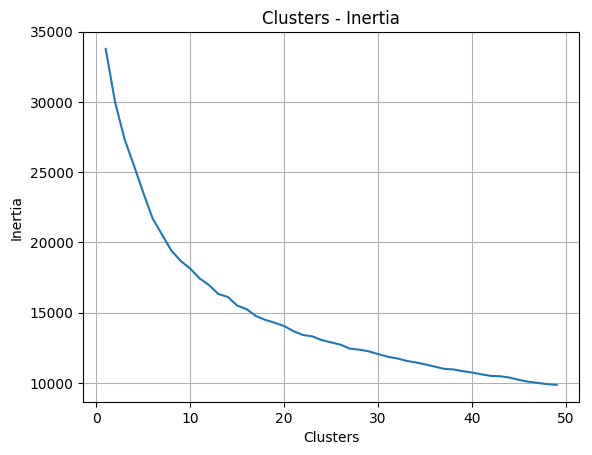

In [77]:
plt.plot(range_n_clusters,inertia)
plt.xlabel('Clusters')
plt.ylabel('Inertia')
plt.title('Clusters - Inertia')
plt.grid()
plt.savefig('output/step3/s3_pca_kmeans_inertia_vs_clusters.png')
plt.show()

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of

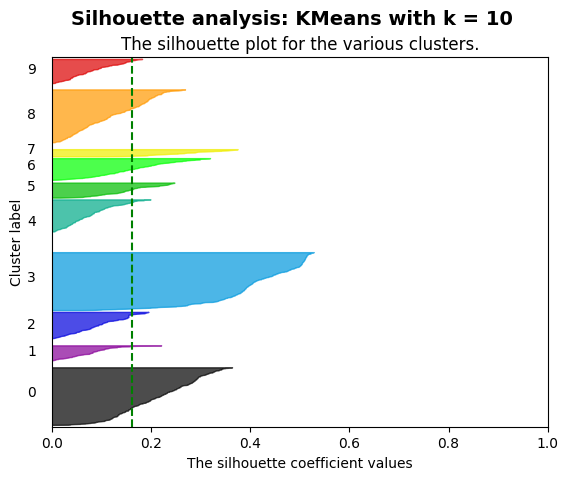

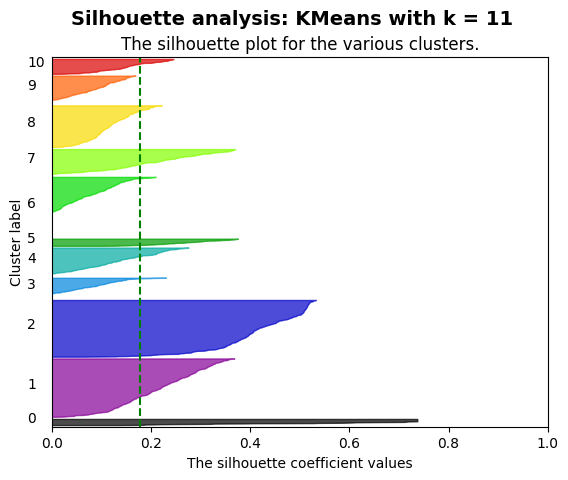

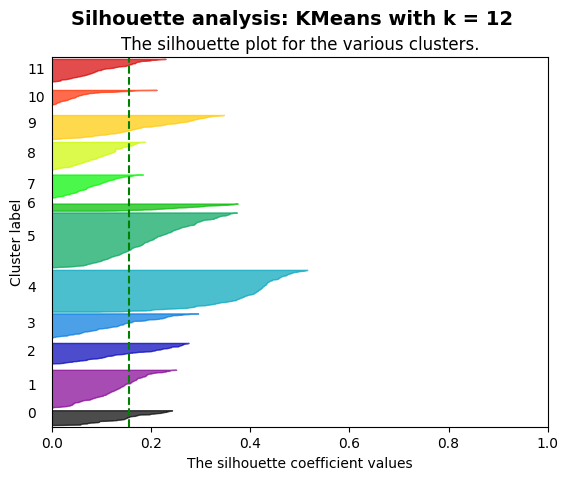

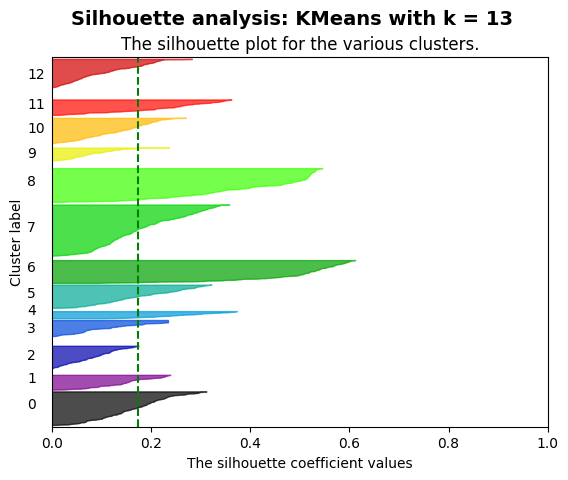

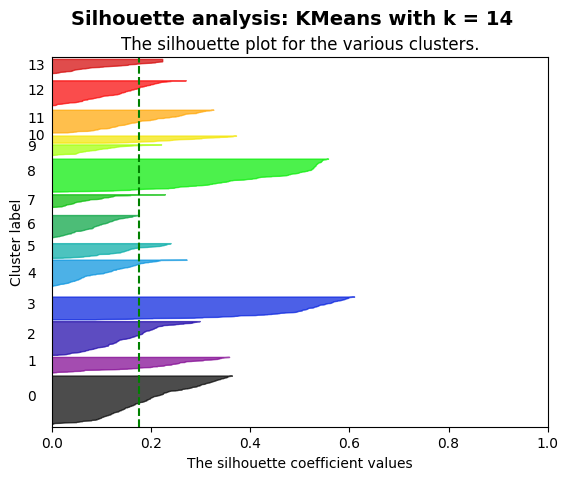

...

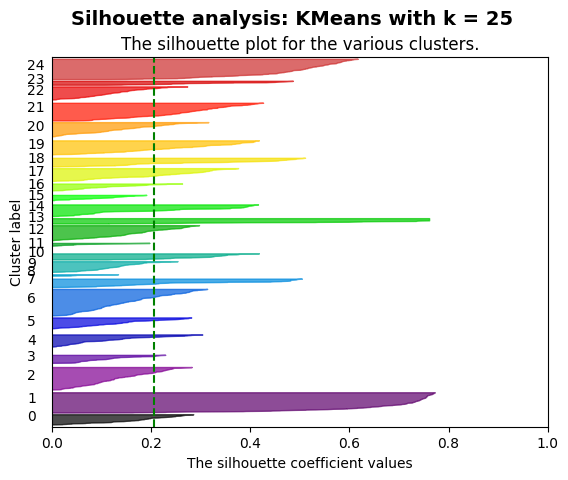

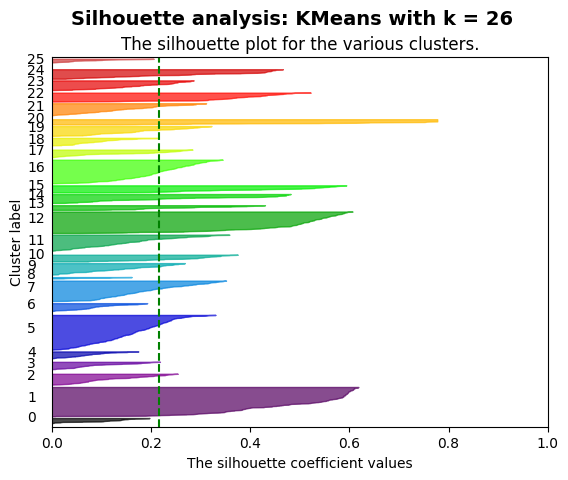

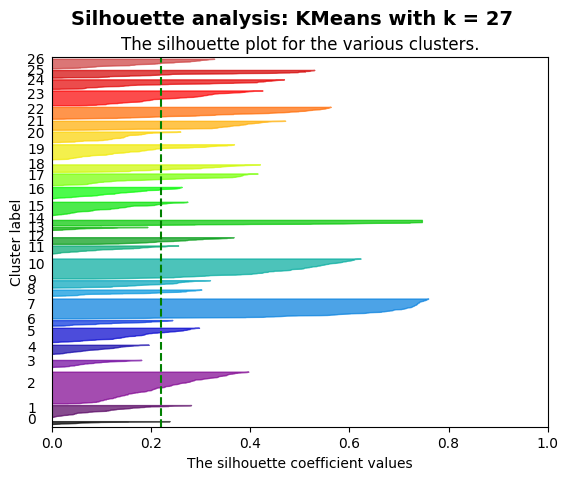

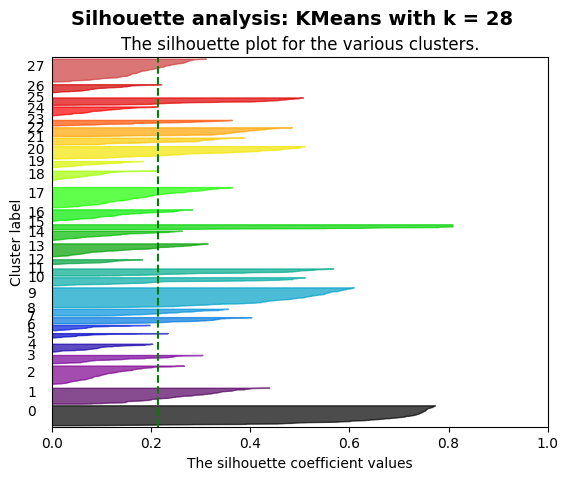

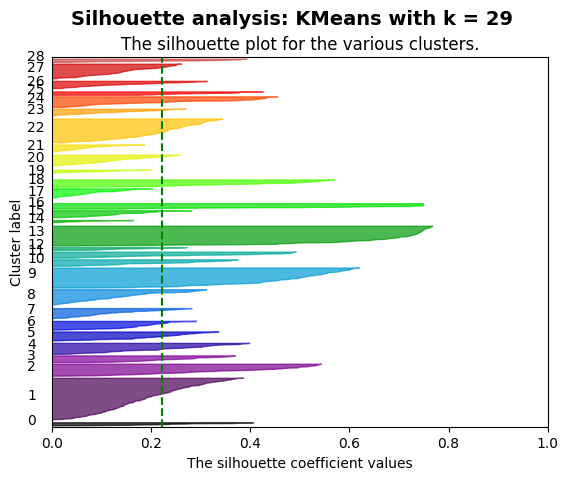

In [78]:
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, silhouette_samples, v_measure_score

range_n_clusters = np.arange(10, 30, 1)

silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []

for n_clusters in range_n_clusters:

    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_PCA) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed)
    cluster_labels = clusterer.fit_predict(features_PCA)

    silhouette_avg = silhouette_score(features_PCA, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_PCA)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_PCA, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label", labelpad=20)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

    fig.suptitle(
        "Silhouette analysis: KMeans with k = %d"
        % n_clusters,
        fontsize=14,fontweight="bold")
    
    save_name = 'output/step3/s3_pca_kmeans_silhouette_k=' + str(n_clusters)+'.png'
    plt.savefig(save_name)
    
plt.show()

[10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29]


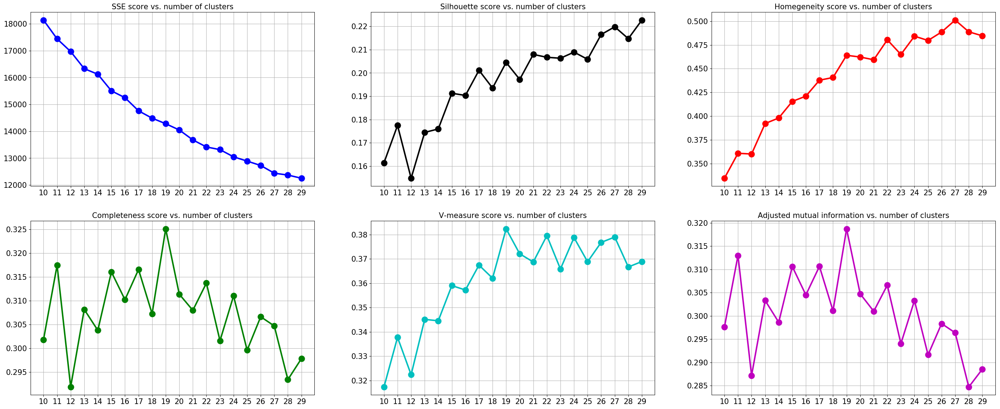

In [80]:

plt.figure(figsize=(35,14))

plot_range = range_n_clusters
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_pca_kmeans_scores_vs_clusters.png')
plt.show()

Inertia:  14049.05021976173
Silhouette score:  0.19723219045941418
Adjusted Mutual Information (AMI) score:  0.30474685865755086


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


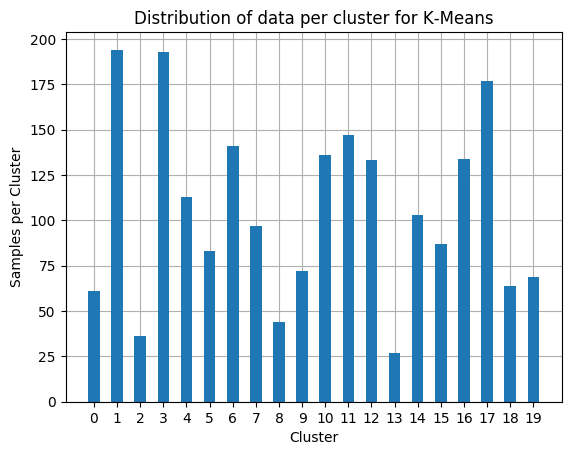

In [82]:
k = 20
k_means_clustering = KMeans(n_clusters=k, random_state=seed)
k_means_clustering.fit(features_PCA)
print('Inertia: ', k_means_clustering.inertia_)
silhouette_score_value = silhouette_score(features_PCA, k_means_clustering.labels_)
print('Silhouette score: ', silhouette_score_value)
adjusted_mutual_info_score_value = adjusted_mutual_info_score(classes, k_means_clustering.labels_)
print('Adjusted Mutual Information (AMI) score: ', adjusted_mutual_info_score_value)

plt.figure()
plt.hist(k_means_clustering.labels_, bins=np.arange(0, k + 1) - 0.5, rwidth=0.5, zorder=2)
plt.xticks(np.arange(0, k))
plt.xlabel('Cluster')
plt.ylabel('Samples per Cluster')
plt.title('Distribution of data per cluster for K-Means')
plt.grid()

plt.savefig('output/step3/s3_pca_kmeans_samples_vs_clusters.png')


## 1.2 PCA & EM

In [83]:
features_PCA = PCA().fit_transform(features)

degree_features = features_PCA.shape[1]

lowest_bic = np.infty
num_components_values = range(1, degree_features + 1)

covariances = ['spherical', 'tied', 'diag', 'full']

bic = np.zeros((len(covariances),len(num_components_values)))

for i, covariance in enumerate(covariances):
    for j, num_components in enumerate(num_components_values):
        gmm = GaussianMixture(n_components=num_components, covariance_type=covariance)
        gmm.fit(features_PCA)
        bic[i][j] = gmm.bic(features_PCA)
        if bic[i][j] < lowest_bic:
            lowest_bic = bic[i][j]
            print("Lowest BIC currently for", covariance, num_components)
            best_gmm = gmm

Lowest BIC currently for spherical 1
Lowest BIC currently for spherical 2
Lowest BIC currently for spherical 3
Lowest BIC currently for spherical 4
Lowest BIC currently for spherical 5
Lowest BIC currently for spherical 6
Lowest BIC currently for spherical 7
Lowest BIC currently for spherical 12
Lowest BIC currently for spherical 15
Lowest BIC currently for spherical 16
Lowest BIC currently for tied 2
Lowest BIC currently for tied 5
Lowest BIC currently for tied 6
Lowest BIC currently for tied 8
Lowest BIC currently for tied 11
Lowest BIC currently for tied 12
Lowest BIC currently for full 2
Lowest BIC currently for full 4
Lowest BIC currently for full 5
Lowest BIC currently for full 6
Lowest BIC currently for full 7
Lowest BIC currently for full 8
Lowest BIC currently for full 9
Lowest BIC currently for full 10
Lowest BIC currently for full 12
Lowest BIC currently for full 13
Lowest BIC currently for full 15


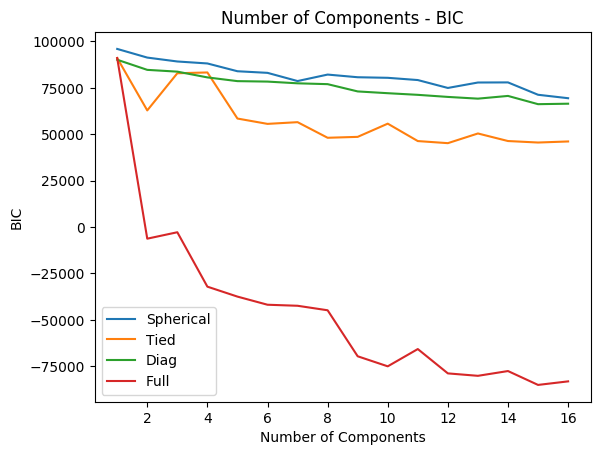

In [85]:
fig, ax1 = plt.subplots()

ax1.plot(num_components_values, bic[0], label = 'Spherical')
ax1.plot(num_components_values, bic[1], label = 'Tied')
ax1.plot(num_components_values, bic[2], label = 'Diag')
ax1.plot(num_components_values, bic[3], label = 'Full')
ax1.legend()
# ax1.xticks(range(1, degree_mkt,1))
ax1.set_title("Number of Components - BIC")
ax1.set_xlabel("Number of Components")
ax1.set_ylabel("BIC")

plt.savefig('output/step3/s3_pca_gm_bic.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


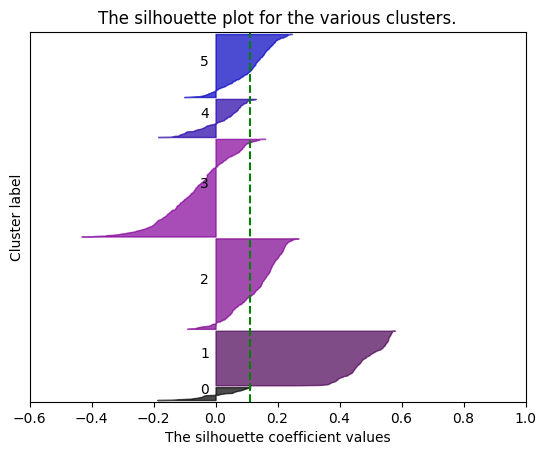

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


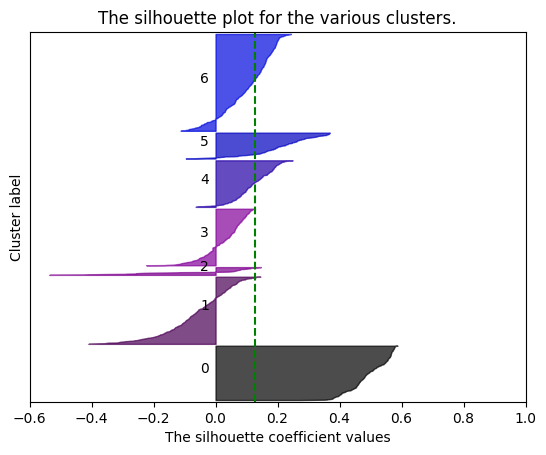

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


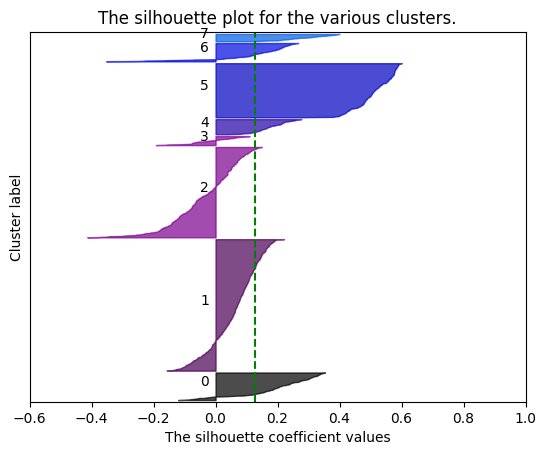

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


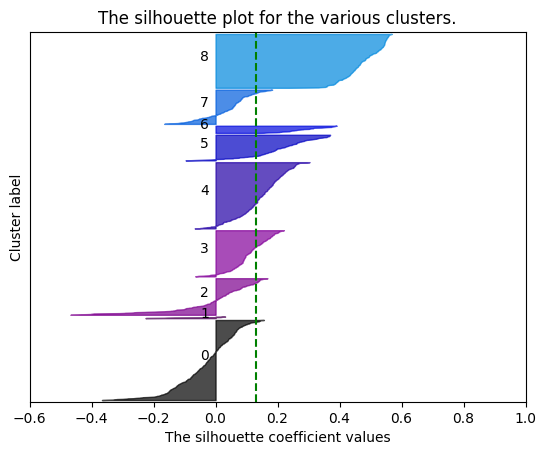

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


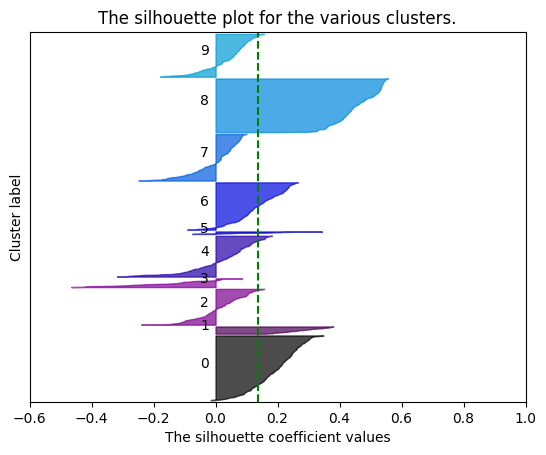

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


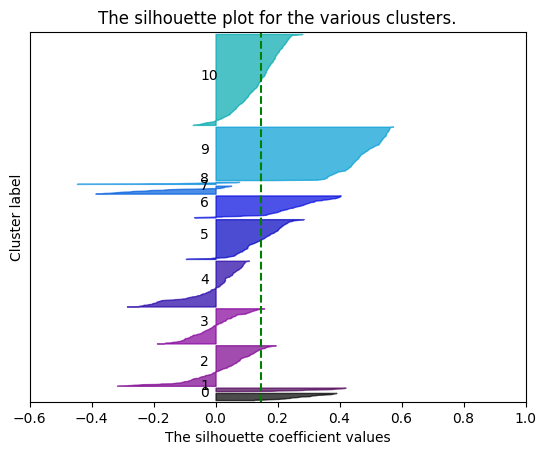

In [86]:
# Code taken from scikit-learn examples (https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
#https://www.geeksforgeeks.org/ml-v-measure-for-evaluating-clustering-performance/

range_n_components = np.arange(6, 12, 1)
silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []


for n_components in range_n_components:
    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_PCA) + (n_components + 1) * 10])

    clusterer = GaussianMixture(n_components=n_components, covariance_type='full')
    cluster_labels = clusterer.fit_predict(features_PCA)

    silhouette_avg = silhouette_score(features_PCA, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_PCA)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_PCA, cluster_labels)

    y_lower = 10
    for i in range(n_components):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.6,-0.4,-0.2,0, 0.2, 0.4, 0.6, 0.8, 1])
    
    save_name = 'output/step3/s3_pca_gm_silhouette_c=' + str(n_components)+'.png'
    plt.savefig(save_name)
    
    plt.show()

[ 6  7  8  9 10 11]


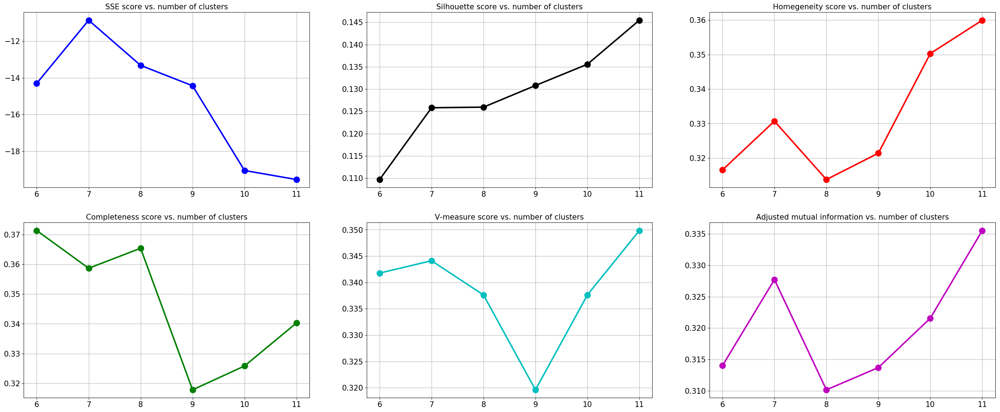

In [87]:

plt.figure(figsize=(35,14))

plot_range = range_n_components
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_pca_gm_scores_vs_clusters.png')
plt.show()

## 2.1 ICA & K-Means

In [89]:
features_ICA = FastICA().fit_transform(features)

range_n_clusters = np.arange(1,50,1)
inertia = []
for n_clusters in range_n_clusters:
    k_means_clustering = KMeans(n_clusters=n_clusters, random_state=seed)
    k_means_clustering.fit(features_ICA)
    
    inertia.append(k_means_clustering.inertia_)
inertia = np.array(inertia)

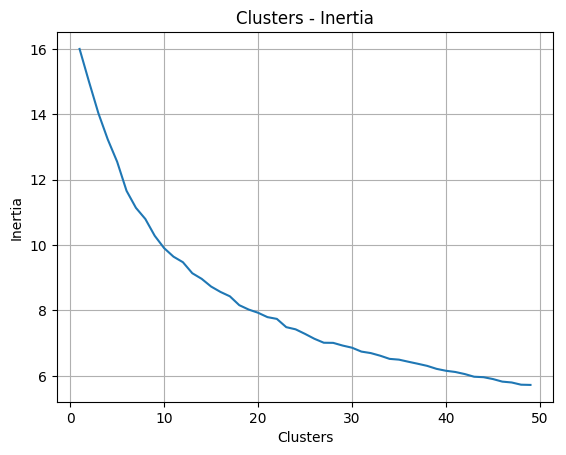

In [92]:
plt.plot(range_n_clusters,inertia)
plt.xlabel('Clusters')
plt.ylabel('Inertia')
plt.title('Clusters - Inertia')
plt.grid()
plt.savefig('output/step3/s3_ica_kmeans_inertia_vs_clusters.png')
plt.show()

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of

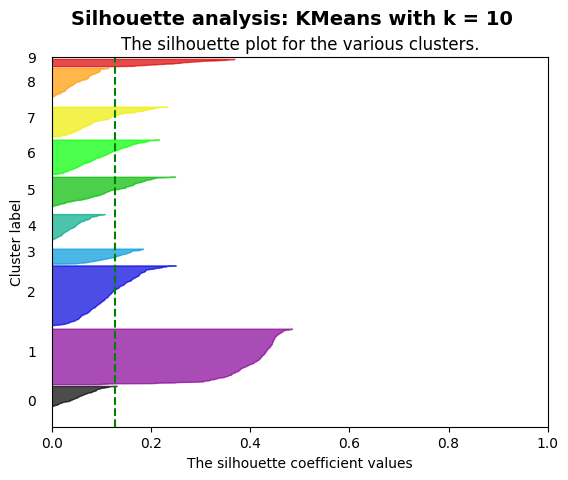

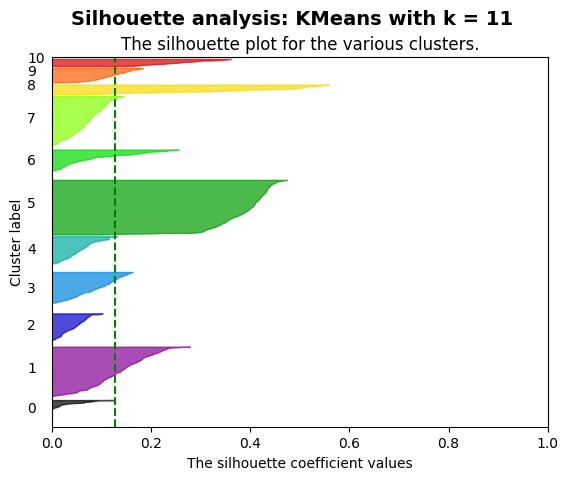

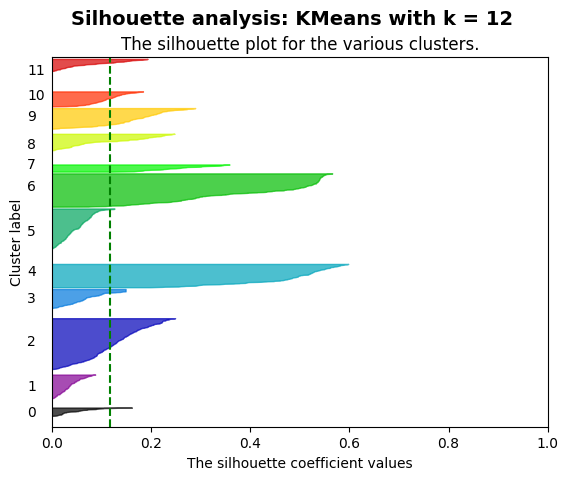

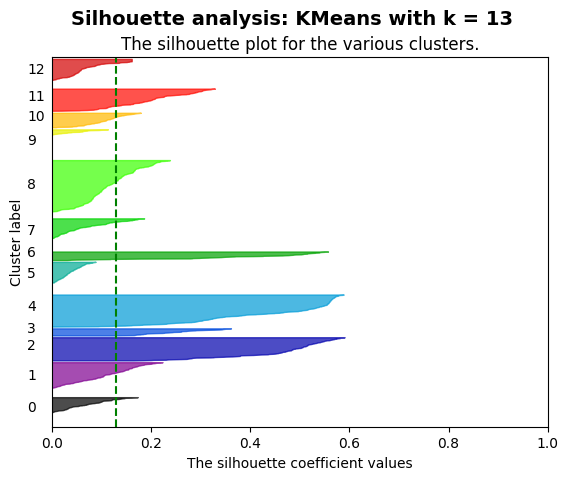

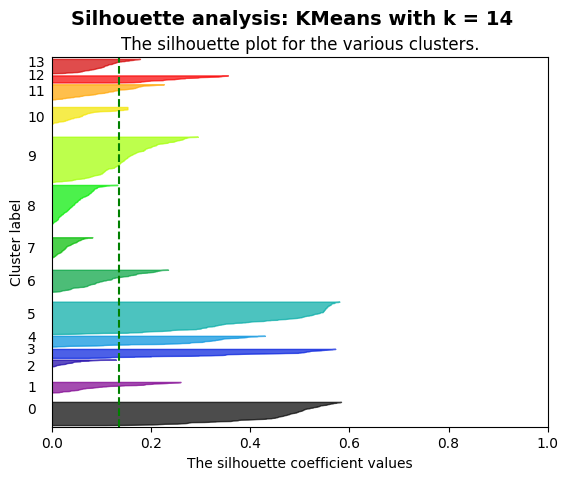

...

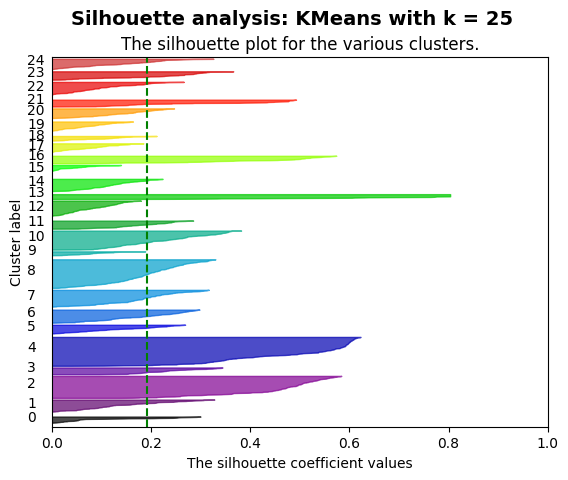

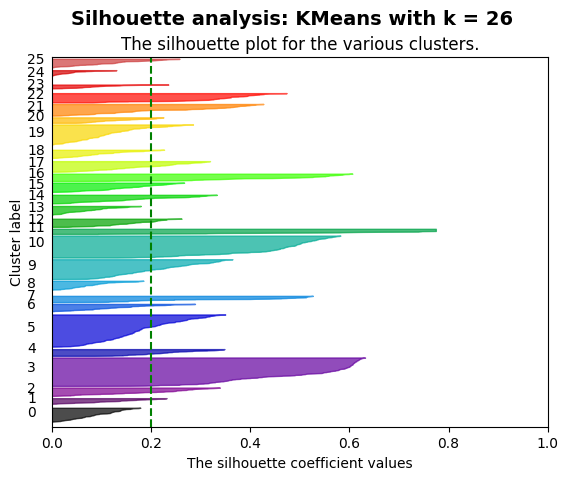

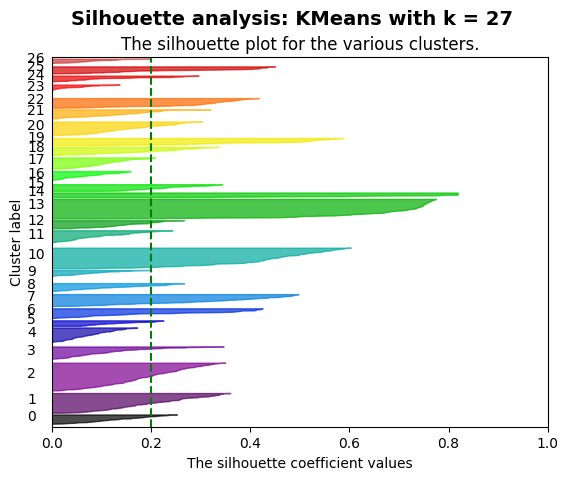

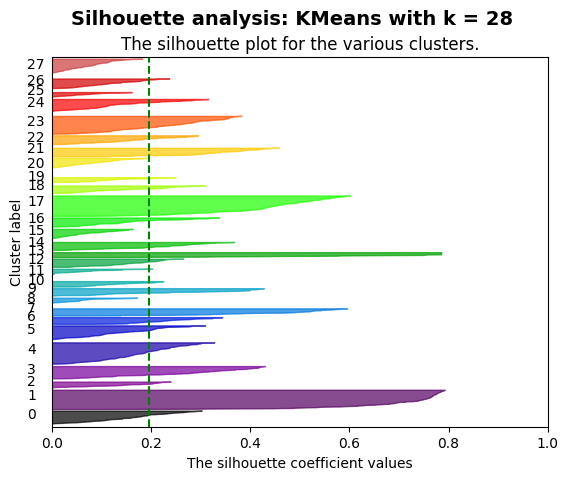

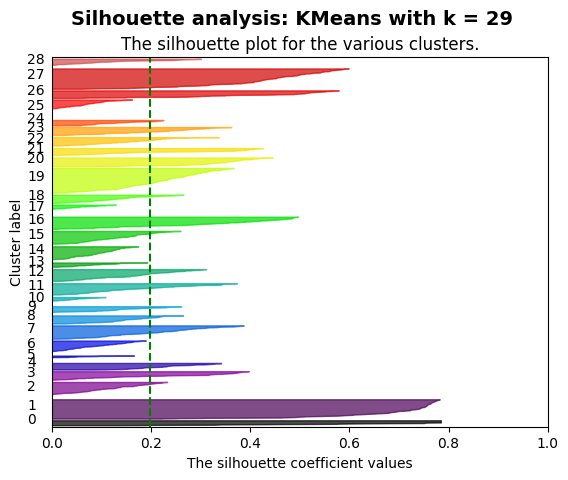

In [94]:
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, silhouette_samples, v_measure_score

range_n_clusters = np.arange(10, 30, 1)

silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []

for n_clusters in range_n_clusters:

    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_ICA) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed)
    cluster_labels = clusterer.fit_predict(features_ICA)

    silhouette_avg = silhouette_score(features_ICA, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_ICA)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_ICA, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label", labelpad=20)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

    fig.suptitle(
        "Silhouette analysis: KMeans with k = %d"
        % n_clusters,
        fontsize=14,fontweight="bold")
    
    save_name = 'output/step3/s3_ica_kmeans_silhouette_k=' + str(n_clusters)+'.png'
    plt.savefig(save_name)
    
plt.show()

[10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29]


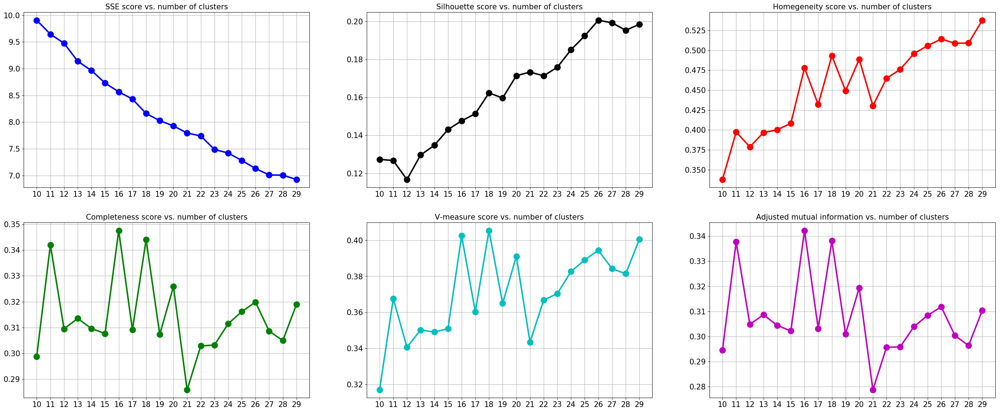

In [95]:

plt.figure(figsize=(35,14))

plot_range = range_n_clusters
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_ica_kmeans_scores_vs_clusters.png')
plt.show()

Inertia:  7.929001518861785
Silhouette score:  0.17137574164260258
Adjusted Mutual Information (AMI) score:  0.31940451963862593


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


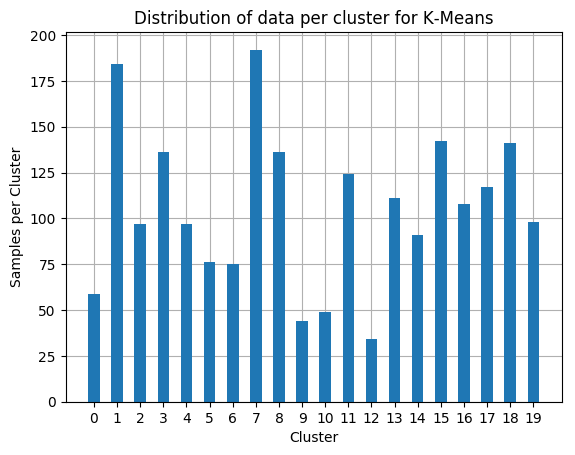

In [96]:
k = 20
k_means_clustering = KMeans(n_clusters=k, random_state=seed)
k_means_clustering.fit(features_ICA)
print('Inertia: ', k_means_clustering.inertia_)
silhouette_score_value = silhouette_score(features_ICA, k_means_clustering.labels_)
print('Silhouette score: ', silhouette_score_value)
adjusted_mutual_info_score_value = adjusted_mutual_info_score(classes, k_means_clustering.labels_)
print('Adjusted Mutual Information (AMI) score: ', adjusted_mutual_info_score_value)

plt.figure()
plt.hist(k_means_clustering.labels_, bins=np.arange(0, k + 1) - 0.5, rwidth=0.5, zorder=2)
plt.xticks(np.arange(0, k))
plt.xlabel('Cluster')
plt.ylabel('Samples per Cluster')
plt.title('Distribution of data per cluster for K-Means')
plt.grid()

plt.savefig('output/step3/s3_ica_kmeans_samples_vs_clusters.png')


## 2.2 ICA & EM

In [97]:
features_ICA = FastICA().fit_transform(features)

degree_features = features_ICA.shape[1]

lowest_bic = np.infty
num_components_values = range(1, degree_features + 1)

covariances = ['spherical', 'tied', 'diag', 'full']

bic = np.zeros((len(covariances),len(num_components_values)))

for i, covariance in enumerate(covariances):
    for j, num_components in enumerate(num_components_values):
        gmm = GaussianMixture(n_components=num_components, covariance_type=covariance)
        gmm.fit(features_ICA)
        bic[i][j] = gmm.bic(features_ICA)
        if bic[i][j] < lowest_bic:
            lowest_bic = bic[i][j]
            print("Lowest BIC currently for", covariance, num_components)
            best_gmm = gmm

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/decomposition/fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


Lowest BIC currently for spherical 1
Lowest BIC currently for spherical 2
Lowest BIC currently for spherical 3
Lowest BIC currently for spherical 4
Lowest BIC currently for spherical 5
Lowest BIC currently for spherical 6
Lowest BIC currently for spherical 10
Lowest BIC currently for spherical 12
Lowest BIC currently for spherical 13
Lowest BIC currently for spherical 14
Lowest BIC currently for spherical 15
Lowest BIC currently for spherical 16
Lowest BIC currently for tied 5
Lowest BIC currently for tied 9
Lowest BIC currently for tied 10
Lowest BIC currently for tied 13
Lowest BIC currently for diag 4
Lowest BIC currently for diag 6
Lowest BIC currently for diag 7
Lowest BIC currently for diag 8
Lowest BIC currently for diag 10
Lowest BIC currently for diag 11
Lowest BIC currently for diag 12
Lowest BIC currently for diag 14
Lowest BIC currently for diag 15
Lowest BIC currently for diag 16
Lowest BIC currently for full 6
Lowest BIC currently for full 8
Lowest BIC currently for full 

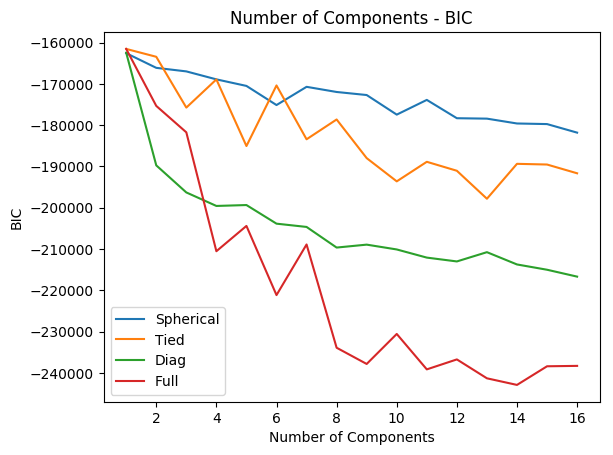

In [98]:
fig, ax1 = plt.subplots()

ax1.plot(num_components_values, bic[0], label = 'Spherical')
ax1.plot(num_components_values, bic[1], label = 'Tied')
ax1.plot(num_components_values, bic[2], label = 'Diag')
ax1.plot(num_components_values, bic[3], label = 'Full')
ax1.legend()
# ax1.xticks(range(1, degree_mkt,1))
ax1.set_title("Number of Components - BIC")
ax1.set_xlabel("Number of Components")
ax1.set_ylabel("BIC")

plt.savefig('output/step3/s3_ica_gm_bic.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


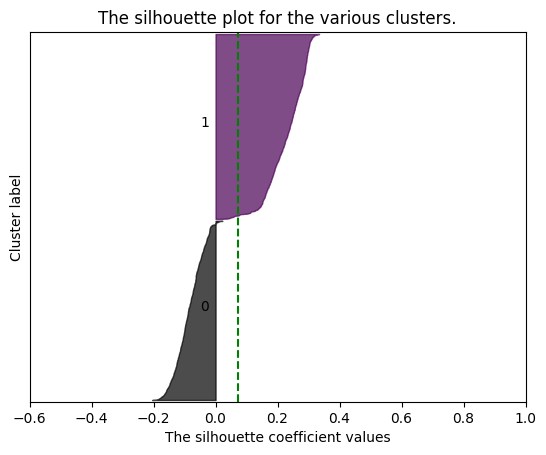

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


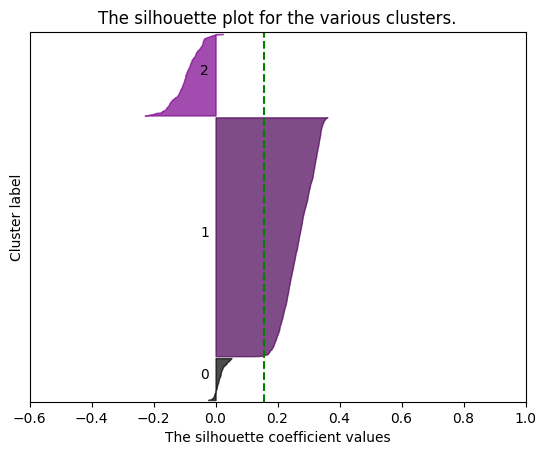

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


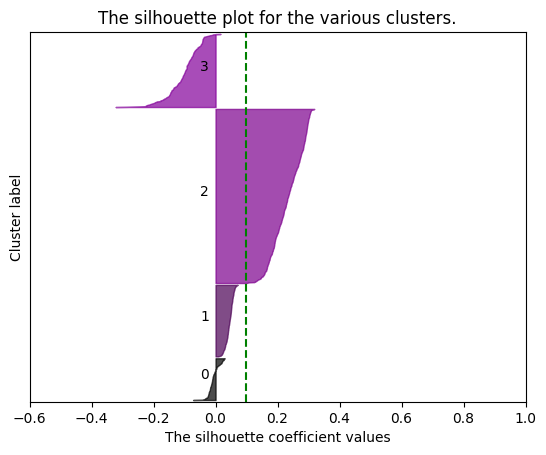

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


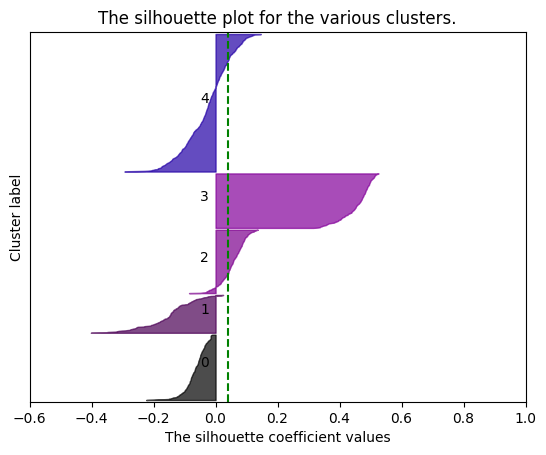

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


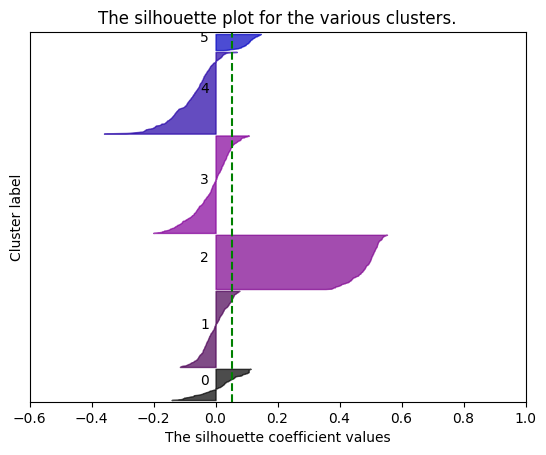

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


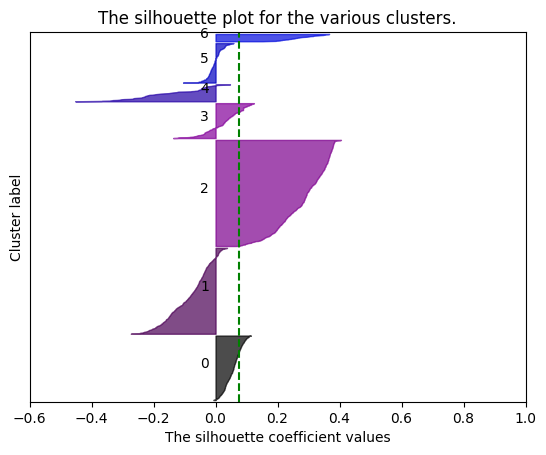

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


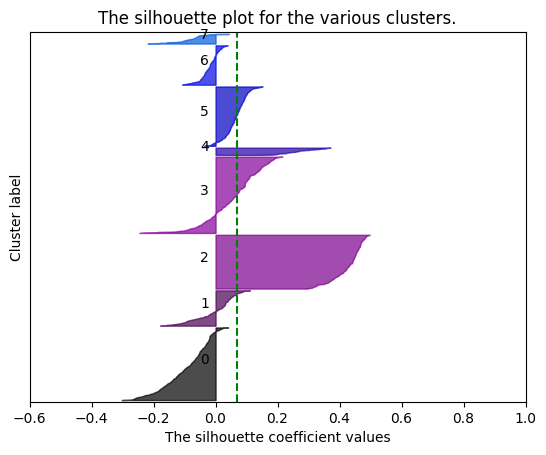

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


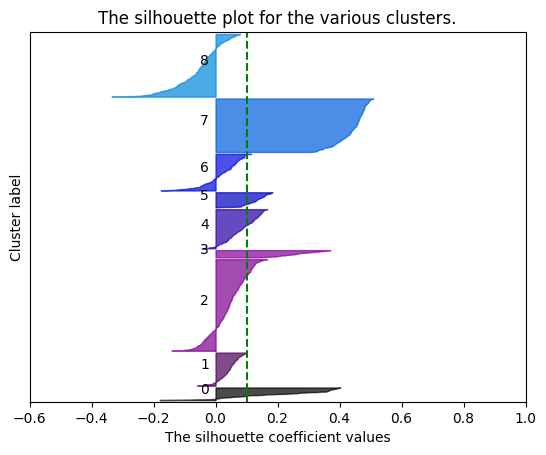

In [99]:
# Code taken from scikit-learn examples (https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
#https://www.geeksforgeeks.org/ml-v-measure-for-evaluating-clustering-performance/

range_n_components = np.arange(2, 10, 1)
silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []


for n_components in range_n_components:
    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_ICA) + (n_components + 1) * 10])

    clusterer = GaussianMixture(n_components=n_components, covariance_type='full')
    cluster_labels = clusterer.fit_predict(features_ICA)

    silhouette_avg = silhouette_score(features_ICA, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_ICA)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_ICA, cluster_labels)

    y_lower = 10
    for i in range(n_components):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.6,-0.4,-0.2,0, 0.2, 0.4, 0.6, 0.8, 1])
    
    save_name = 'output/step3/s3_ica_gm_silhouette_c=' + str(n_components)+'.png'
    plt.savefig(save_name)

    plt.show()
    

[2 3 4 5 6 7 8 9]


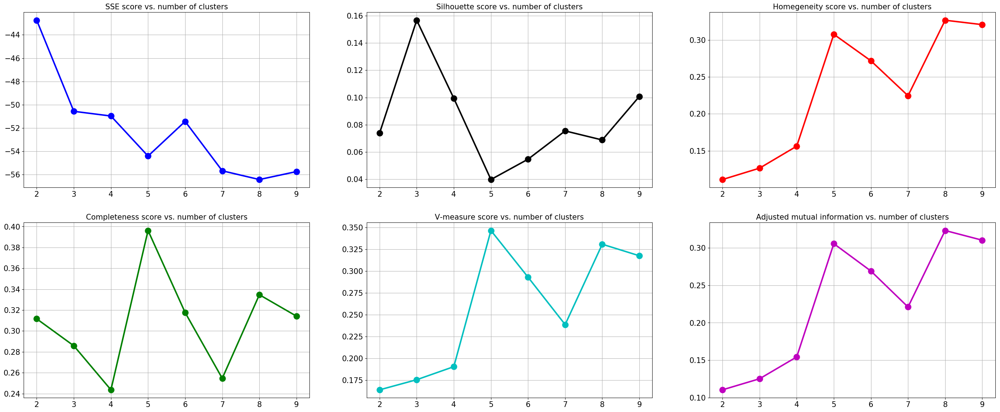

In [101]:

plt.figure(figsize=(35,14))

plot_range = range_n_components
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_ica_gm_scores_vs_clusters.png')
plt.show()

## 3.1 RP & K-Means

In [105]:
features_RP = GaussianRandomProjection(n_components=10).fit_transform(features)

range_n_clusters = np.arange(1,50,1)
inertia = []
for n_clusters in range_n_clusters:
    k_means_clustering = KMeans(n_clusters=n_clusters, random_state=seed)
    k_means_clustering.fit(features_RP)
    
    inertia.append(k_means_clustering.inertia_)
inertia = np.array(inertia)

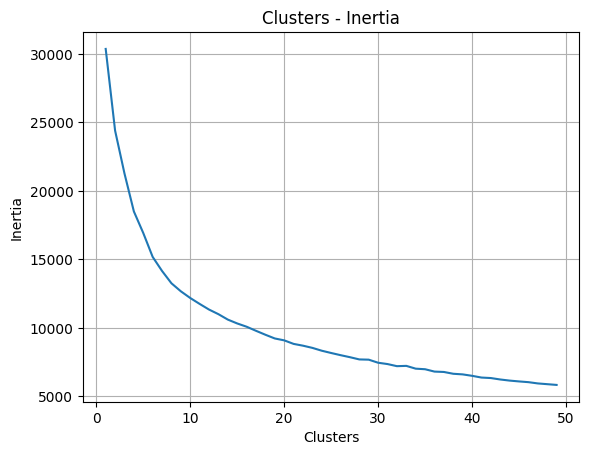

In [106]:
plt.plot(range_n_clusters,inertia)
plt.xlabel('Clusters')
plt.ylabel('Inertia')
plt.title('Clusters - Inertia')
plt.grid()

plt.savefig('output/step3/s3_rp_kmeans_inertia_vs_clusters.png')
plt.show()

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of

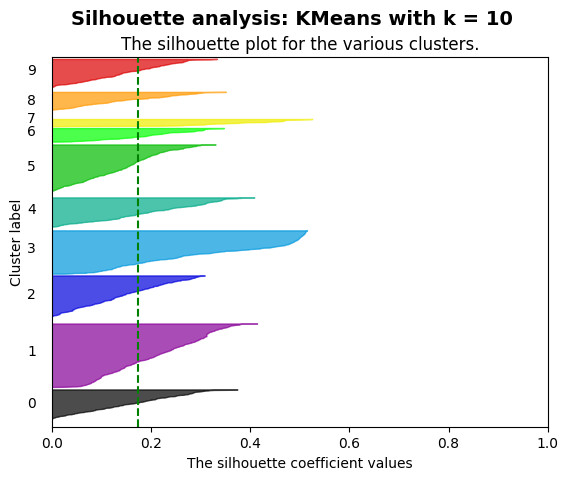

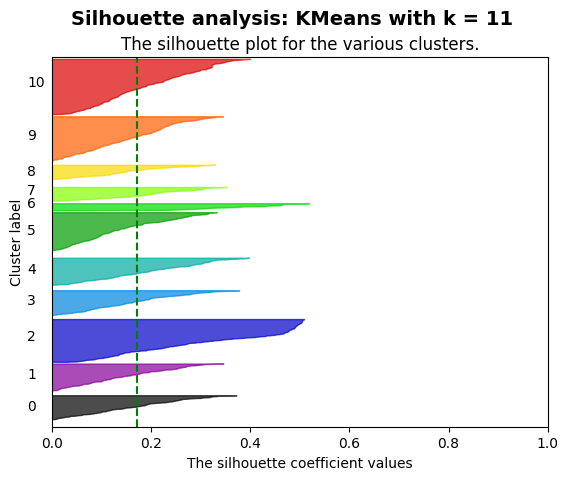

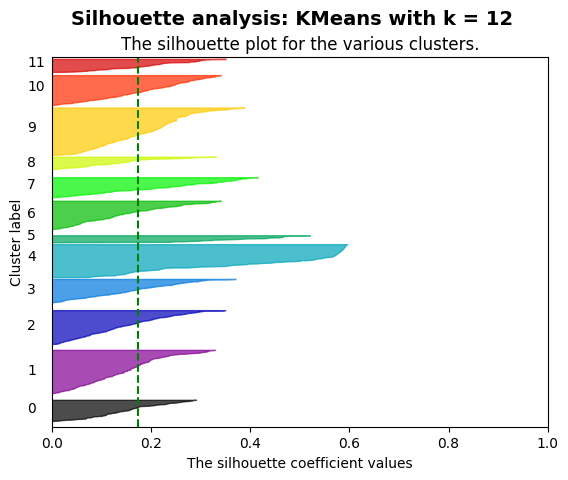

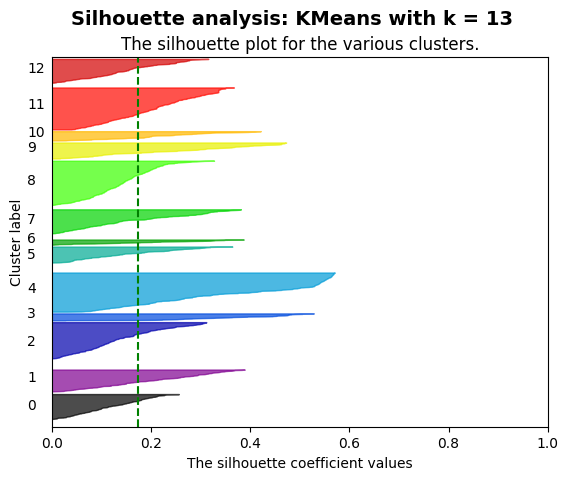

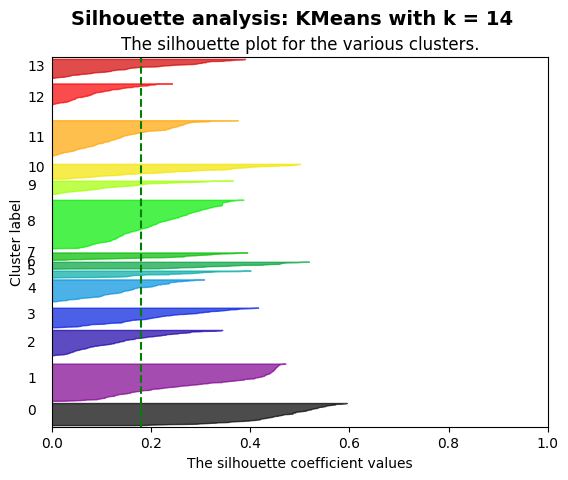

...

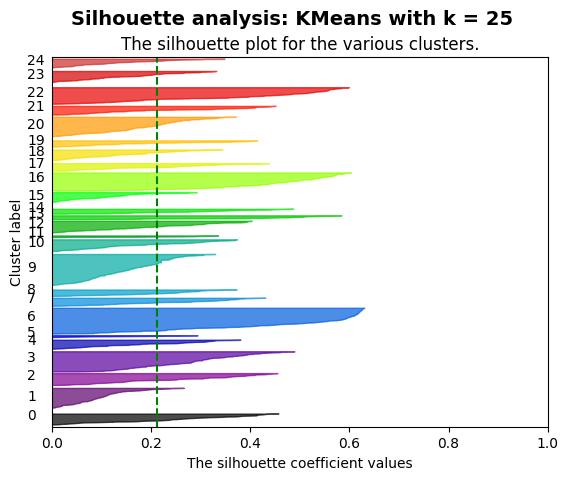

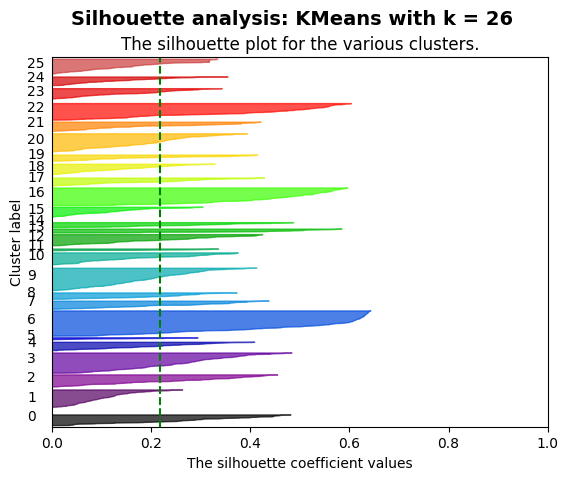

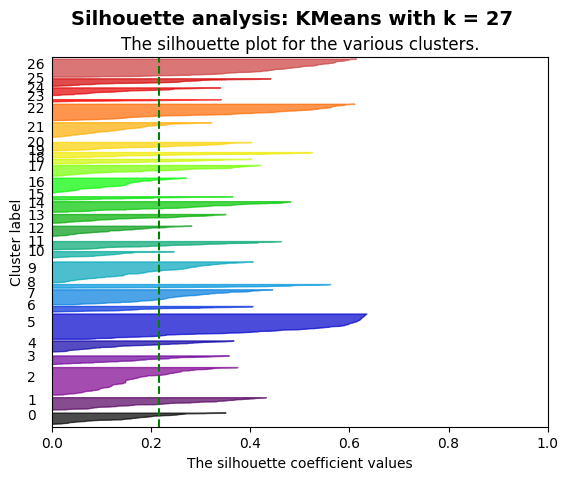

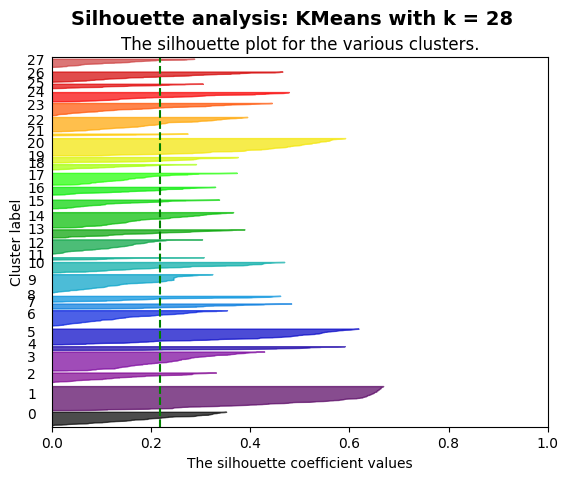

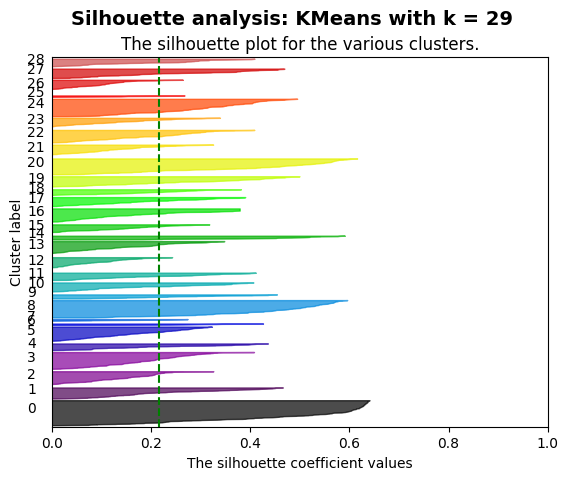

In [107]:
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, silhouette_samples, v_measure_score

range_n_clusters = np.arange(10, 30, 1)

silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []

for n_clusters in range_n_clusters:

    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_RP) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed)
    cluster_labels = clusterer.fit_predict(features_RP)

    silhouette_avg = silhouette_score(features_RP, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_RP)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_RP, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label", labelpad=20)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

    fig.suptitle(
        "Silhouette analysis: KMeans with k = %d"
        % n_clusters,
        fontsize=14,fontweight="bold")
    
    save_name = 'output/step3/s3_rp_kmeans_silhouette_k=' + str(n_clusters)+'.png'
    plt.savefig(save_name)

plt.show()

[10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29]


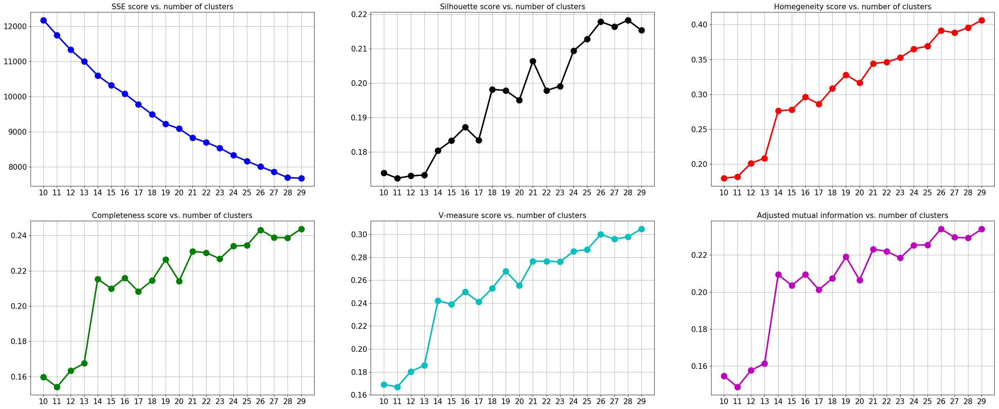

In [108]:

plt.figure(figsize=(35,14))

plot_range = range_n_clusters
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_rp_kmeans_scores_vs_clusters.png')
plt.show()

Inertia:  9082.903705801482
Silhouette score:  0.19506469543996435
Adjusted Mutual Information (AMI) score:  0.2064416888985706


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


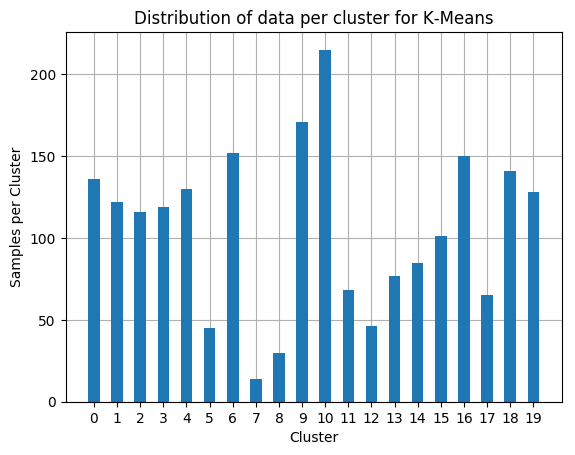

In [109]:
k = 20
k_means_clustering = KMeans(n_clusters=k, random_state=seed)
k_means_clustering.fit(features_RP)
print('Inertia: ', k_means_clustering.inertia_)
silhouette_score_value = silhouette_score(features_RP, k_means_clustering.labels_)
print('Silhouette score: ', silhouette_score_value)
adjusted_mutual_info_score_value = adjusted_mutual_info_score(classes, k_means_clustering.labels_)
print('Adjusted Mutual Information (AMI) score: ', adjusted_mutual_info_score_value)

plt.figure()
plt.hist(k_means_clustering.labels_, bins=np.arange(0, k + 1) - 0.5, rwidth=0.5, zorder=2)
plt.xticks(np.arange(0, k))
plt.xlabel('Cluster')
plt.ylabel('Samples per Cluster')
plt.title('Distribution of data per cluster for K-Means')
plt.grid()
plt.savefig('output/step3/s3_rp_kmeans_samples_vs_clusters.png')


## 3.2 RP & EM

In [110]:
features_RP = GaussianRandomProjection(n_components=16).fit_transform(features)

degree_features = features_RP.shape[1]

lowest_bic = np.infty
num_components_values = range(1, degree_features + 1)

covariances = ['spherical', 'tied', 'diag', 'full']

bic = np.zeros((len(covariances),len(num_components_values)))

for i, covariance in enumerate(covariances):
    for j, num_components in enumerate(num_components_values):
        gmm = GaussianMixture(n_components=num_components, covariance_type=covariance)
        gmm.fit(features_RP)
        bic[i][j] = gmm.bic(features_RP)
        if bic[i][j] < lowest_bic:
            lowest_bic = bic[i][j]
            print("Lowest BIC currently for", covariance, num_components)
            best_gmm = gmm

Lowest BIC currently for spherical 1
Lowest BIC currently for spherical 2
Lowest BIC currently for spherical 3
Lowest BIC currently for spherical 4
Lowest BIC currently for spherical 5
Lowest BIC currently for spherical 6
Lowest BIC currently for spherical 7
Lowest BIC currently for spherical 8
Lowest BIC currently for spherical 10
Lowest BIC currently for spherical 11
Lowest BIC currently for spherical 12
Lowest BIC currently for spherical 14
Lowest BIC currently for spherical 15
Lowest BIC currently for spherical 16
Lowest BIC currently for tied 1
Lowest BIC currently for tied 2
Lowest BIC currently for tied 3
Lowest BIC currently for tied 4
Lowest BIC currently for tied 6
Lowest BIC currently for tied 7
Lowest BIC currently for tied 11
Lowest BIC currently for tied 14
Lowest BIC currently for full 2
Lowest BIC currently for full 3
Lowest BIC currently for full 4
Lowest BIC currently for full 6
Lowest BIC currently for full 8
Lowest BIC currently for full 9
Lowest BIC currently for f

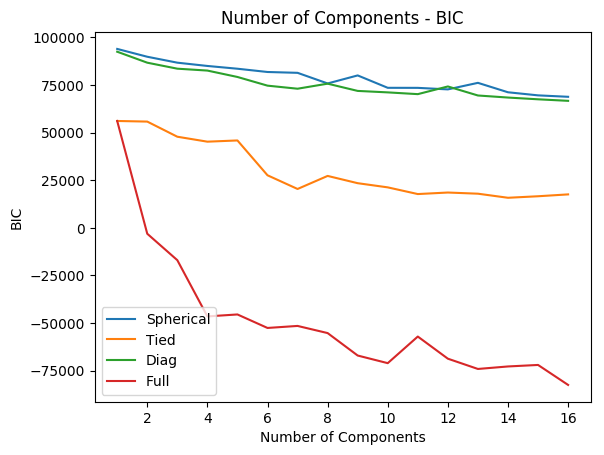

In [111]:
fig, ax1 = plt.subplots()

ax1.plot(num_components_values, bic[0], label = 'Spherical')
ax1.plot(num_components_values, bic[1], label = 'Tied')
ax1.plot(num_components_values, bic[2], label = 'Diag')
ax1.plot(num_components_values, bic[3], label = 'Full')
ax1.legend()
# ax1.xticks(range(1, degree_mkt,1))
ax1.set_title("Number of Components - BIC")
ax1.set_xlabel("Number of Components")
ax1.set_ylabel("BIC")
plt.savefig('output/step3/s3_rp_gm_bic.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


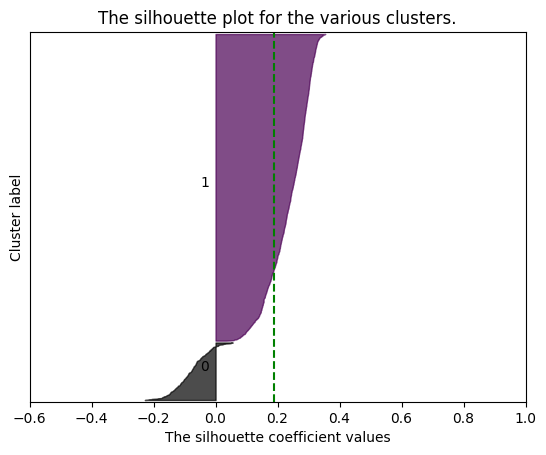

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


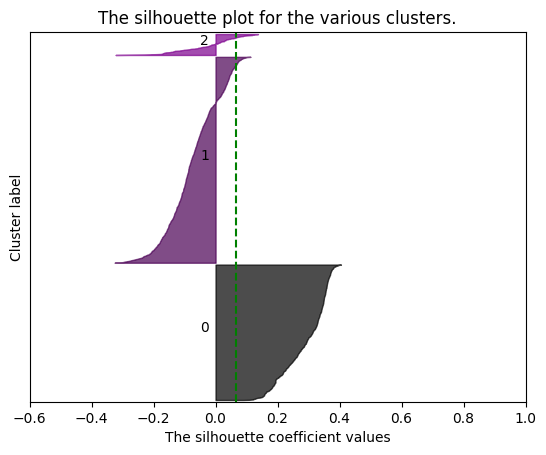

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


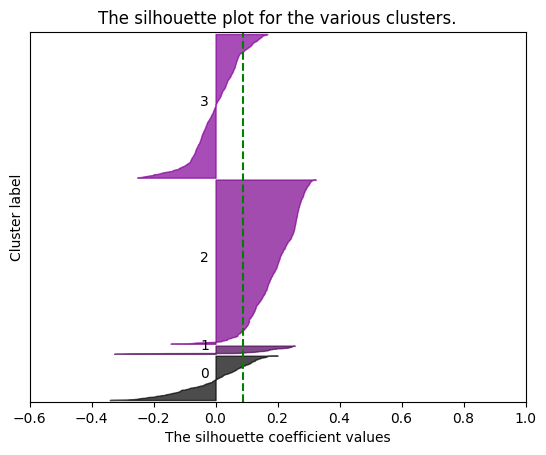

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


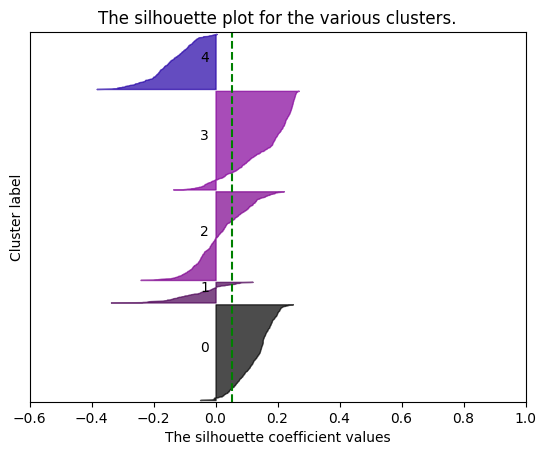

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


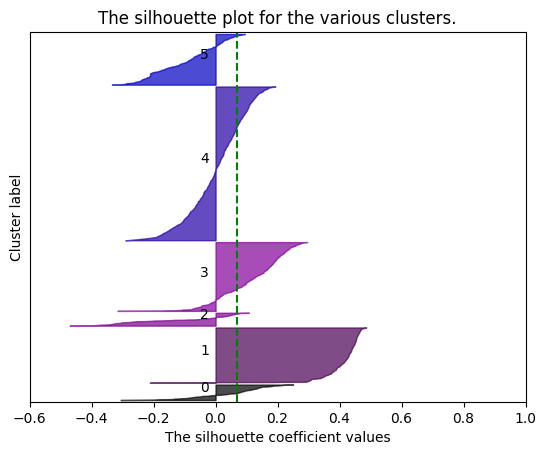

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


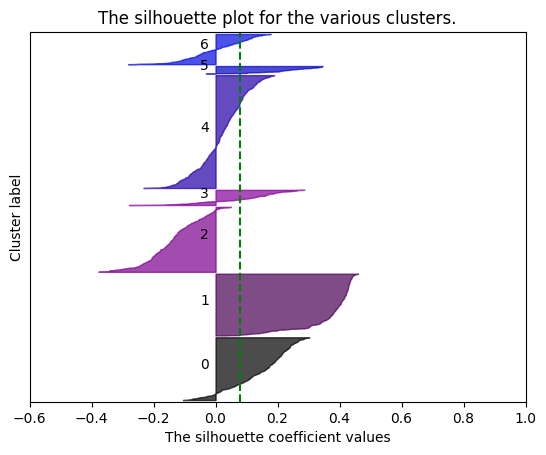

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


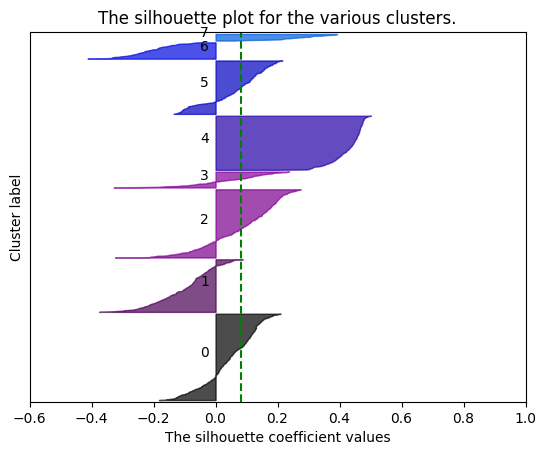

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


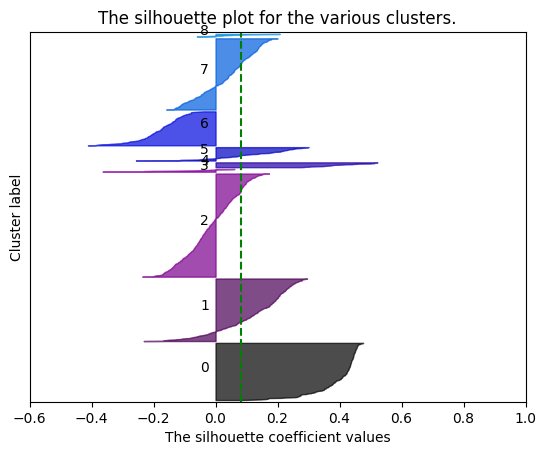

In [112]:
# Code taken from scikit-learn examples (https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
#https://www.geeksforgeeks.org/ml-v-measure-for-evaluating-clustering-performance/

range_n_components = np.arange(2, 10, 1)
silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []


for n_components in range_n_components:
    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_RP) + (n_components + 1) * 10])

    clusterer = GaussianMixture(n_components=n_components, covariance_type='full')
    cluster_labels = clusterer.fit_predict(features_RP)

    silhouette_avg = silhouette_score(features_RP, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_RP)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_RP, cluster_labels)

    y_lower = 10
    for i in range(n_components):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.6,-0.4,-0.2,0, 0.2, 0.4, 0.6, 0.8, 1])
    save_name = 'output/step3/s3_rp_gm_silhouette_c=' + str(n_components)+'.png'
    plt.savefig(save_name)
    plt.show()

[2 3 4 5 6 7 8 9]


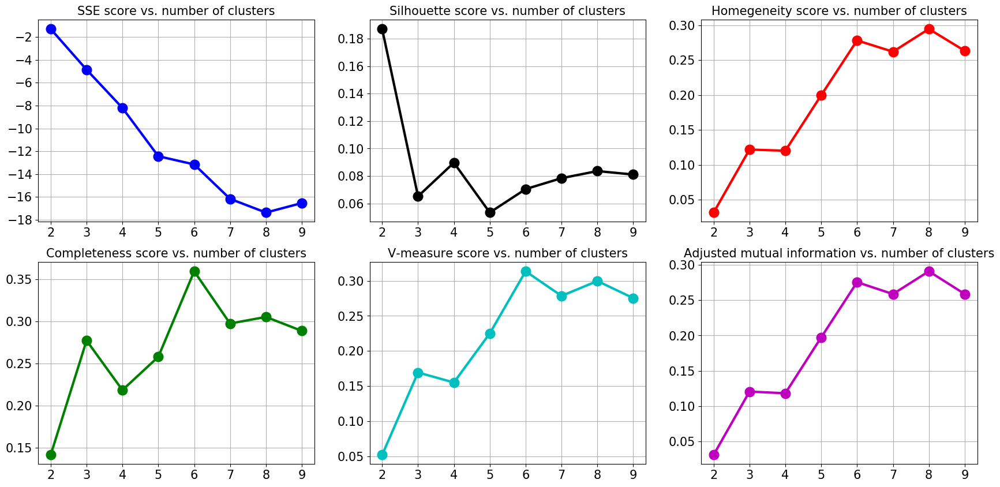

In [113]:

plt.figure(figsize=(21,10))

plot_range = range_n_components
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('output/step3/s3_rp_gm_scores_vs_clusters.png')

plt.show()

## 4.1 t-SNE & K-Means

In [26]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state=seed, n_components=2)
features_tSNE = tsne.fit_transform(features)

range_n_clusters = np.arange(1,50,1)
inertia = []
for n_clusters in range_n_clusters:
    k_means_clustering = KMeans(n_clusters=n_clusters, random_state=seed)
    k_means_clustering.fit(features_tSNE)
    
    inertia.append(k_means_clustering.inertia_)
inertia = np.array(inertia)

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:625: RuntimeWarning: invalid value encountered in multiply
  inertia = (mindist * sample_weight).sum()
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:625: RuntimeWarning: invalid value encountered in multiply
  inertia = (mindist * sample_weight).sum()
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/cluster/k_means_.p

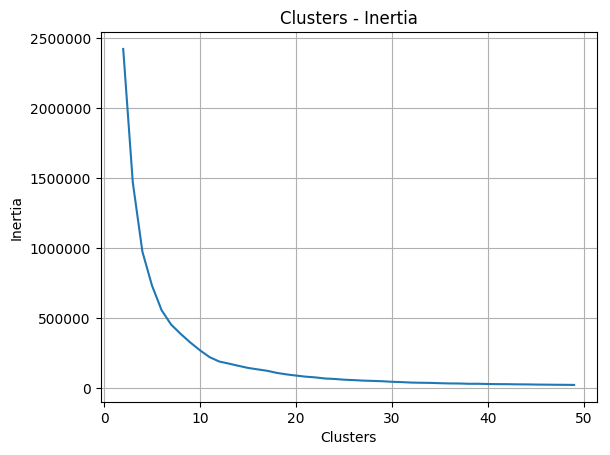

In [27]:
plt.plot(range_n_clusters,inertia)
plt.xlabel('Clusters')
plt.ylabel('Inertia')
plt.title('Clusters - Inertia')
plt.grid()
plt.savefig('rice_inertia_pca.png')
plt.savefig('output/step3/s3_tsne_kmeans_inertia_vs_clusters.png')
plt.show()

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:283: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure

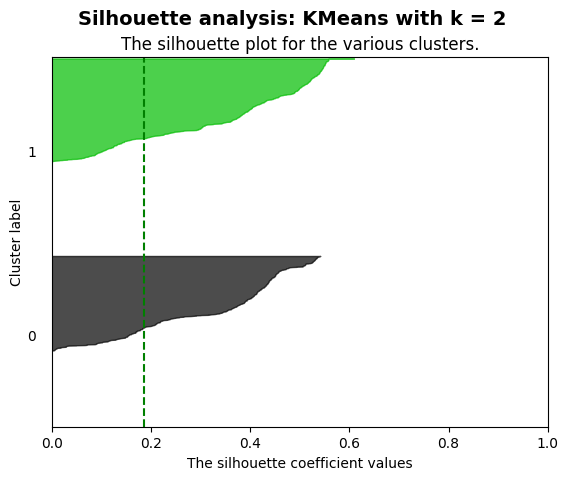

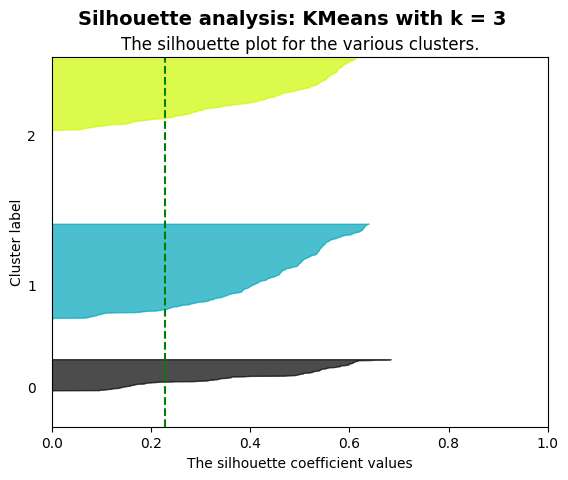

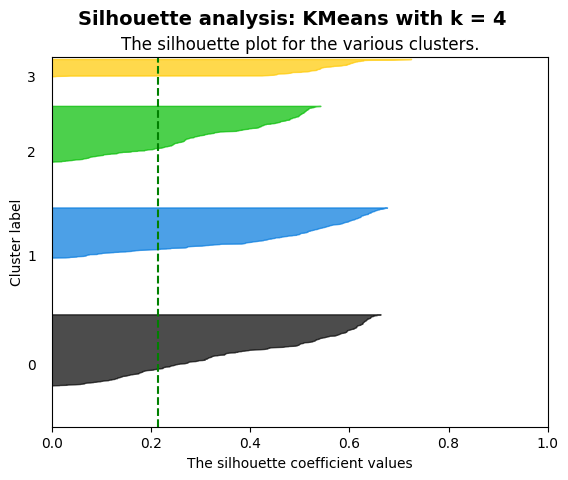

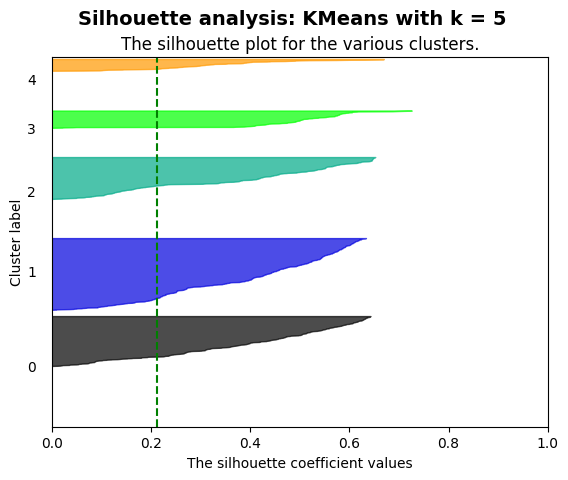

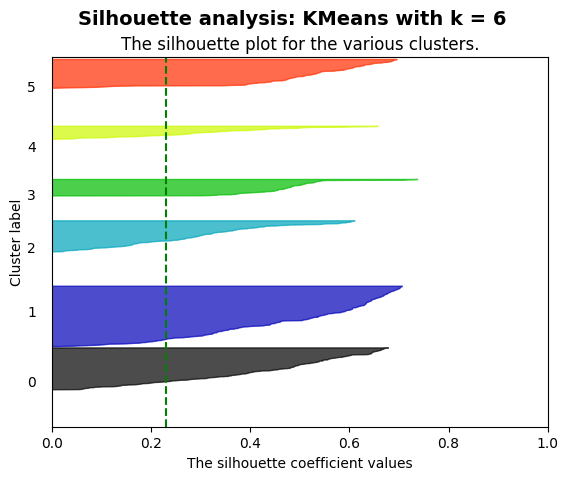

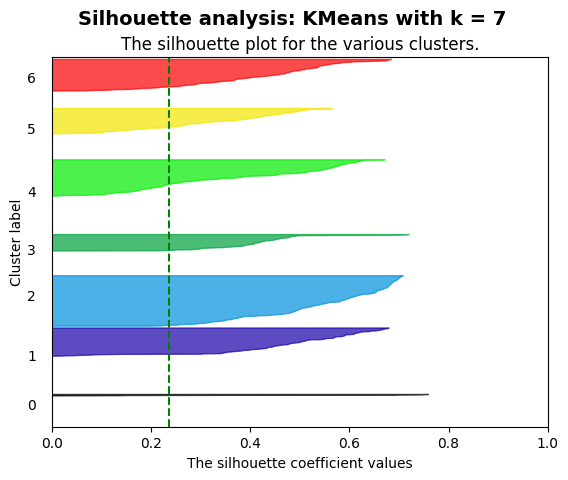

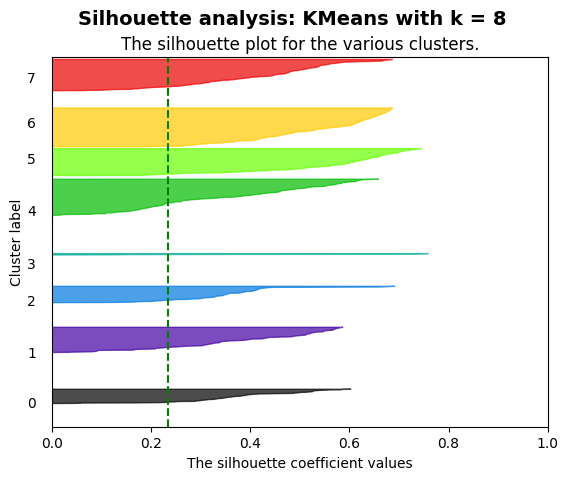

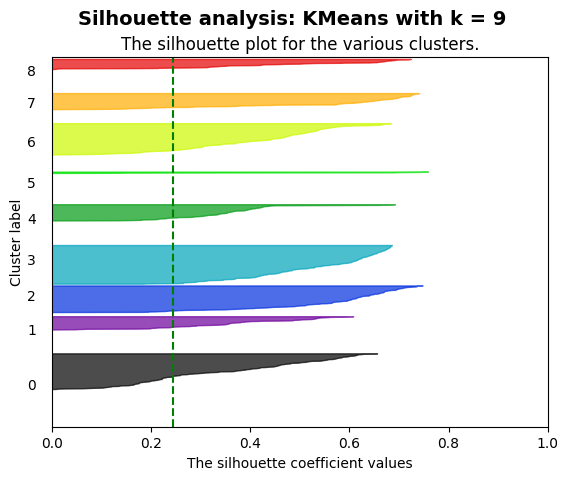

In [28]:
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, silhouette_samples, v_measure_score

range_n_clusters = np.arange(2, 10, 1)

silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []

for n_clusters in range_n_clusters:

    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_tSNE) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed)
    cluster_labels = clusterer.fit_predict(features_tSNE)

    silhouette_avg = silhouette_score(features_tSNE, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_tSNE)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_tSNE, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label", labelpad=20)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

    fig.suptitle(
        "Silhouette analysis: KMeans with k = %d"
        % n_clusters,
        fontsize=14,fontweight="bold")
    
    save_name = 'output/step3/s3_tsne_kmeans_silhouette_k=' + str(n_clusters)+'.png'
    plt.savefig(save_name)
plt.show()

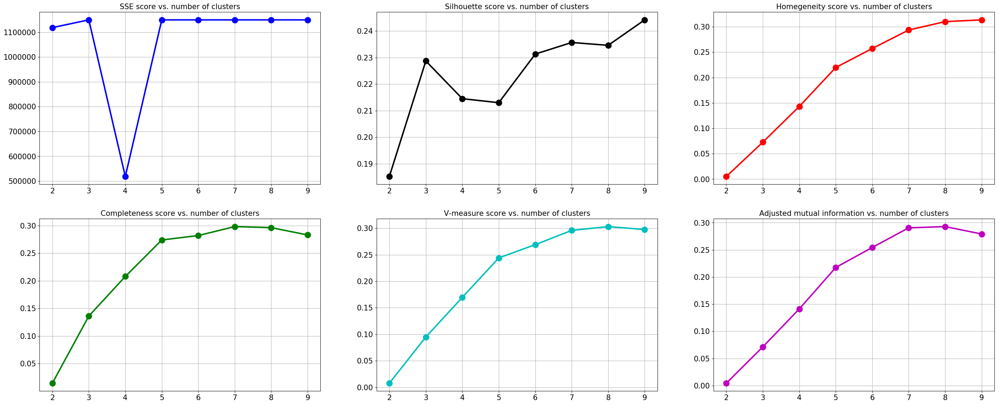

In [32]:

plt.figure(figsize=(35,14))

plot_range = range_n_clusters

sse_list[1] = 1150000
sse_list[3] = 1150000
sse_list[4] = 1150000
sse_list[5] = 1150000
sse_list[6] = 1150000
sse_list[7] = 1150000


#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_tsne_kmeans_scores_vs_clusters.png')
plt.show()

Inertia:  975582.7089885457
Silhouette score:  0.21528092
Adjusted Mutual Information (AMI) score:  0.1412232722758168


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


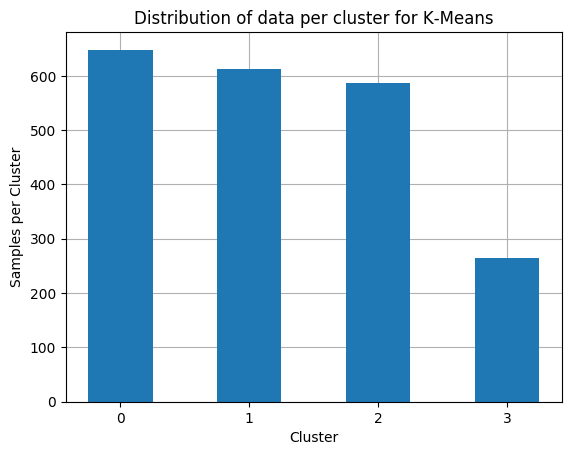

In [37]:
k = 4
k_means_clustering = KMeans(n_clusters=k, random_state=seed)
k_means_clustering.fit(features_tSNE)
print('Inertia: ', k_means_clustering.inertia_)
silhouette_score_value = silhouette_score(features_tSNE, k_means_clustering.labels_)
print('Silhouette score: ', silhouette_score_value)
adjusted_mutual_info_score_value = adjusted_mutual_info_score(classes, k_means_clustering.labels_)
print('Adjusted Mutual Information (AMI) score: ', adjusted_mutual_info_score_value)

plt.figure()
plt.hist(k_means_clustering.labels_, bins=np.arange(0, k + 1) - 0.5, rwidth=0.5, zorder=2)
plt.xticks(np.arange(0, k))
plt.xlabel('Cluster')
plt.ylabel('Samples per Cluster')
plt.title('Distribution of data per cluster for K-Means')
plt.grid()

plt.savefig('output/step3/s3_tsne_kmeans_samples_vs_clusters.png')


## 4.2 LDA & EM

In [40]:
tsne = TSNE(random_state=seed, n_components=2)
features_tSNE = tsne.fit_transform(features)

degree_features = features_tSNE.shape[1]

lowest_bic = np.infty
num_components_values = range(1, degree_features + 1)

covariances = ['spherical', 'tied', 'diag', 'full']

bic = np.zeros((len(covariances),len(num_components_values)))

for i, covariance in enumerate(covariances):
    for j, num_components in enumerate(num_components_values):
        gmm = GaussianMixture(n_components=num_components, covariance_type=covariance)
        gmm.fit(features_tSNE)
        bic[i][j] = gmm.bic(features_tSNE)
        if bic[i][j] < lowest_bic:
            lowest_bic = bic[i][j]
            print("Lowest BIC currently for", covariance, num_components)
            best_gmm = gmm

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')


Lowest BIC currently for spherical 1
Lowest BIC currently for tied 2
Lowest BIC currently for diag 2
Lowest BIC currently for full 2


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:625: RuntimeWarning: invalid value encountered in multiply
  inertia = (mindist * sample_weight).sum()
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:625: RuntimeWarning: invalid value encountered in multiply
  inertia = (mindist * sample_weight).sum()
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/numpy/core/_methods.py:36: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/numpy/core/_methods.py:36: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:625: RuntimeWarning: invalid value encountered in multiply
  inertia = (mindist * sample_weight).sum()
/home/wei/minic

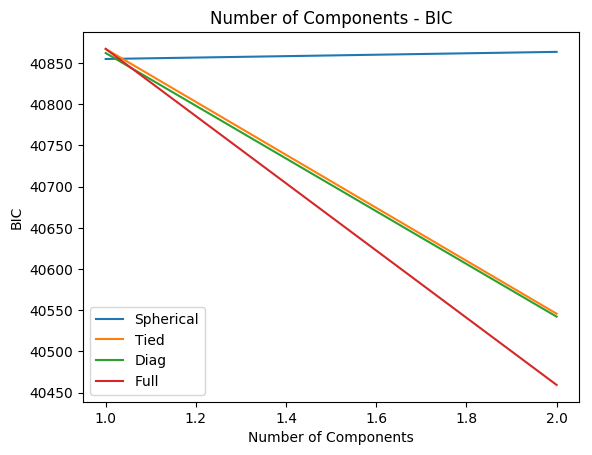

In [41]:
fig, ax1 = plt.subplots()

ax1.plot(num_components_values, bic[0], label = 'Spherical')
ax1.plot(num_components_values, bic[1], label = 'Tied')
ax1.plot(num_components_values, bic[2], label = 'Diag')
ax1.plot(num_components_values, bic[3], label = 'Full')
ax1.legend()
# ax1.xticks(range(1, degree_mkt,1))
ax1.set_title("Number of Components - BIC")
ax1.set_xlabel("Number of Components")
ax1.set_ylabel("BIC")
plt.savefig('output/step3/s3_lda_gm_bic.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


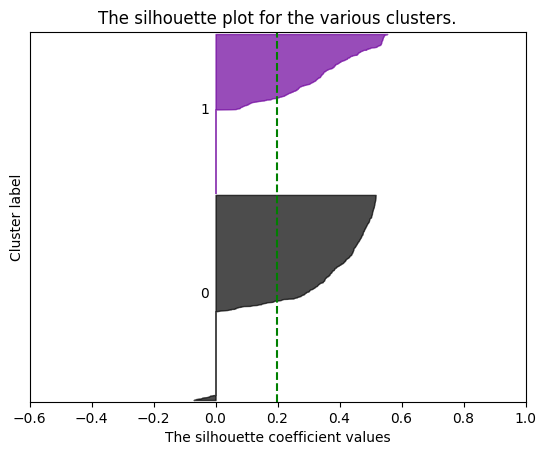

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


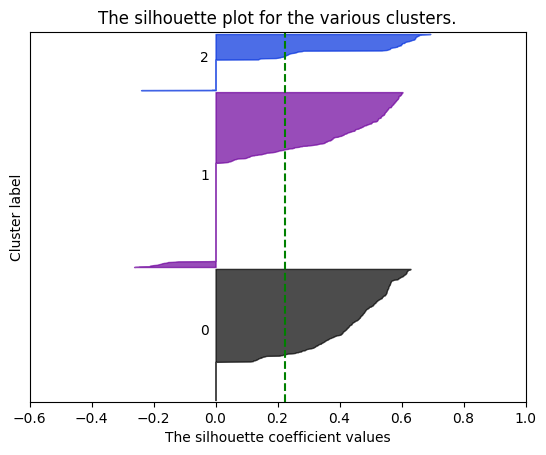

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


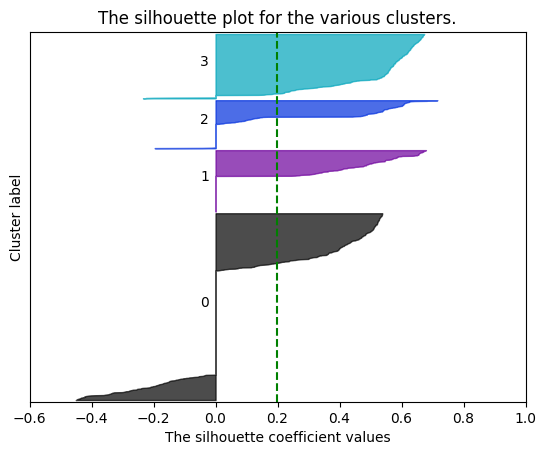

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


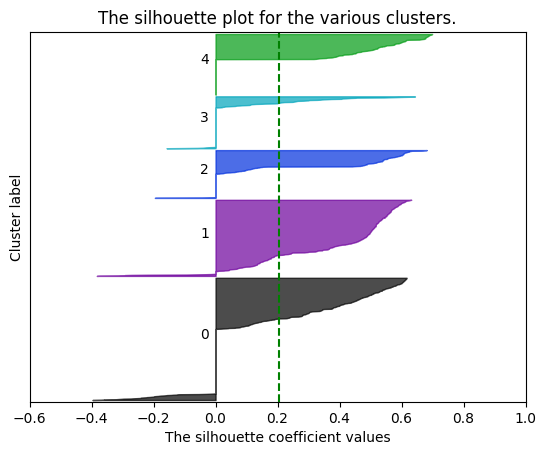

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


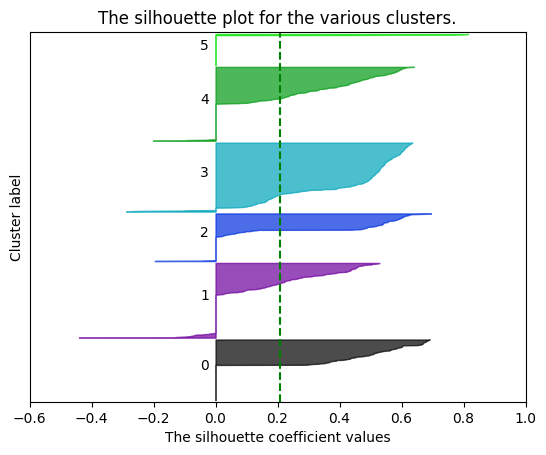

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


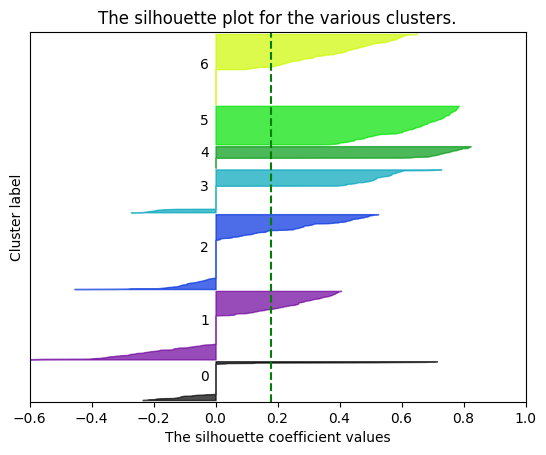

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


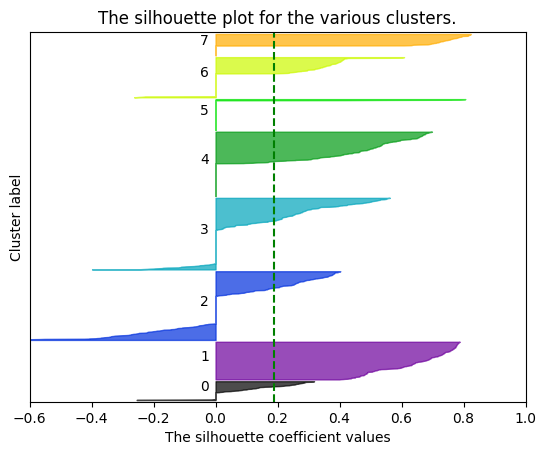

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


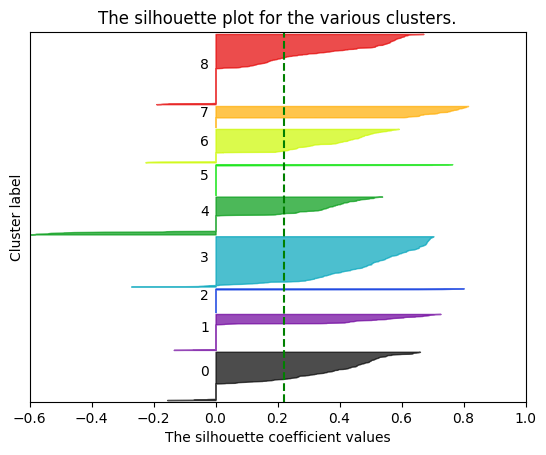

In [44]:
# Code taken from scikit-learn examples (https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
#https://www.geeksforgeeks.org/ml-v-measure-for-evaluating-clustering-performance/

range_n_components = np.arange(2, 10, 1)
silhouette_avg_list = []
homogeneity_avg_list = []
completeness_avg_list = []
v_avg_list = []
ami_list = []
sse_list = []


for n_components in range_n_components:
    fig, ax1 = plt.subplots()

    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, len(features_tSNE) + (n_components + 1) * 10])

    clusterer = GaussianMixture(n_components=n_components, covariance_type='full')
    cluster_labels = clusterer.fit_predict(features_tSNE)

    silhouette_avg = silhouette_score(features_tSNE, cluster_labels)
    homogeneity_avg = homogeneity_score(classes, cluster_labels)
    completeness_avg = completeness_score(classes, cluster_labels)
    v_avg = v_measure_score(classes, cluster_labels)
    ami = adjusted_mutual_info_score(classes, cluster_labels)
    sse = -clusterer.score(features_tSNE)
    
    silhouette_avg_list.append(silhouette_avg)
    homogeneity_avg_list.append(homogeneity_avg)
    completeness_avg_list.append(completeness_avg)
    v_avg_list.append(v_avg)
    ami_list.append(ami)
    sse_list.append(sse)

    sample_silhouette_values = silhouette_samples(features_tSNE, cluster_labels)

    y_lower = 10
    for i in range(n_components):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="green", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.6,-0.4,-0.2,0, 0.2, 0.4, 0.6, 0.8, 1])
    
    save_name = 'output/step3/s3_lda_gm_silhouette_c=' + str(n_components)+'.png'
    plt.savefig(save_name)
    
    plt.show()

[2 3 4 5 6 7 8 9]


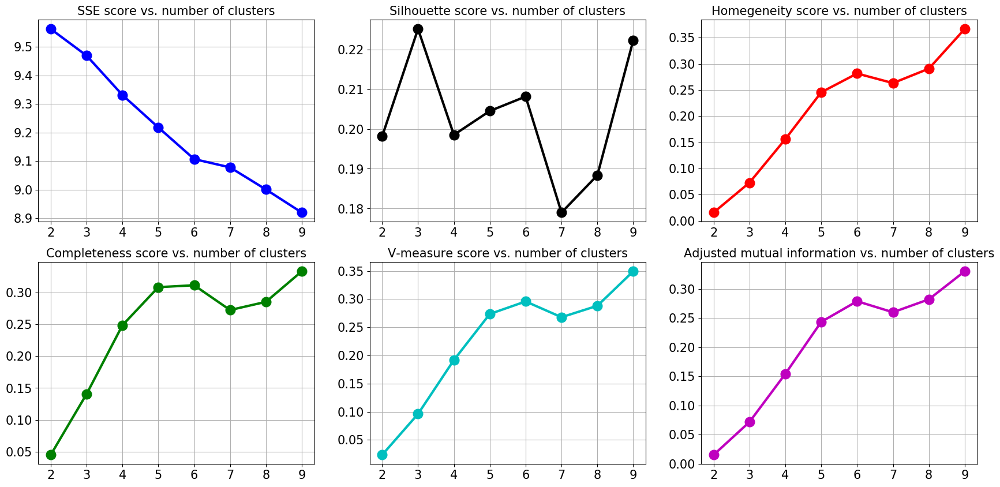

In [45]:

plt.figure(figsize=(21,10))

plot_range = range_n_components
print(plot_range)

#SSE
plt.subplot(2,3,1)
plt.plot(plot_range, sse_list,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot(plot_range, silhouette_avg_list,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot(plot_range, homogeneity_avg_list,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks(plot_range,fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot(plot_range, completeness_avg_list,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot(plot_range, v_avg_list,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot(plot_range, ami_list,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks(plot_range, fontsize=15)
plt.yticks(fontsize=15)

plt.savefig('output/step3/s3_lda_gm_scores_vs_clusters.png')

plt.show()

# Step 4: fit NN on new input space

In [46]:
feature_PCA = PCA().fit_transform(features)
feature_ICA = FastICA().fit_transform(features)
feature_RP = GaussianRandomProjection(n_components=16).fit_transform(features)


NameError: name 'PCA' is not defined

In [50]:
tsne = TSNE(random_state=seed, n_components=2)
feature_tSNE = tsne.fit_transform(features)

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')


In [52]:

from sklearn import neural_network
from sklearn.base import BaseEstimator

NN_classifier = neural_network.MLPClassifier(activation='logistic', alpha=0.01, batch_size='auto',
       beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(16, 16), learning_rate='constant',
       learning_rate_init=0.01, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)


## 1. PCA

In [126]:
import sklearn.model_selection
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
feature_PCA, classes, test_size=0.2, random_state=seed, stratify=classes)

NN_classifier.fit(training_x, training_y)

training_y_pred = NN_classifier.predict(training_x)
testing_y_pred = NN_classifier.predict(testing_x)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


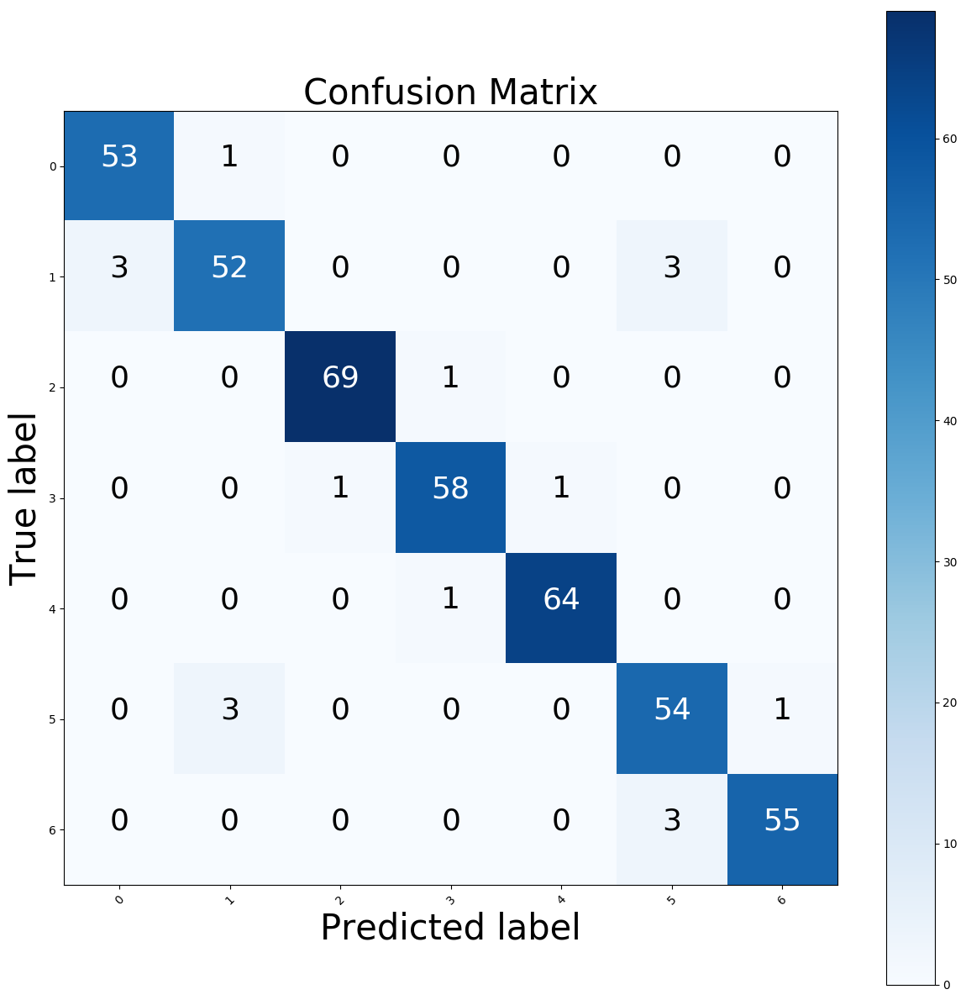

In [128]:
from sklearn.metrics import confusion_matrix
import itertools
# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)
plt.savefig('output/step4/s4_pca_cm.png')





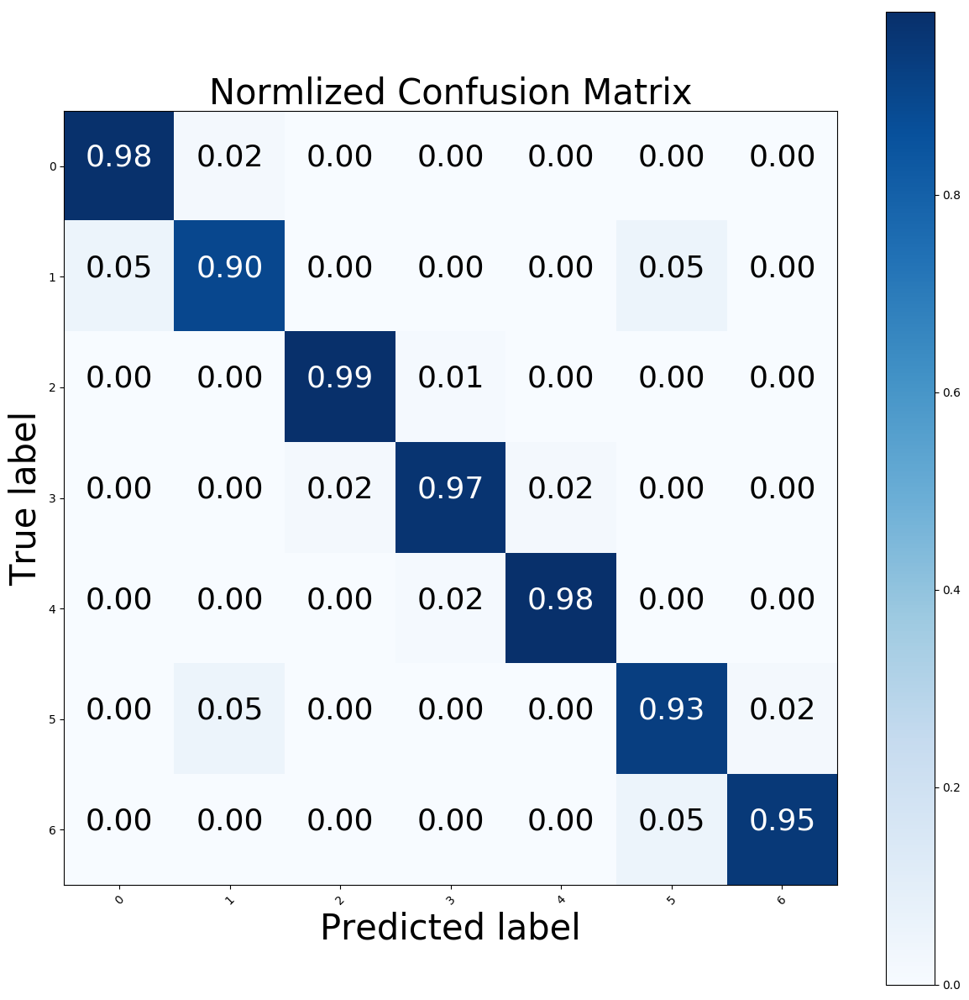

In [129]:
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.2f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)
plt.savefig('output/step4/s4_pca_ncm.png')


In [130]:
from sklearn.metrics import make_scorer, accuracy_score


train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))


accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    NN_classifier,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)


[learning_curve] Training set sizes: [  67   70   74   77   80   84   87   90   94   97  101  104  107  111
  114  117  121  124  127  131  134  198  262  326  389  453  517  581
  645  708  772  836  900  964 1027 1091 1155 1219 1283 1347]


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  12 out of 200 | elapsed:    0.6s remaining:   10.0s
[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    1.4s remaining:    7.3s
[Parallel(n_jobs=4)]: Done  54 out of 200 | elapsed:    2.2s remaining:    5.9s
[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:    3.1s remaining:    5.1s
[Parallel(n_jobs=4)]: Done  96 out of 200 | elapsed:    3.7s remaining:    4.1s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max

[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:    4.8s remaining:    3.4s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/mul

[Parallel(n_jobs=4)]: Done 138 out of 200 | elapsed:    5.3s remaining:    2.4s
[Parallel(n_jobs=4)]: Done 159 out of 200 | elapsed:    6.6s remaining:    1.7s
[Parallel(n_jobs=4)]: Done 180 out of 200 | elapsed:    7.0s remaining:    0.8s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    8.3s finished


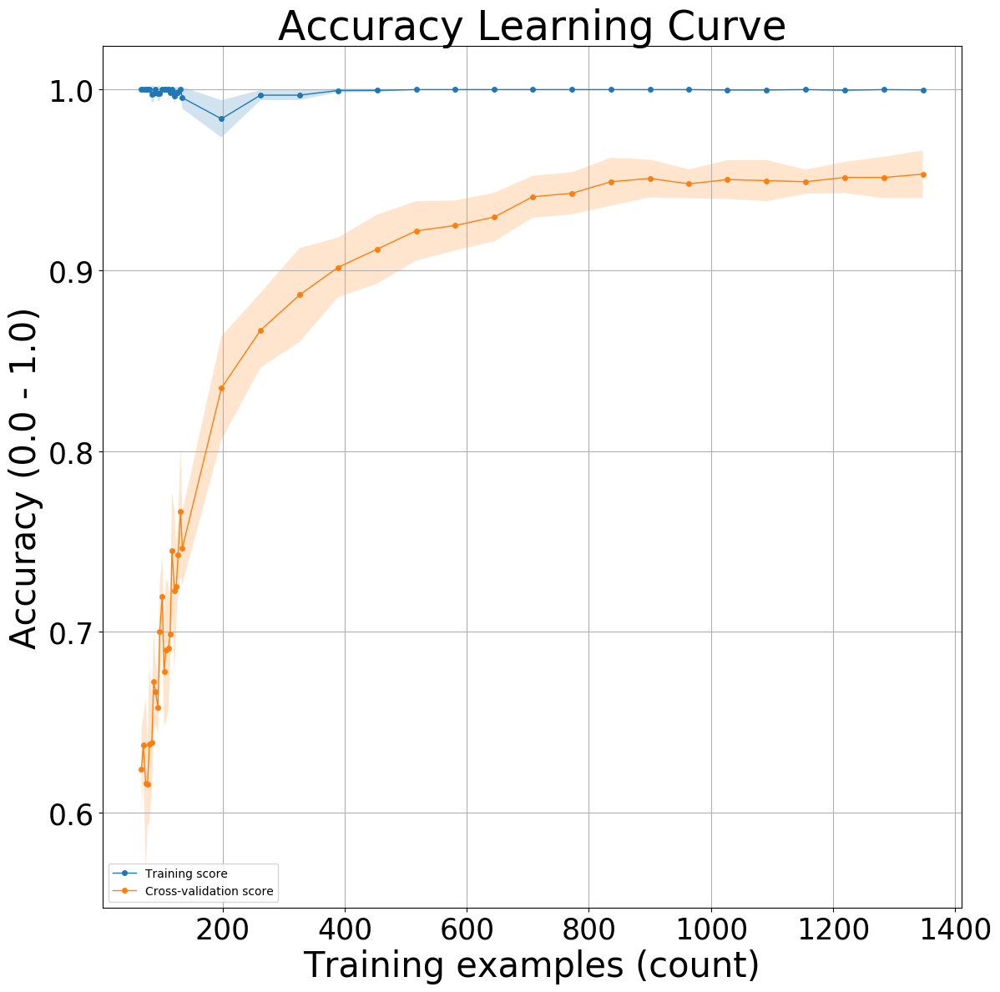

In [131]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")
plt.savefig('output/step4/s4_pca_learning_curve.png')



/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
No handles with labels found to put in legend.


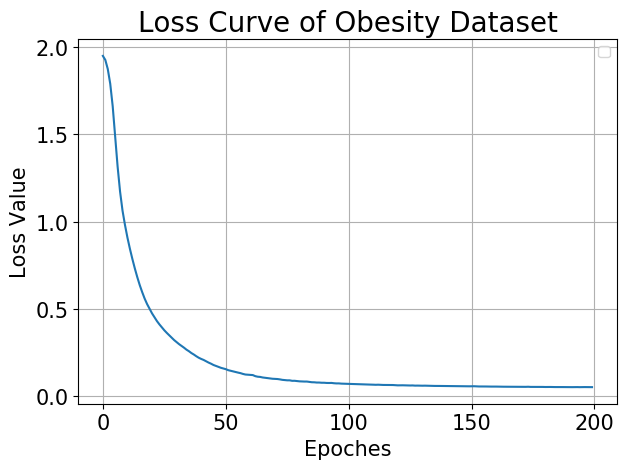

In [132]:
loss_values = NN_classifier.loss_curve_
NN_classifier.fit(training_x, training_y)

learning_rate_init_adjust = [10 ** -x for x in np.arange(-2.0, 6.0)]

plt.show()

plt.close('all')
plt.figure()
plt.title('Loss Curve of Obesity Dataset', fontsize=20)
plt.tick_params(labelsize=15)

plt.xlabel('Epoches', fontsize=15)
plt.ylabel('Loss Value', fontsize=15)
plt.grid()
plt.tight_layout()

plt.plot(loss_values, label="")

plt.legend(loc="best")
plt.tight_layout()
plt.savefig('output/step4/s4_pca_loss_curve.png')


## 2. ICA

In [133]:
import sklearn.model_selection
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
feature_ICA, classes, test_size=0.2, random_state=seed, stratify=classes)

NN_classifier.fit(training_x, training_y)

training_y_pred = NN_classifier.predict(training_x)
testing_y_pred = NN_classifier.predict(testing_x)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


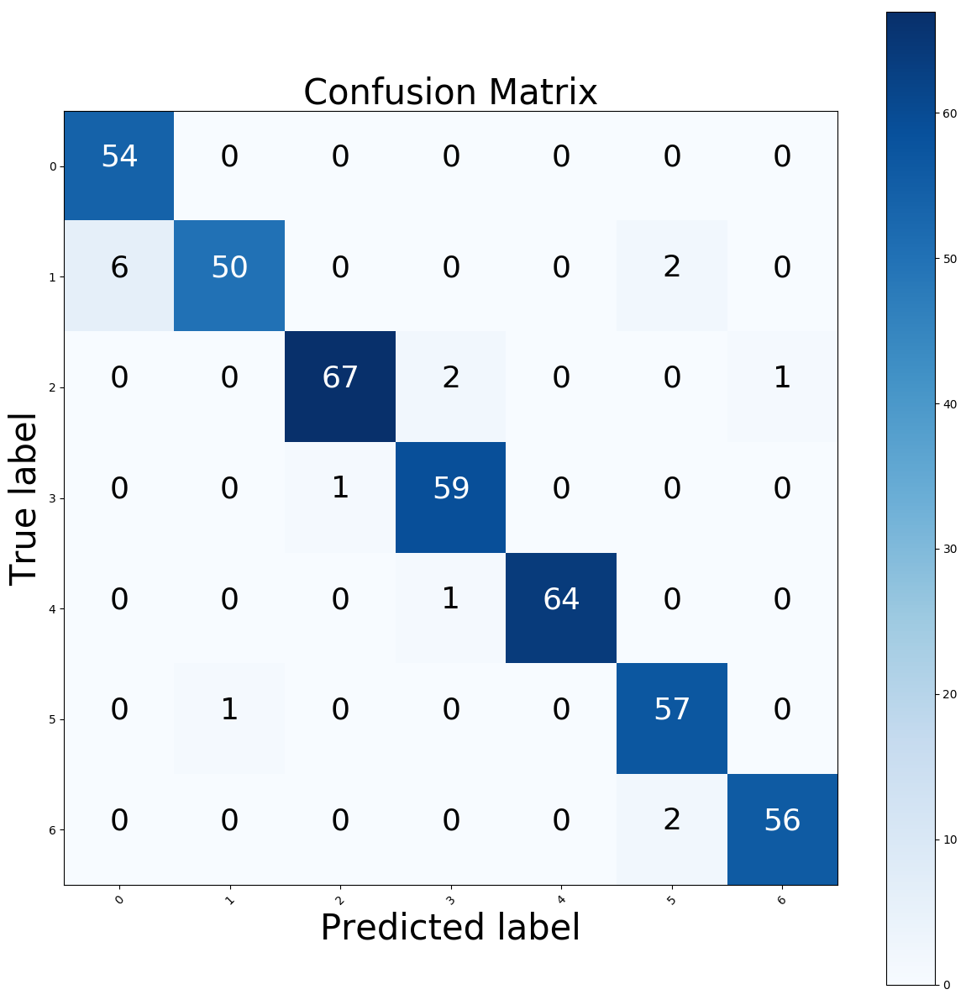

In [134]:
from sklearn.metrics import confusion_matrix
import itertools
# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step4/s4_ica_cm.png')




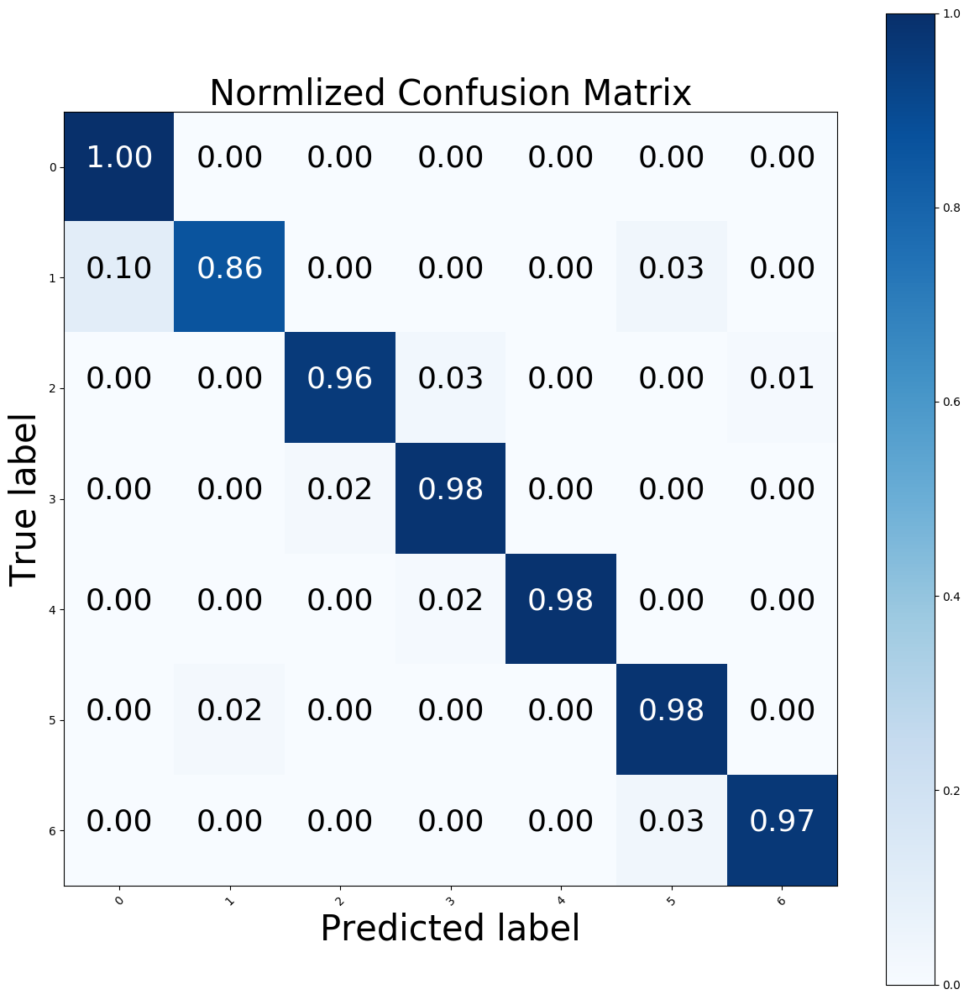

In [135]:
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.2f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step4/s4_ica_ncm.png')


In [136]:
from sklearn.metrics import make_scorer, accuracy_score


train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))


accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    NN_classifier,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)


[learning_curve] Training set sizes: [  67   70   74   77   80   84   87   90   94   97  101  104  107  111
  114  117  121  124  127  131  134  198  262  326  389  453  517  581
  645  708  772  836  900  964 1027 1091 1155 1219 1283 1347]
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.660), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.695), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.648), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.736), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.995, test=0.830), total=   0.1s
[CV]  ...........................................

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  12 out of 200 | elapsed:    0.1s remaining:    1.0s


[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.648), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.628), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.651), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.642), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.692), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.780), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.992, test=0.839), total=   0.1s
[CV]  

[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    0.5s remaining:    2.3s
[Parallel(n_jobs=4)]: Done  54 out of 200 | elapsed:    0.8s remaining:    2.2s


[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.666), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.701), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.745), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.689), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.730), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.918), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.944), total=   0.2s
[CV]  

[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:    1.5s remaining:    2.5s
[Parallel(n_jobs=4)]: Done  96 out of 200 | elapsed:    1.8s remaining:    1.9s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/mi

[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:    2.6s remaining:    1.8s
[Parallel(n_jobs=4)]: Done 138 out of 200 | elapsed:    2.8s remaining:    1.2s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/mi

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

[Parallel(n_jobs=4)]: Done 180 out of 200 | elapsed:    3.6s remaining:    0.4s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    4.2s finished


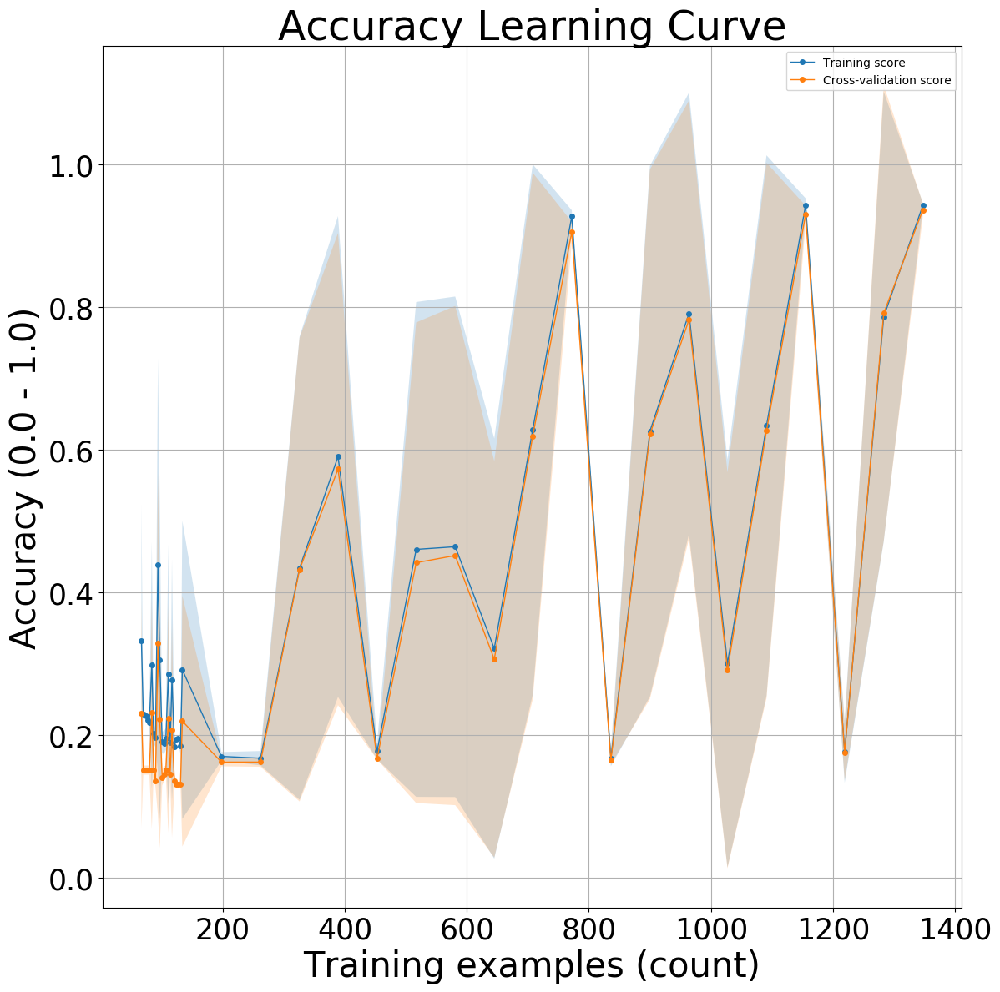

In [137]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")
plt.savefig('output/step4/s4_ica_learning_curve.png')



/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
No handles with labels found to put in legend.


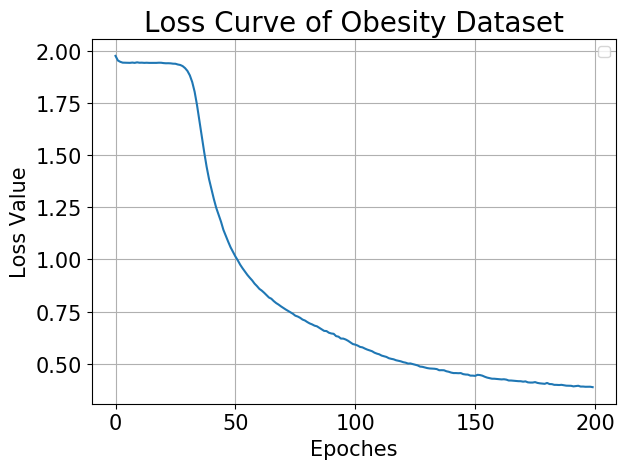

In [138]:
loss_values = NN_classifier.loss_curve_
NN_classifier.fit(training_x, training_y)

learning_rate_init_adjust = [10 ** -x for x in np.arange(-2.0, 6.0)]


plt.show()


plt.close('all')
plt.figure()
plt.title('Loss Curve of Obesity Dataset', fontsize=20)
plt.tick_params(labelsize=15)

plt.xlabel('Epoches', fontsize=15)
plt.ylabel('Loss Value', fontsize=15)
plt.grid()
plt.tight_layout()

plt.plot(loss_values, label="")

plt.legend(loc="best")
plt.tight_layout()
plt.savefig('output/step4/s4_ica_loss_curve.png')


## 3. RP

In [139]:
import sklearn.model_selection
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
feature_RP, classes, test_size=0.2, random_state=seed, stratify=classes)

NN_classifier.fit(training_x, training_y)

training_y_pred = NN_classifier.predict(training_x)
testing_y_pred = NN_classifier.predict(testing_x)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


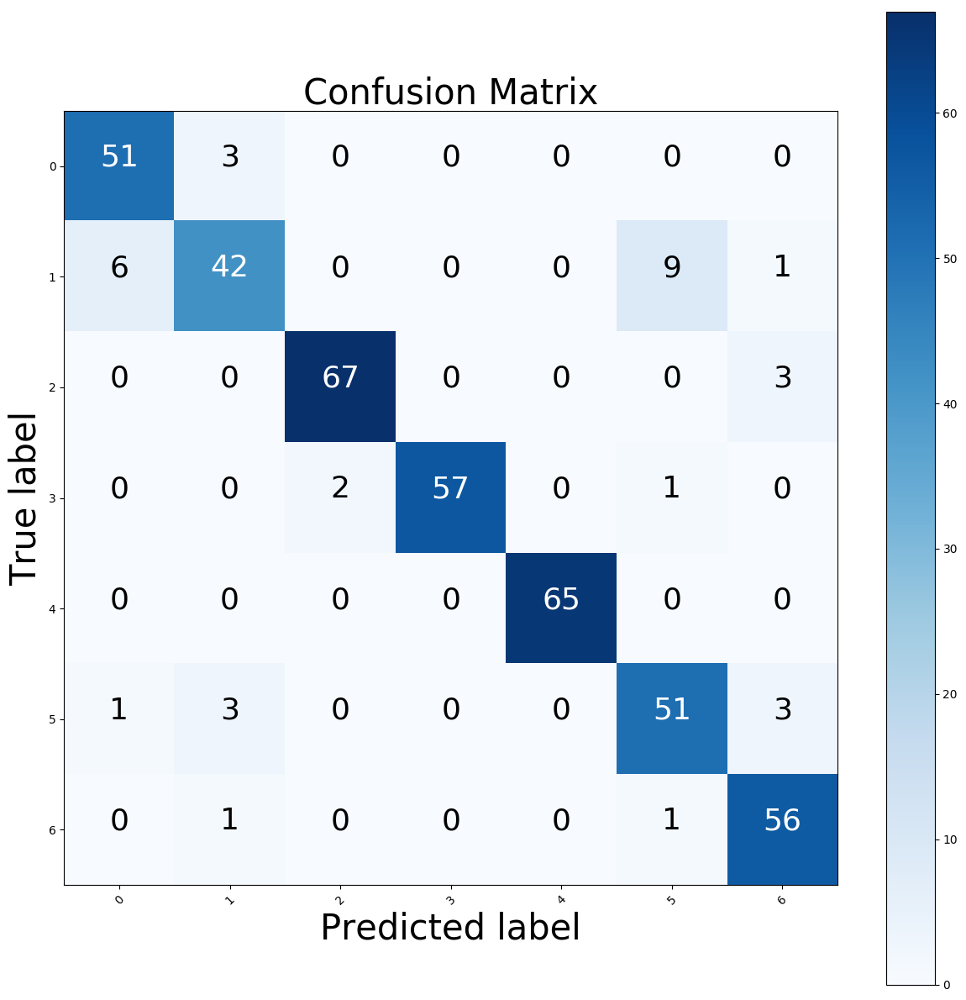

In [140]:
from sklearn.metrics import confusion_matrix
import itertools
# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)


plt.savefig('output/step4/s4_rp_cm.png')



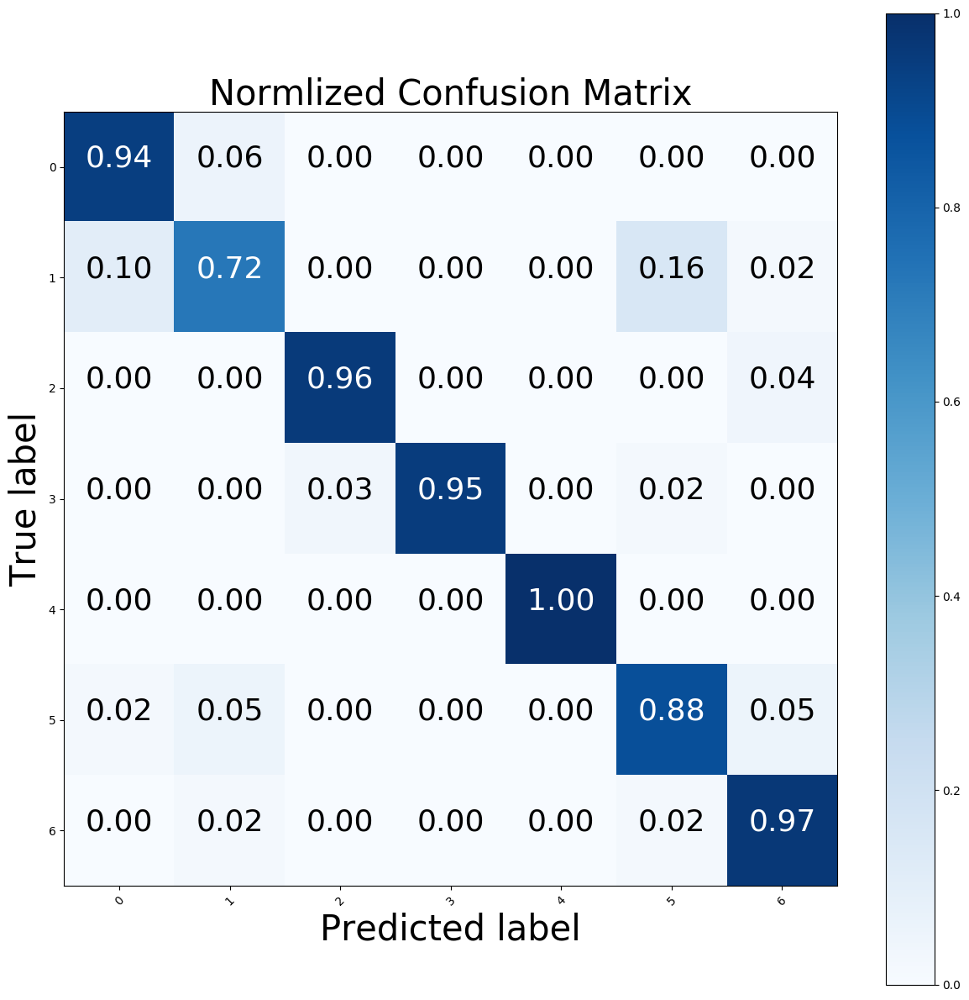

In [141]:
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.2f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step4/s4_rp_ncm.png')


In [142]:
from sklearn.metrics import make_scorer, accuracy_score


train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))


accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    NN_classifier,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)


[learning_curve] Training set sizes: [  67   70   74   77   80   84   87   90   94   97  101  104  107  111
  114  117  121  124  127  131  134  198  262  326  389  453  517  581
  645  708  772  836  900  964 1027 1091 1155 1219 1283 1347]


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilay


[CV]  ................................................................
[CV] ................ , score=(train=0.151, test=0.152), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.155, test=0.152), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.716, test=0.553), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.229, test=0.153), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.230, test=0.153), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.221, test=0.153), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.212, test=0.153), total=   0.0s
[CV] 

[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    1.1s remaining:    5.5s



[CV]  ................................................................
[CV] ................ , score=(train=0.861, test=0.829), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.942, test=0.921), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.957, test=0.947), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.239, test=0.154), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.229, test=0.154), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.230, test=0.154), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.221, test=0.154), total=   0.0s
[CV] 

[Parallel(n_jobs=4)]: Done  54 out of 200 | elapsed:    1.8s remaining:    5.0s
[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:    2.8s remaining:    4.7s



[CV]  ................................................................
[CV] ................ , score=(train=0.947, test=0.947), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.189, test=0.153), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.615, test=0.509), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.164, test=0.153), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.192, test=0.165), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.177, test=0.165), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.931, test=0.909), total=   0.3s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:    4.5s remaining:    3.2s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/mul

[Parallel(n_jobs=4)]: Done 138 out of 200 | elapsed:    5.0s remaining:    2.3s
[Parallel(n_jobs=4)]: Done 159 out of 200 | elapsed:    6.3s remaining:    1.6s
[Parallel(n_jobs=4)]: Done 180 out of 200 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    8.0s finished


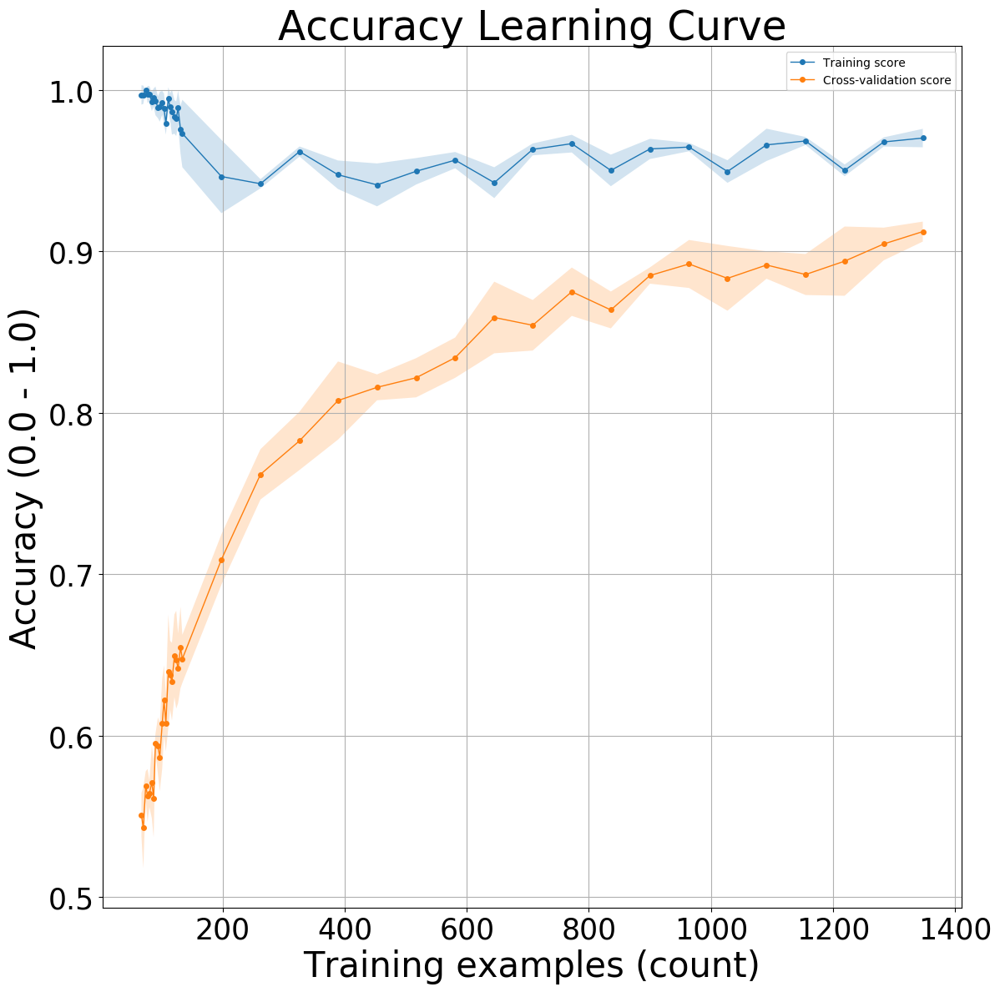

In [143]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")

plt.savefig('output/step4/s4_rp_learning_curve.png')



/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
No handles with labels found to put in legend.


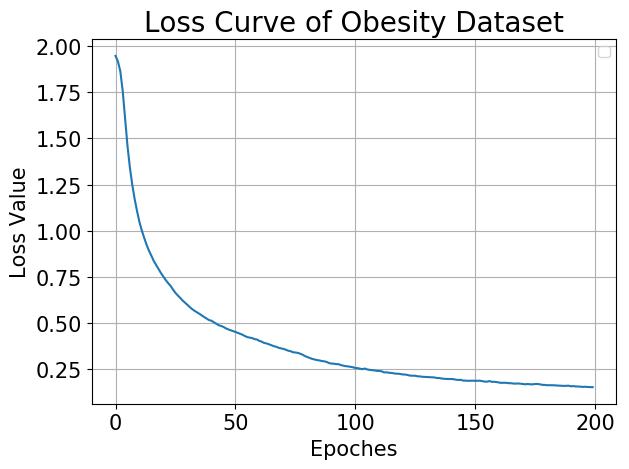

In [144]:
loss_values = NN_classifier.loss_curve_
NN_classifier.fit(training_x, training_y)

learning_rate_init_adjust = [10 ** -x for x in np.arange(-2.0, 6.0)]


plt.show()


plt.close('all')
plt.figure()
plt.title('Loss Curve of Obesity Dataset', fontsize=20)
plt.tick_params(labelsize=15)

plt.xlabel('Epoches', fontsize=15)
plt.ylabel('Loss Value', fontsize=15)
plt.grid()
plt.tight_layout()

plt.plot(loss_values, label="")

plt.legend(loc="best")
plt.tight_layout()

plt.savefig('output/step4/s4_rp_loss_curve.png')


## 4. tSNE

In [59]:
import sklearn.model_selection
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
feature_tSNE, classes, test_size=0.2, random_state=seed, stratify=classes)

NN_classifier.fit(training_x, training_y)

training_y_pred = NN_classifier.predict(training_x)
testing_y_pred = NN_classifier.predict(testing_x)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


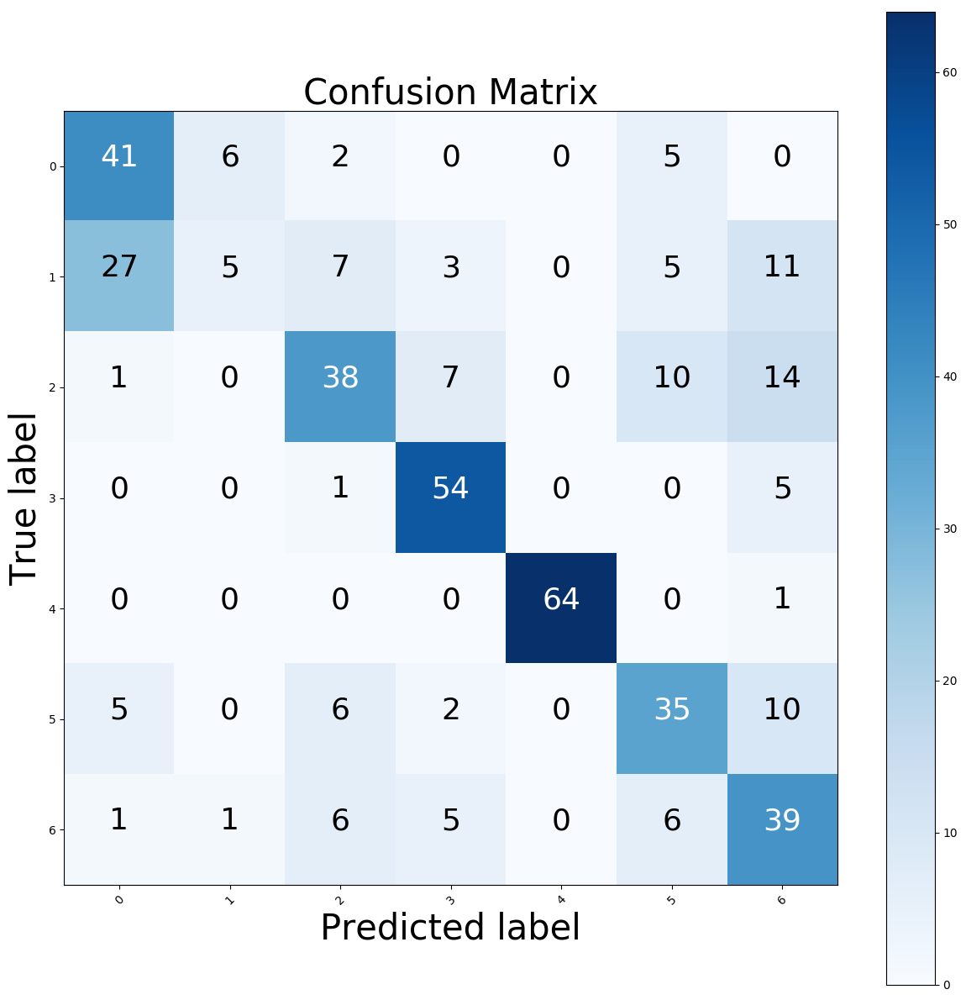

In [60]:
from sklearn.metrics import confusion_matrix
import itertools
# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step4/s4_tsne_cm.png')




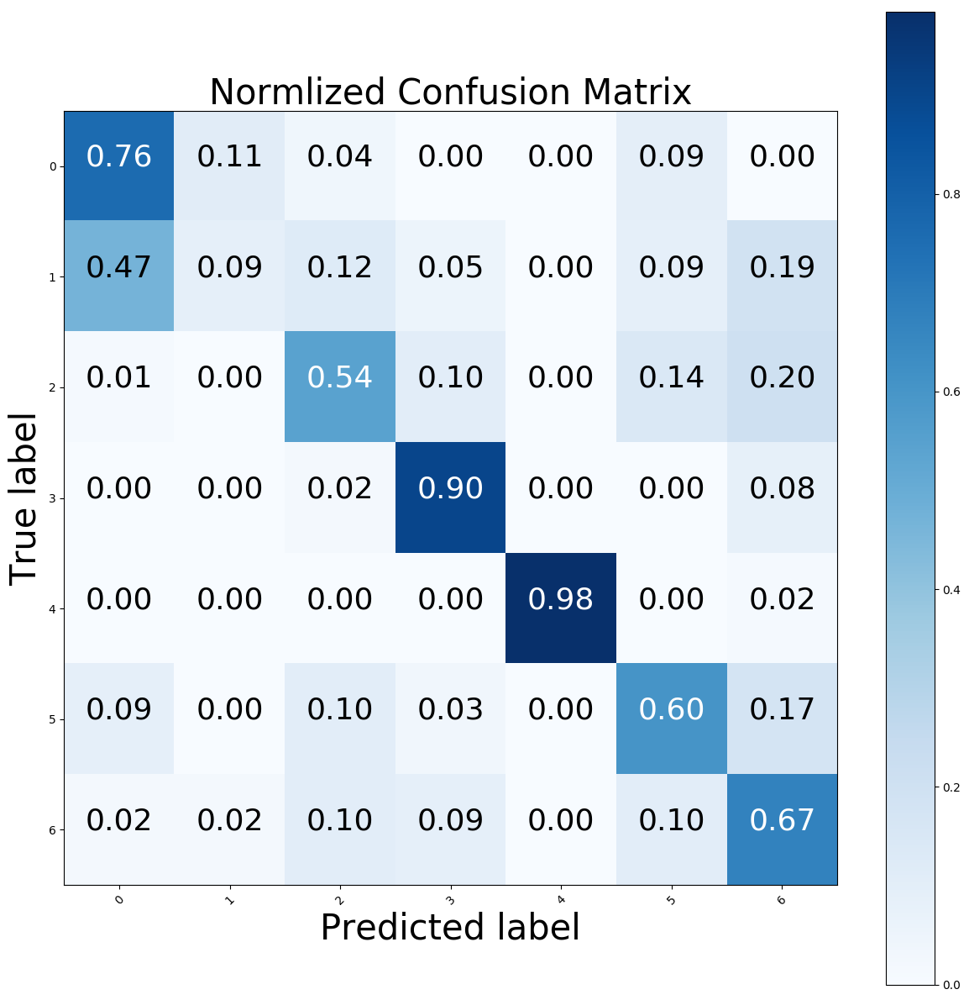

In [61]:
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.2f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step4/s4_tsne_ncm.png')


In [62]:
from sklearn.metrics import make_scorer, accuracy_score


train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))


accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    NN_classifier,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)


[learning_curve] Training set sizes: [  67   70   74   77   80   84   87   90   94   97  101  104  107  111
  114  117  121  124  127  131  134  198  262  326  389  453  517  581
  645  708  772  836  900  964 1027 1091 1155 1219 1283 1347]


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  12 out of 200 | elapsed:    0.2s remaining:    3.8s


[CV]  ................................................................
[CV] ................ , score=(train=0.716, test=0.525), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.726, test=0.501), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.649, test=0.466), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.740, test=0.560), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.624, test=0.522), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.618, test=0.519), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.623, test=0.545), total=   0.1s
[CV]  

[CV] ................ , score=(train=0.724, test=0.566), total=   0.1s[CV]  ................................................................
[CV] ................ , score=(train=0.657, test=0.534), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.759, test=0.548), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.574, test=0.399), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.632, test=0.487), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.630, test=0.543), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.588, test=0.531), total=   0.1s
[CV]  ................................................................
[CV] ..

[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    1.0s remaining:    5.3s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/mul

[CV]  ................................................................
[CV] ................ , score=(train=0.753, test=0.537), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.723, test=0.557), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.622, test=0.528), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.653, test=0.540), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.591, test=0.551), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.530, test=0.457), total=   0.2s
[CV]  ................................................................
[CV] ................ , score=(train=0.660, test=0.610), total=   0.2s
[CV]  

[Parallel(n_jobs=4)]: Done  54 out of 200 | elapsed:    1.9s remaining:    5.0s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/mul

[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:    2.9s remaining:    4.8s
[Parallel(n_jobs=4)]: Done  96 out of 200 | elapsed:    3.6s remaining:    3.9s
[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:    4.8s remaining:    3.4s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimi

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

[Parallel(n_jobs=4)]: Done 159 out of 200 | elapsed:    6.3s remaining:    1.6s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/mul

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    8.0s finished


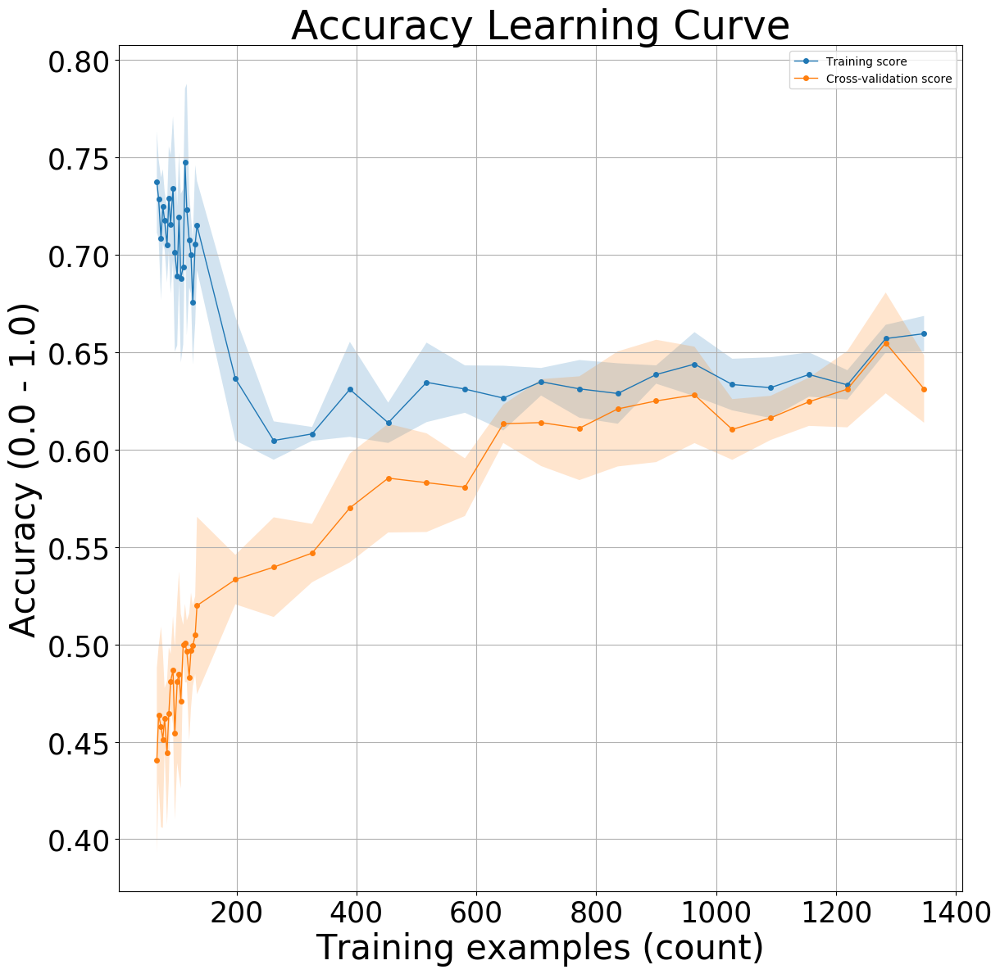

In [63]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")

plt.savefig('output/step4/s4_tsne_learning_curve.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
No handles with labels found to put in legend.


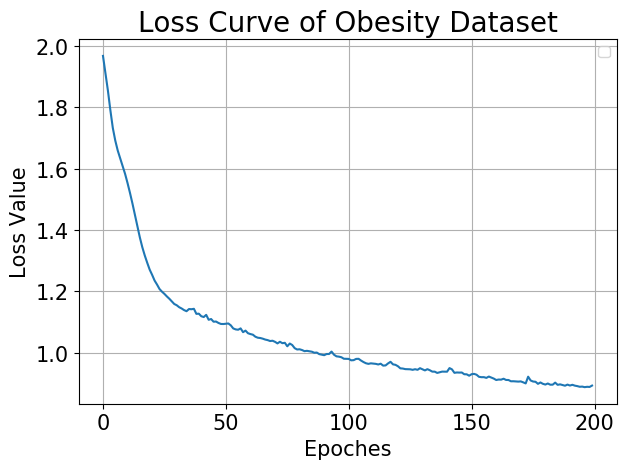


[CV]  ................................................................
[CV] ................ , score=(train=0.787, test=0.491), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.693, test=0.503), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.766, test=0.509), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.726, test=0.512), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.724, test=0.574), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.607, test=0.556), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.614, test=0.588), total=   0.2s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite


[CV]  ................................................................
[CV] ................ , score=(train=0.676, test=0.607), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.637, test=0.601), total=   0.4s
[CV]  ................................................................
[CV] ................ , score=(train=0.676, test=0.447), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.725, test=0.485), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.690, test=0.441), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.760, test=0.503), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.727, test=0.497), total=   0.1s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

In [64]:
loss_values = NN_classifier.loss_curve_
NN_classifier.fit(training_x, training_y)

learning_rate_init_adjust = [10 ** -x for x in np.arange(-2.0, 6.0)]


plt.show()


plt.close('all')
plt.figure()
plt.title('Loss Curve of Obesity Dataset', fontsize=20)
plt.tick_params(labelsize=15)

plt.xlabel('Epoches', fontsize=15)
plt.ylabel('Loss Value', fontsize=15)
plt.grid()
plt.tight_layout()

plt.plot(loss_values, label="")

plt.legend(loc="best")
plt.tight_layout()

plt.savefig('output/step4/s4_tsne_loss_curve.png')


# Step 5: Clustering and use this output to derive features for NN

## 1. K Means

In [151]:
k_means_clustering = KMeans(n_clusters=20, random_state=seed)
k_means_clustering.fit(features)
kmeans_classes = np.reshape(k_means_clustering.labels_, (-1, 1))


In [152]:
import sklearn.model_selection
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
features, kmeans_classes, test_size=0.2, random_state=seed, stratify=classes)

NN_classifier.fit(training_x, training_y)

training_y_pred = NN_classifier.predict(training_x)
testing_y_pred = NN_classifier.predict(testing_x)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


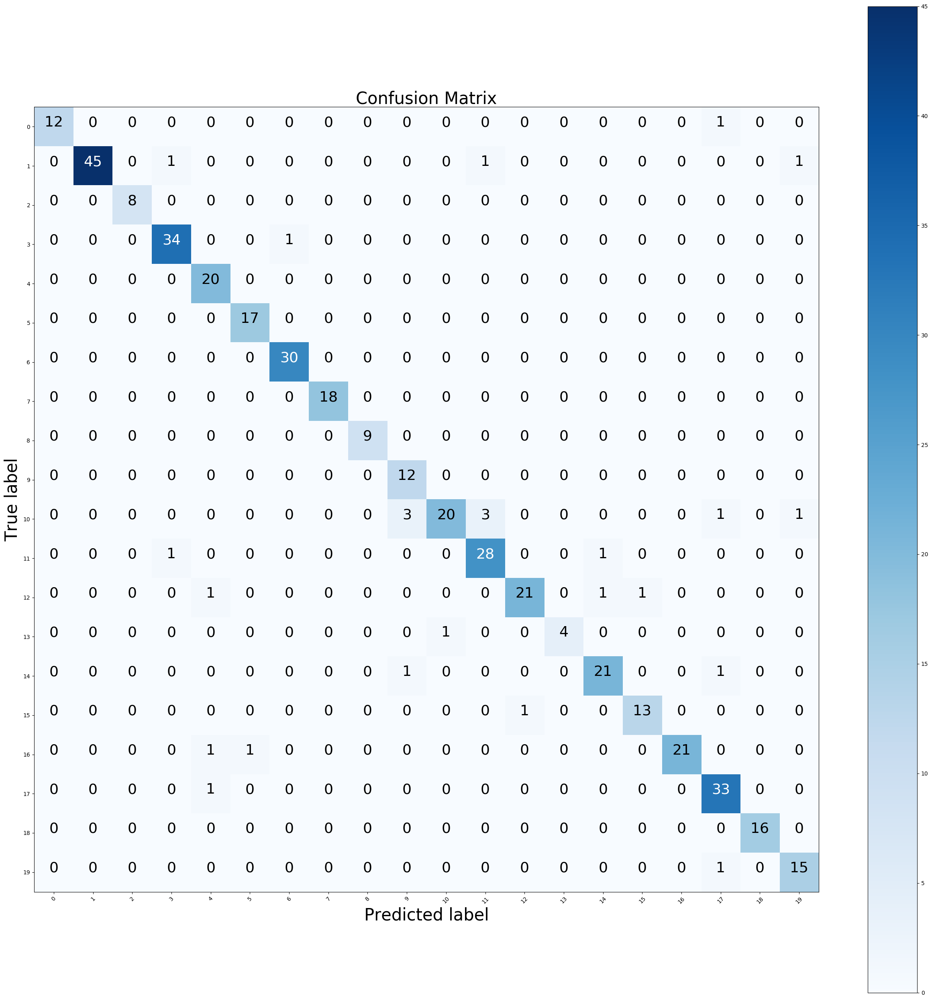

In [154]:
from sklearn.metrics import confusion_matrix
import itertools
# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(kmeans_classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(25, 25))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)
plt.savefig('output/step5/s5_kmeans_cm.png')





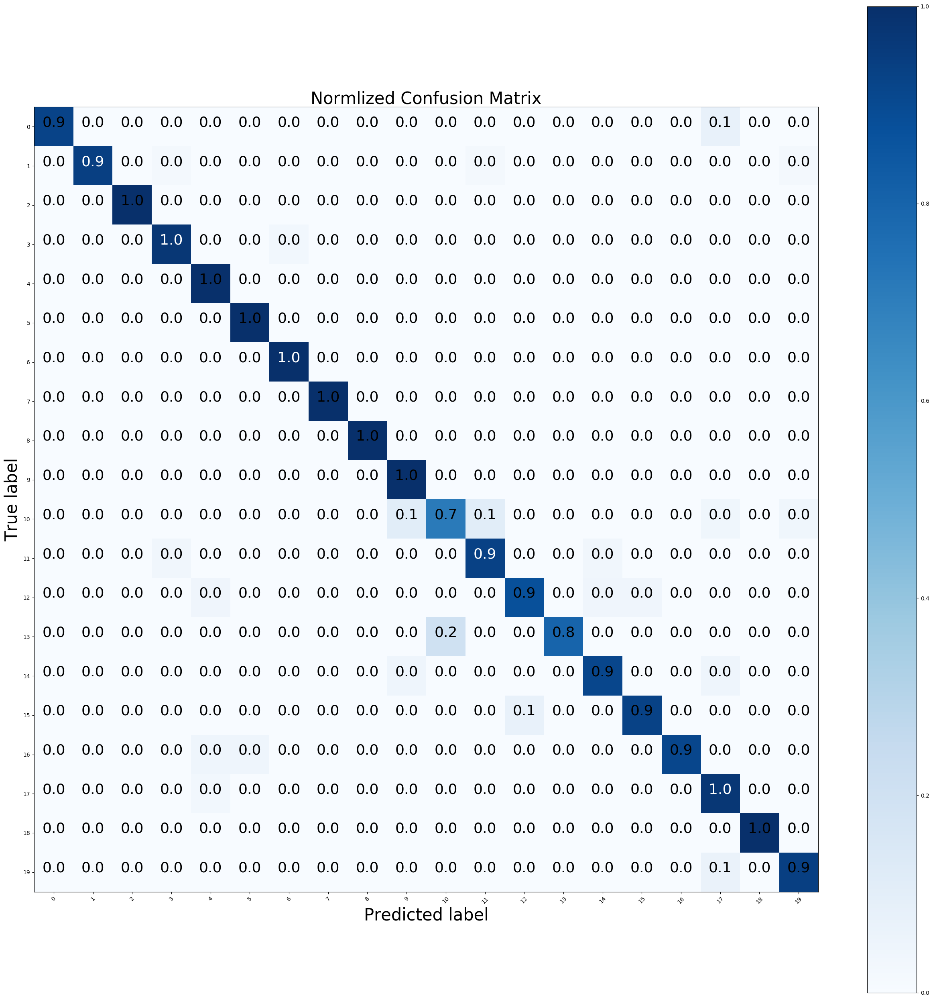

In [155]:
plt.close()
plt.figure(figsize=(25, 25))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.1f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)
plt.savefig('output/step5/s5_kmeans_ncm.png')


In [156]:
from sklearn.metrics import make_scorer, accuracy_score


train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))


accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    NN_classifier,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)


[learning_curve] Training set sizes: [  67   70   73   77   80   83   87   90   93   97  100  104  107  110
  114  117  120  124  127  130  134  197  261  324  388  452  515  579
  642  706  769  833  897  960 1024 1087 1151 1214 1278 1342]


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  12 out of 200 | elapsed:    0.3s remaining:    4.1s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/minicon

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    1.2s remaining:    6.3s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/mul

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum ite

[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:    3.3s remaining:    5.4s



[CV]  ................................................................
[CV] ................ , score=(train=0.980, test=0.918), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.977, test=0.938), total=   0.4s
[CV]  ................................................................
[CV] ................ , score=(train=0.985, test=0.715), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.760), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.810), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.952, test=0.772), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.989, test=0.789), total=   0.1s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptr


[CV]  ................................................................
[CV] ................ , score=(train=0.971, test=0.915), total=   0.2s
[CV]  ................................................................
[CV] ................ , score=(train=0.981, test=0.918), total=   0.2s
[CV]  ................................................................
[CV] ................ , score=(train=0.966, test=0.938), total=   0.4s
[CV]  ................................................................
[CV] ................ , score=(train=0.977, test=0.926), total=   0.4s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.810), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.816), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.825), total=   0.1s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning

[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:    5.2s remaining:    3.7s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/sh

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning


[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.854), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.827), total=   0.0s
[CV]  ................................................................
[CV] ................ , score=(train=0.988, test=0.848), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.989, test=0.827), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.990, test=0.845), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.991, test=0.827), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.970, test=0.839), total=   0.1s
[CV] 

[Parallel(n_jobs=4)]: Done 159 out of 200 | elapsed:    7.2s remaining:    1.9s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-pac

[Parallel(n_jobs=4)]: Done 180 out of 200 | elapsed:    7.6s remaining:    0.8s



[CV]  ................................................................
[CV] ................ , score=(train=0.982, test=0.851), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.992, test=0.869), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.985, test=0.920), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.975, test=0.923), total=   0.2s
[CV]  ................................................................
[CV] ................ , score=(train=0.981, test=0.943), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.979, test=0.938), total=   0.3s
[CV]  ................................................................
[CV] ................ , score=(train=0.976, test=0.952), total=   0.4s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning

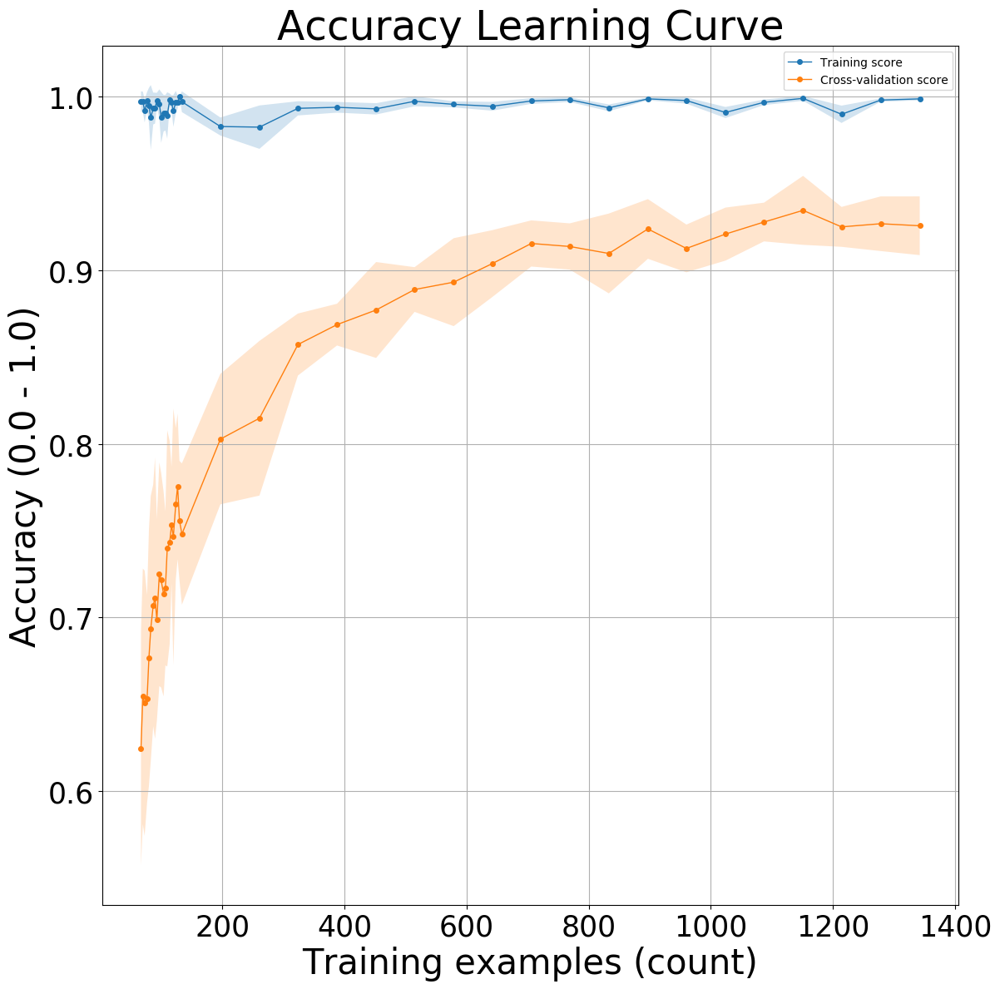

In [157]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")

plt.savefig('output/step5/s5_kmeans_learning_curve.png')


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
No handles with labels found to put in legend.


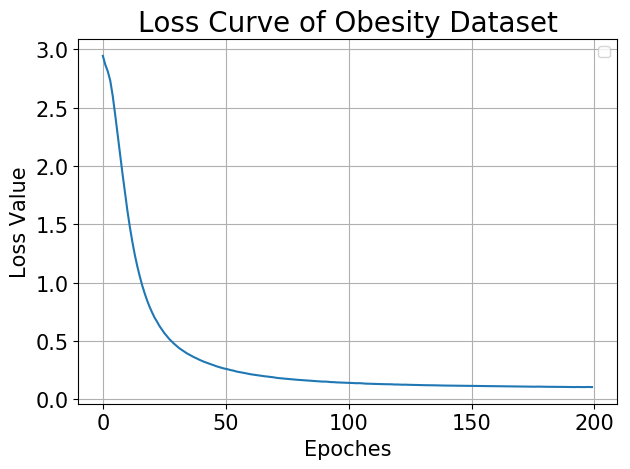

In [158]:
loss_values = NN_classifier.loss_curve_
NN_classifier.fit(training_x, training_y)

learning_rate_init_adjust = [10 ** -x for x in np.arange(-2.0, 6.0)]


plt.show()


plt.close('all')
plt.figure()
plt.title('Loss Curve of Obesity Dataset', fontsize=20)
plt.tick_params(labelsize=15)

plt.xlabel('Epoches', fontsize=15)
plt.ylabel('Loss Value', fontsize=15)
plt.grid()
plt.tight_layout()

plt.plot(loss_values, label="")

plt.legend(loc="best")
plt.tight_layout()

plt.savefig('output/step5/s5_kmeans_loss_curve.png')


## 2. GM

In [159]:
gmm_clustering = GaussianMixture(n_components=6, covariance_type='full')
gmm_clustering.fit(features)
gmm_label = gmm_clustering.predict(features)
gmm_classes = np.reshape(gmm_label, (-1, 1))


In [161]:
import sklearn.model_selection
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
features, gmm_classes, test_size=0.2, random_state=seed, stratify=classes)

NN_classifier.fit(training_x, training_y)

training_y_pred = NN_classifier.predict(training_x)
testing_y_pred = NN_classifier.predict(testing_x)


/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


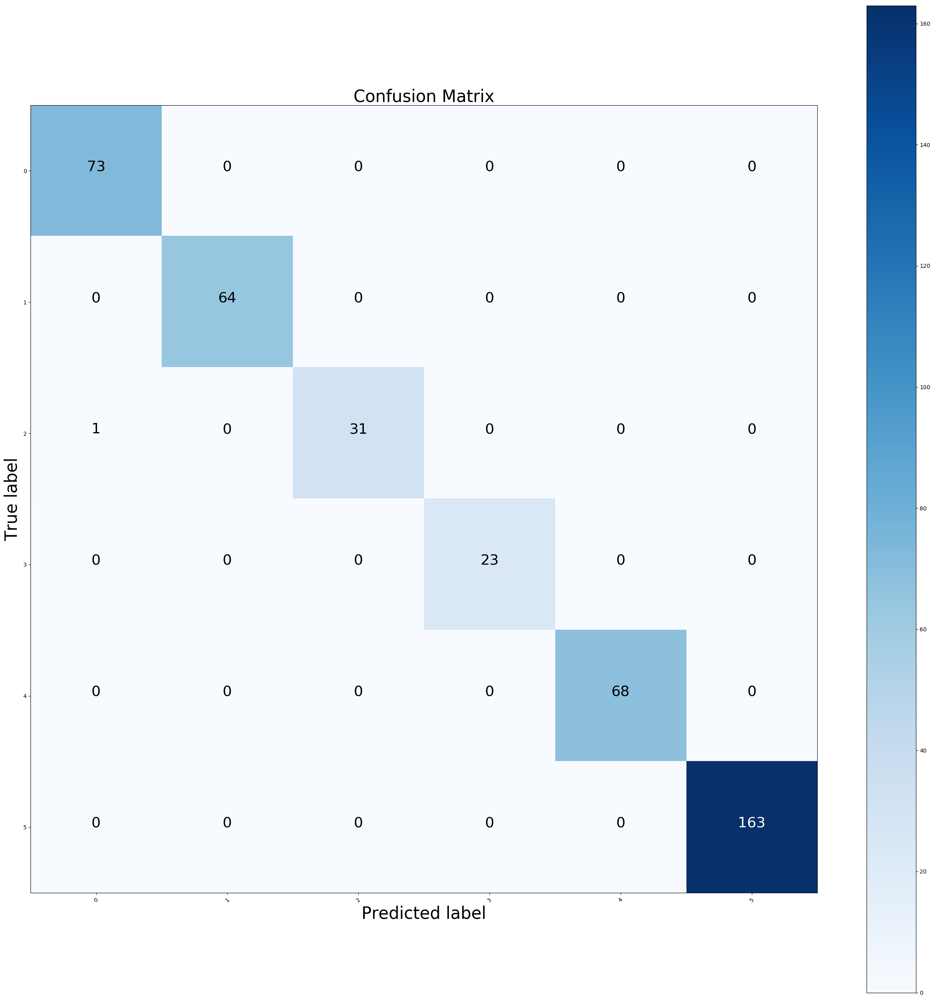

In [162]:
from sklearn.metrics import confusion_matrix
import itertools
# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(gmm_classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(25, 25))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step5/s5_gm_cm.png')





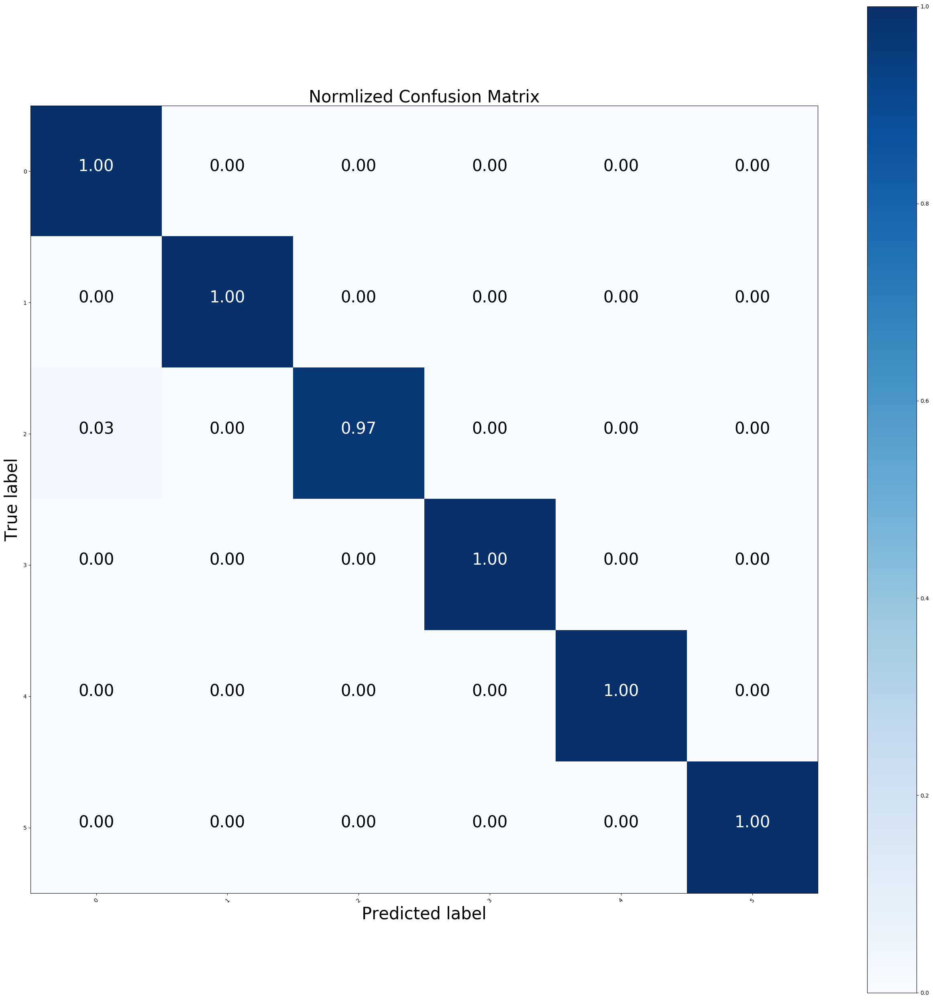

In [166]:
plt.close()
plt.figure(figsize=(25, 25))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.2f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if i==j else "black",
            size=29)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

plt.savefig('output/step5/s5_gm_ncm.png')


In [167]:
from sklearn.metrics import make_scorer, accuracy_score


train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))


accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    NN_classifier,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)


[learning_curve] Training set sizes: [  67   70   74   77   80   84   87   90   94   97  101  104  107  111
  114  117  121  124  128  131  134  198  262  326  390  454  517  581
  645  709  773  837  901  964 1028 1092 1156 1220 1284 1348]


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_h

[Parallel(n_jobs=4)]: Done  12 out of 200 | elapsed:    0.2s remaining:    3.6s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/sh

[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    0.8s remaining:    4.1s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/sh

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning

[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:    2.3s remaining:    3.8s
[Parallel(n_jobs=4)]: Done  96 out of 200 | elapsed:    2.9s remaining:    3.1s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape


[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.685), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.691), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.756), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.744), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.735), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.991, test=0.753), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.782), total=   0.1s
[CV] 

[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:    3.8s remaining:    2.7s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/sh

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/ne

[Parallel(n_jobs=4)]: Done 159 out of 200 | elapsed:    5.3s remaining:    1.4s
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/sh

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning


[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.681), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.717), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.726), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.787), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=1.000, test=0.805), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.991, test=0.790), total=   0.1s
[CV]  ................................................................
[CV] ................ , score=(train=0.992, test=0.812), total=   0.1s
[CV] 

/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning

[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    6.8s finished


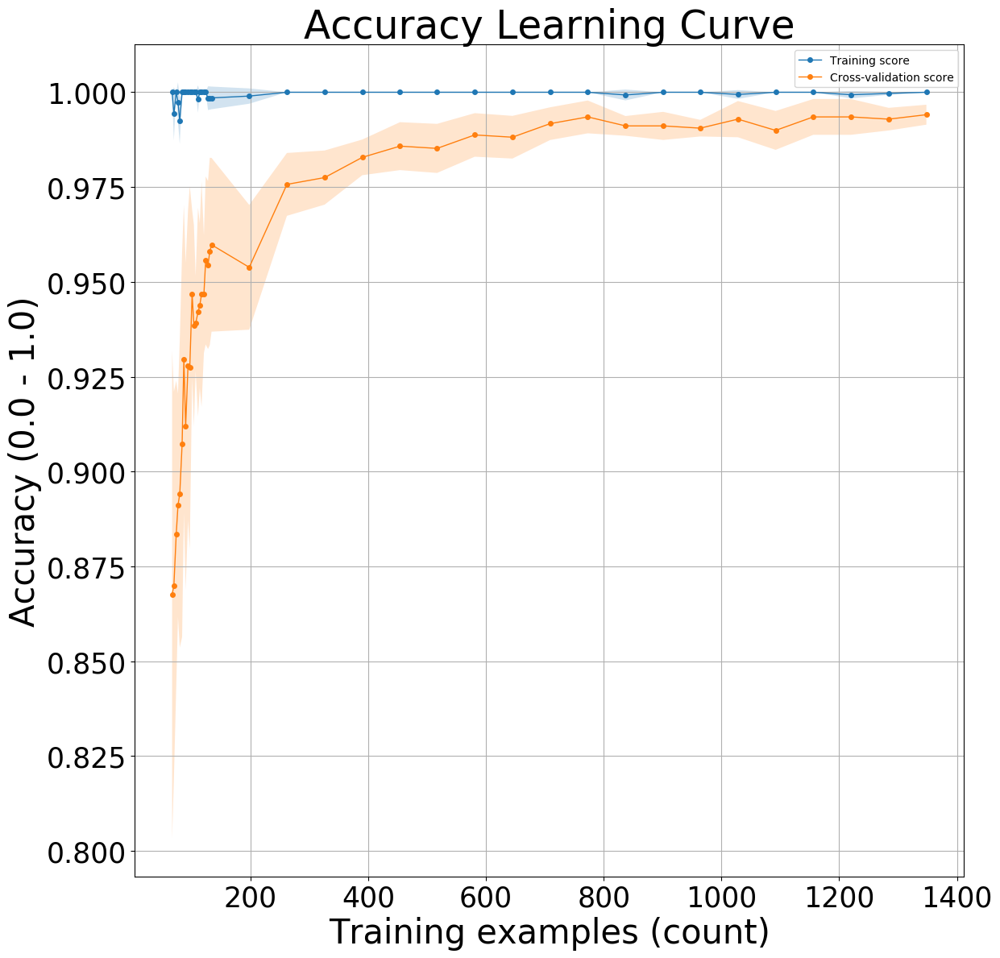

In [168]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")
plt.savefig('output/step5/s5_gm_learning_curve.png')



/home/wei/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
No handles with labels found to put in legend.


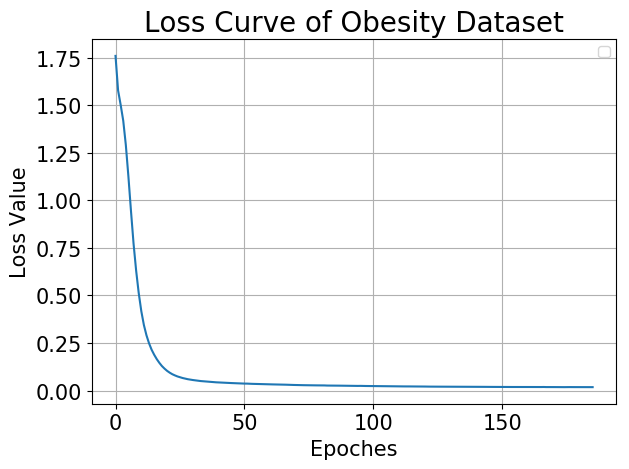

In [169]:
loss_values = NN_classifier.loss_curve_
NN_classifier.fit(training_x, training_y)

learning_rate_init_adjust = [10 ** -x for x in np.arange(-2.0, 6.0)]


plt.show()


plt.close('all')
plt.figure()
plt.title('Loss Curve of Obesity Dataset', fontsize=20)
plt.tick_params(labelsize=15)

plt.xlabel('Epoches', fontsize=15)
plt.ylabel('Loss Value', fontsize=15)
plt.grid()
plt.tight_layout()

plt.plot(loss_values, label="")

plt.legend(loc="best")
plt.tight_layout()

plt.savefig('output/step5/s5_gm_loss_curve.png')
